In [1]:
import pandas as pd
import os   #These two are useful modules
import sys
import time
import numpy as np #Numerical Python
import matplotlib.pyplot as plt

In [2]:
code_dir = os.getcwd()
main_dir = os.path.join(code_dir,"..")
data_dir = os.path.join(main_dir,"data")
results_dir = os.path.join(main_dir,"results")
if not os.path.exists(results_dir):
    os.mkdir(results_dir)
    print("Directory %s created !" % results_dir)

In [234]:
data = pd.read_csv(os.path.join(data_dir,'varianze_bitcoin5.txt'), sep=",", header=None)
data.columns = ["Data", "Price"]
data[['Data','Time']]=data.Data.str.split(expand=True)
data[['Hour','Minute','Second']]=data.Time.str.split(':',expand=True).astype(float)
data[['Year','Month','Day']]=data.Data.str.split('-',expand=True).astype(float)
data['time_of_month_in_minute']=data.Day*1440+data.Hour*60+data.Minute+data.Second/60
print(data)

               Data     Price             Time  Hour  Minute     Second  \
0        2021-09-22  43791.70  19:52:35.325845  19.0    52.0  35.325845   
1        2021-09-22  43791.70  19:52:35.751676  19.0    52.0  35.751676   
2        2021-09-22  43791.70  19:52:36.001670  19.0    52.0  36.001670   
3        2021-09-22  43798.71  19:52:36.251682  19.0    52.0  36.251682   
4        2021-09-22  43798.71  19:52:36.487399  19.0    52.0  36.487399   
...             ...       ...              ...   ...     ...        ...   
1338753  2021-09-27  42938.02  01:13:43.133499   1.0    13.0  43.133499   
1338754  2021-09-27  42942.87  01:13:43.411511   1.0    13.0  43.411511   
1338755  2021-09-27  42942.87  01:13:43.725500   1.0    13.0  43.725500   
1338756  2021-09-27  42942.87  01:13:43.999499   1.0    13.0  43.999499   
1338757  2021-09-27  42942.87  01:13:44.289496   1.0    13.0  44.289496   

           Year  Month   Day  time_of_month_in_minute  
0        2021.0    9.0  22.0             32

In [8]:
what=data.Hour[20000]
print(type(what))
print(what)

<class 'numpy.float64'>
21.0


In [203]:
#Cut datas you need
def cut_datas(every_minutes,long,bins,start_when_day,start_when_time):
    
    h_in,min_in,sec_in=np.asarray(start_when_time.split(':')).astype(float)
    y_in,m_in,d_in=np.asarray(start_when_day.split('-')).astype(float)

    start_minute=d_in*1440+h_in*60+min_in+sec_in/60
    stop_minute=start_minute+(long+1)*every_minutes
    
    ranges=np.arange(start_minute, stop_minute, every_minutes)
    
    temp=data
    temp['range'] = pd.cut(temp.time_of_month_in_minute, ranges, include_lowest=True)

    ax=temp.hist(column='Price', by='range', bins = bins, figsize=(30,20))
    
    prezzi=[]
    bins2=[]
    for axx in ax:
        for x in axx:
            p = x.patches
            xlim=x.get_xlim()
            xx=np.around(np.linspace(xlim[0],xlim[1],bins),1)
            prezzi.append(xx)
            heights = [patch.get_height() for patch in p]
            bins2.append(heights)
    
        
    return prezzi,bins2
    

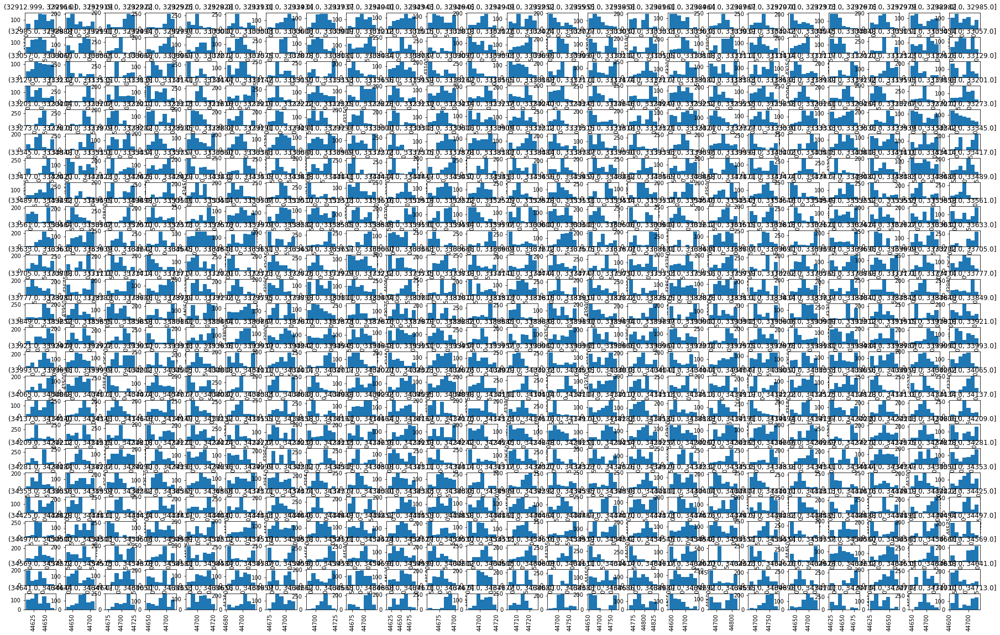

In [242]:
start_when_day='2021-09-22'
start_when_time='20:33:00'
every_minutes=3
long=600
bins=7
prezzi,binnes=cut_datas(every_minutes,long,bins,start_when_day,start_when_time)

In [212]:
print(prezzi,binnes)

[array([44830.3, 44853.4, 44876.6, 44899.8, 44922.9, 44946.1, 44969.3]), array([44866.9, 44882.6, 44898.3, 44913.9, 44929.6, 44945.3, 44960.9]), array([44835.6, 44850.5, 44865.4, 44880.3, 44895.2, 44910.1, 44925. ]), array([44805.1, 44820.2, 44835.3, 44850.5, 44865.6, 44880.8, 44895.9]), array([44820.4, 44858.5, 44896.6, 44934.7, 44972.8, 45010.9, 45049.1]), array([44980.6, 44991.9, 45003.1, 45014.4, 45025.7, 45036.9, 45048.2])] [[111.0, 102.0, 254.0, 162.0, 255.0, 46.0, 172.0], [143.0, 66.0, 240.0, 207.0, 156.0, 158.0, 144.0], [281.0, 317.0, 265.0, 140.0, 143.0, 0.0, 27.0], [57.0, 213.0, 91.0, 183.0, 242.0, 246.0, 106.0], [83.0, 63.0, 97.0, 334.0, 67.0, 137.0, 382.0], [89.0, 116.0, 214.0, 404.0, 241.0, 67.0, 33.0]]


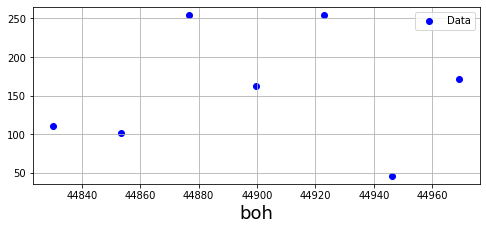

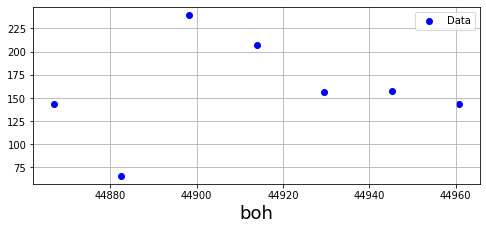

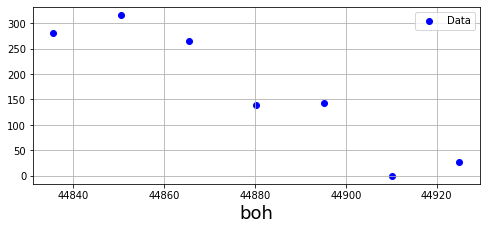

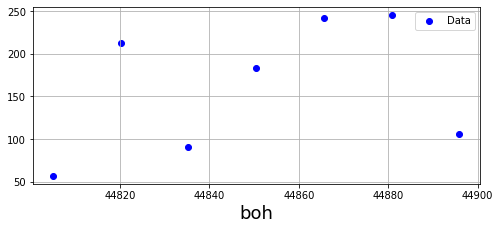

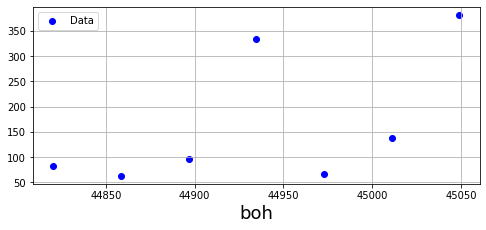

...

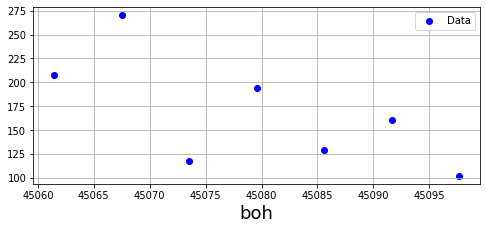

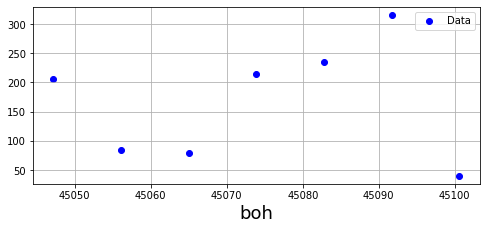

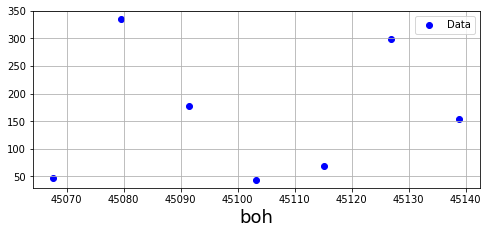

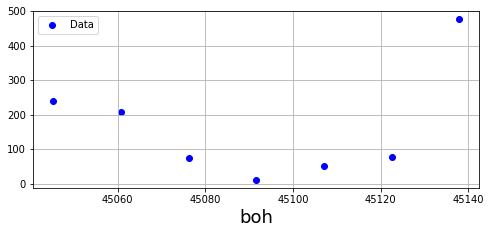

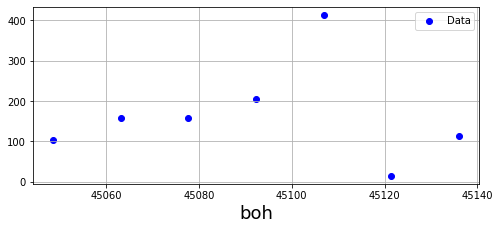

ValueError: x and y must be the same size

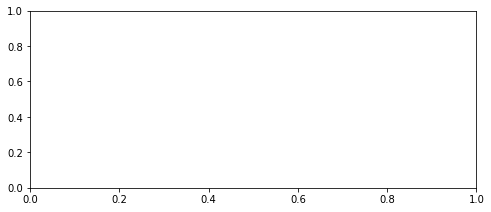

In [220]:
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import matplotlib
import time

for k in range(len(binnes)):
    plt.figure(figsize=[8,15])
    plt.subplot(411)
    plt.scatter(prezzi[k],binnes[k],marker="o",color="blue",label='Data')
    plt.xlabel("boh",fontsize=18)
    plt.grid()
    plt.legend()
    plt.show()
    

161.71873406136564 48.23642738624401 43662.77839591623
0.5992416683100774


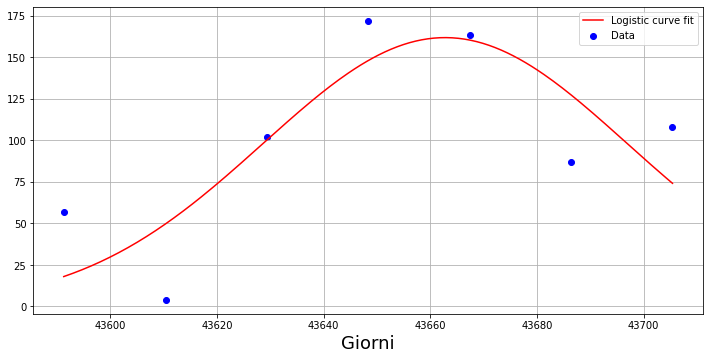

202.2918492421157 129.3032480672205 43492.54037572653
0.05095921535959874


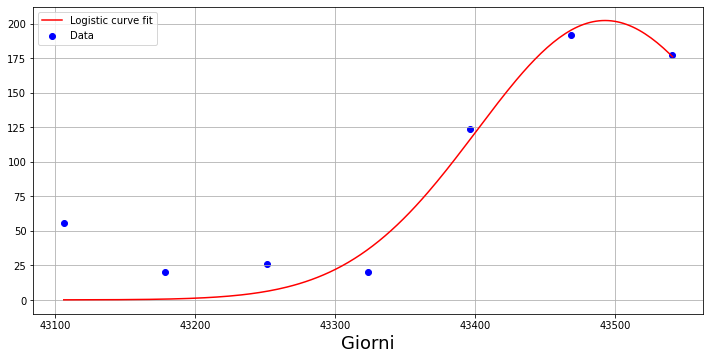

260.5953190707936 75.16038288141661 43396.17388565644
0.10439568325126121


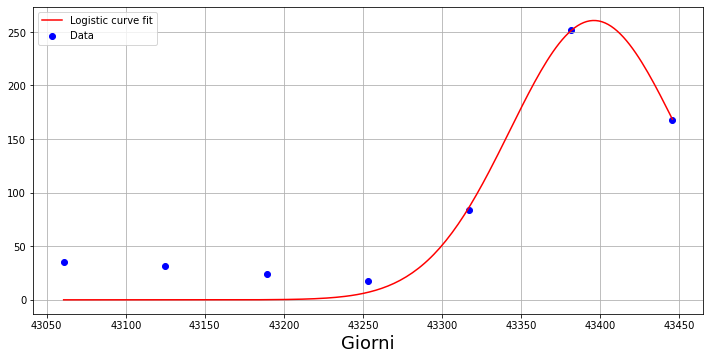

281.2474899995007 34.10619014563062 43246.766921714756
3.624031691605624


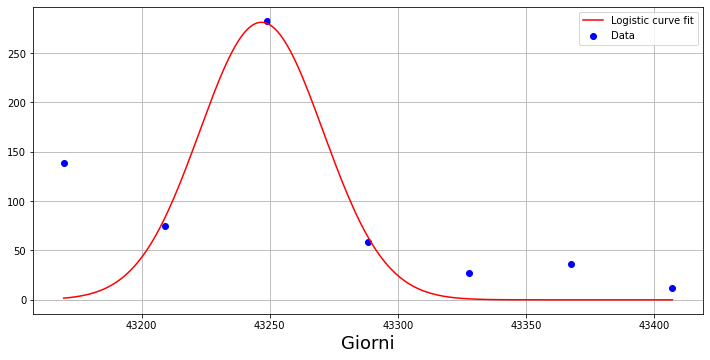

273.9428689035436 36.497794499870494 43113.47023864884
2.7889716247727696


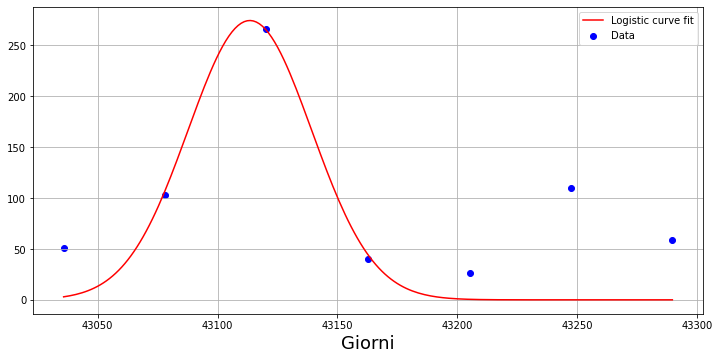

157.11856273848537 60.08633897808431 43183.1060433259
0.07513390649103437


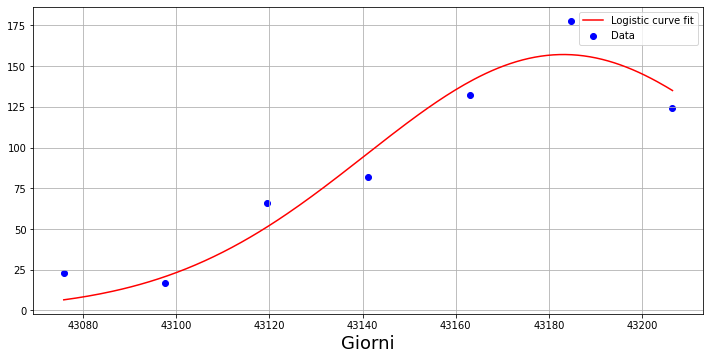

153.15663015044814 89.13985201454878 43173.903669135834
0.02323248121118681


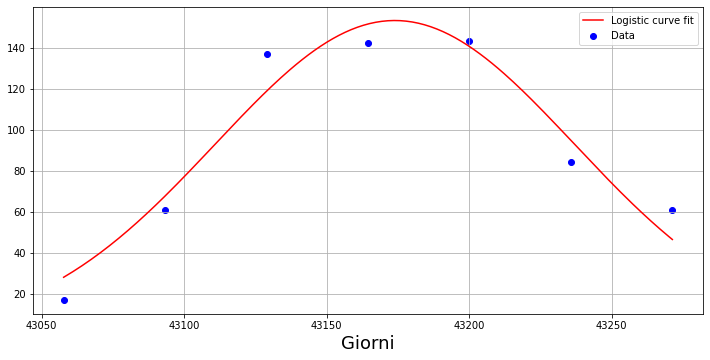

143.64967839202626 90.86132345370694 43038.30141623127
0.09990489638284393


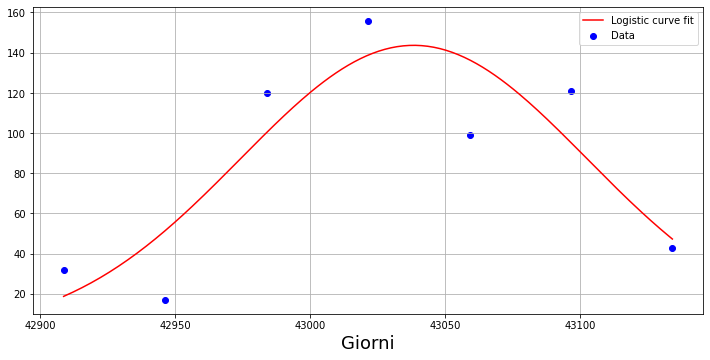

116.2497367070162 110.6006233282811 43070.205123794534
0.02165774187049429


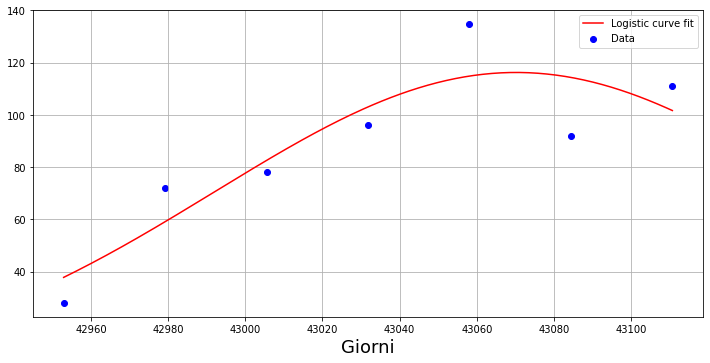

89.76519045623951 125.67326460389258 43007.07826431564
0.08480499343177503


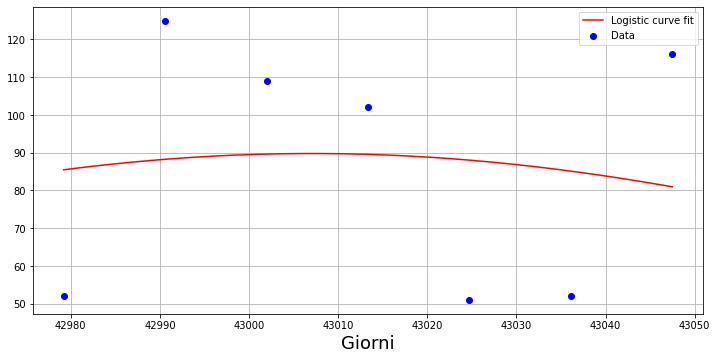

195.01396373923495 84.3307430680456 42897.23586084317
0.2112054942744115


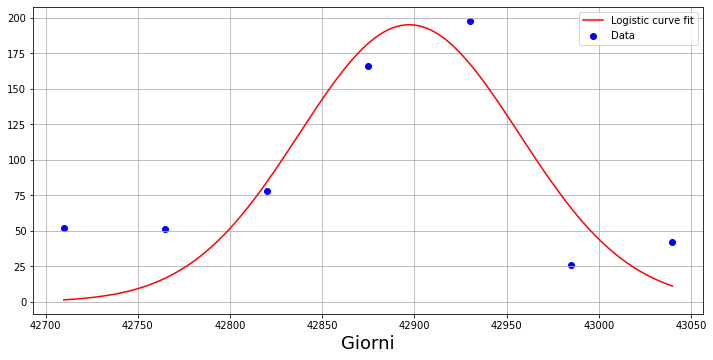

101.34225044457592 320.0538471578944 43052.82981238045
0.022349332760565027


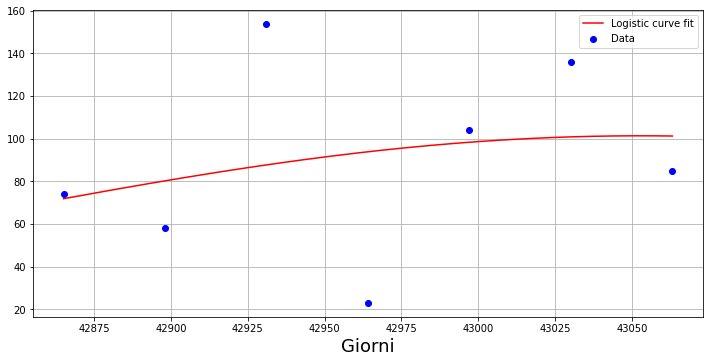

175.5306015635964 59.00227084954329 43121.73530362298
0.07579173296303214


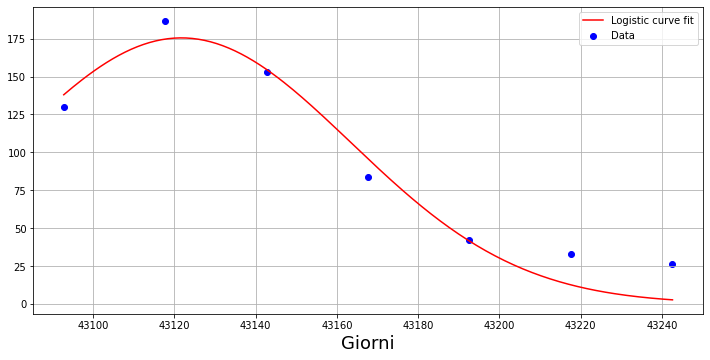

231.56416293807015 29.864603688861322 43233.0166754639
7.785563700113452


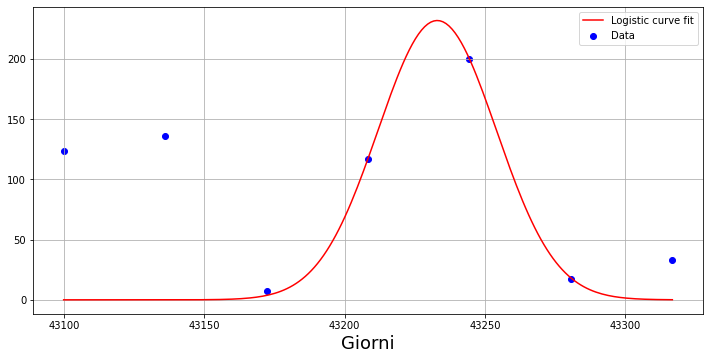

146.0916618418272 94.94503732138429 43267.22948968033
0.08436549628851213


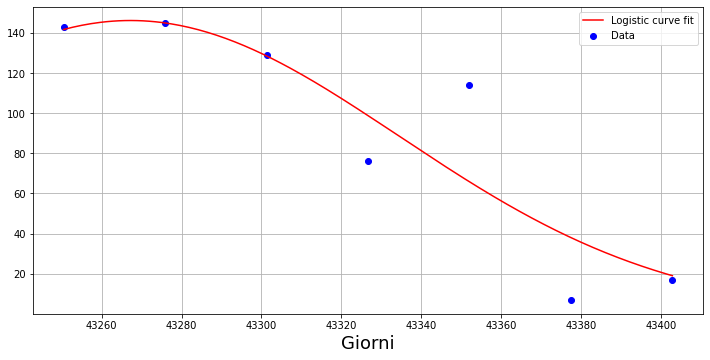

232.44800997479712 28.113325757781865 43362.98554510207
1.1605805271688898


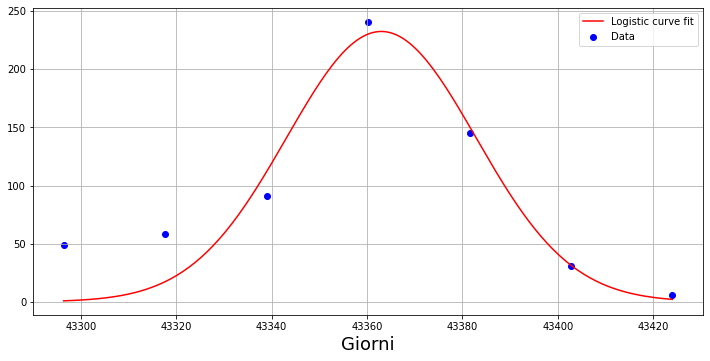

190.65427909575044 32.34548853433275 43348.116843599826
2.782088746242815


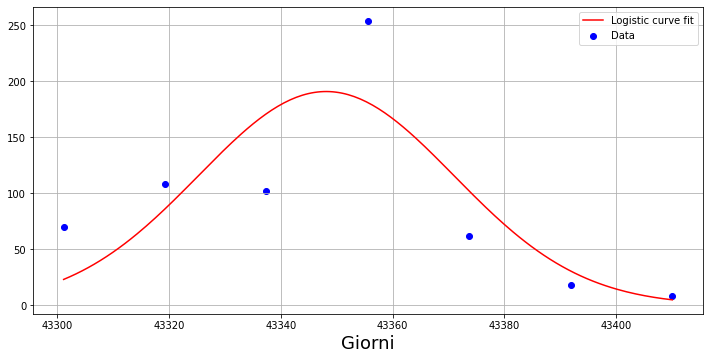

200.71677123090157 20.764121666479028 43247.26857319303
0.33641620773626363


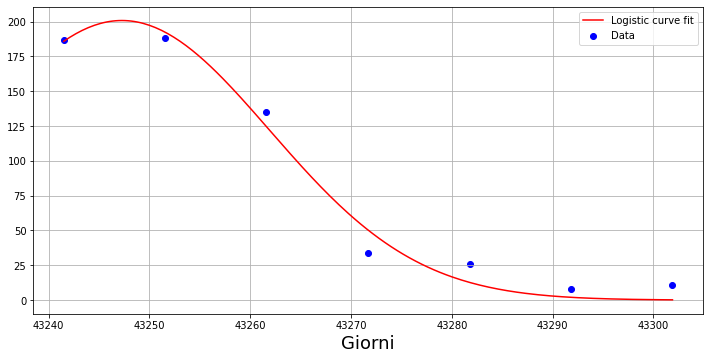

190.34395603972246 21.756007808512386 43268.843802865966
1.8856366538549132


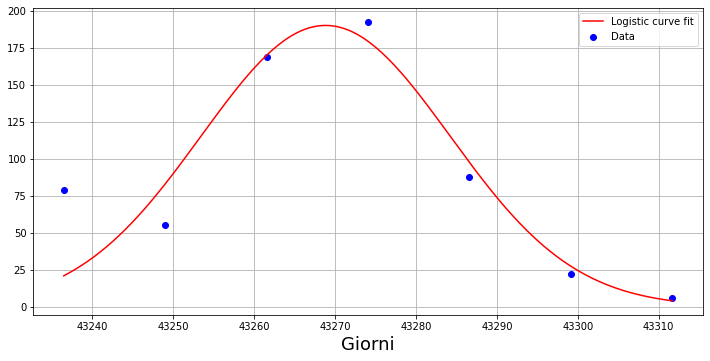

150.03699173330446 23.77224226155244 43309.640590568124
0.8598119728547097


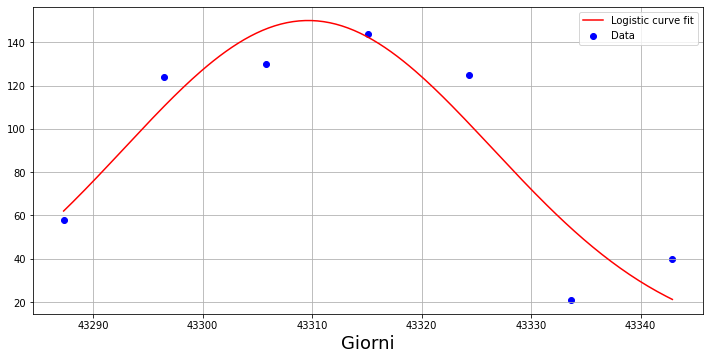

197.55216792563428 35.77342938901307 43281.599108886796
1.6158276070098334


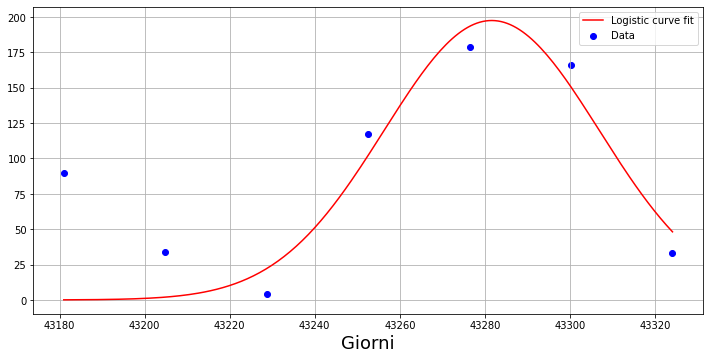

400.06478593173875 11.550537126782661 43232.53038045146
11.624949989320287


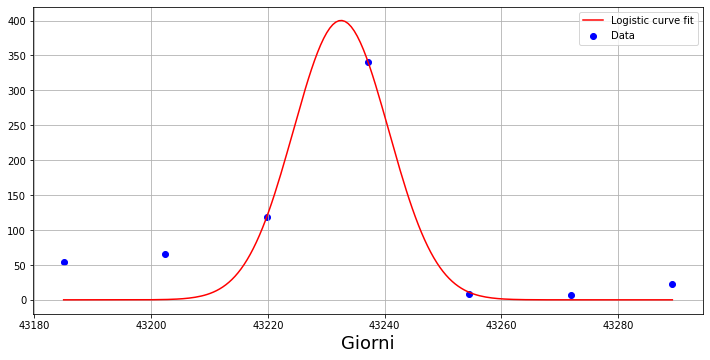

180.83276955622026 18.929268194851158 43286.659196549335
3.5938758581826726


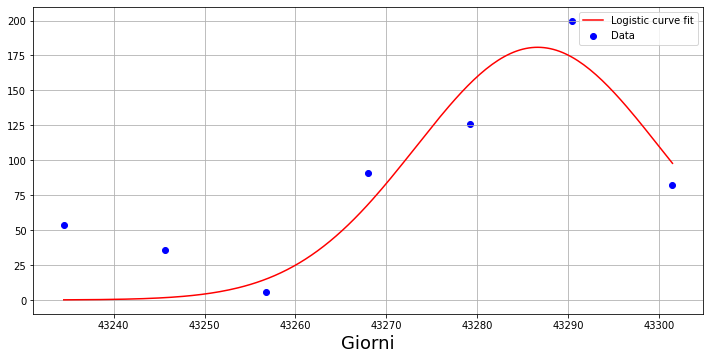

2844.261748807423 359.71491056779286 43942.11546443159
0.01891471720988086


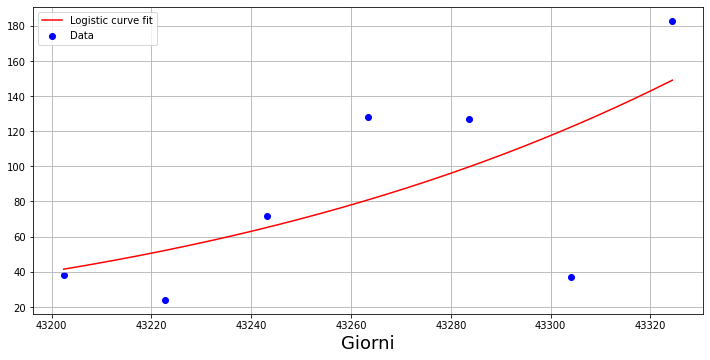

178.22965207482804 26.813702574666685 43224.69957076326
1.4718144867482819


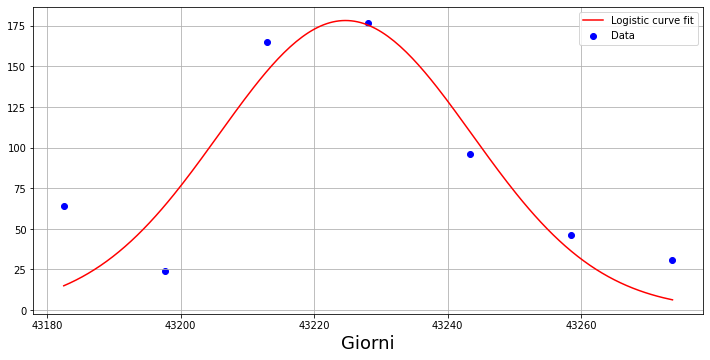

433.2103430606987 24.794642424243204 43180.11549953477
0.26706476621271863


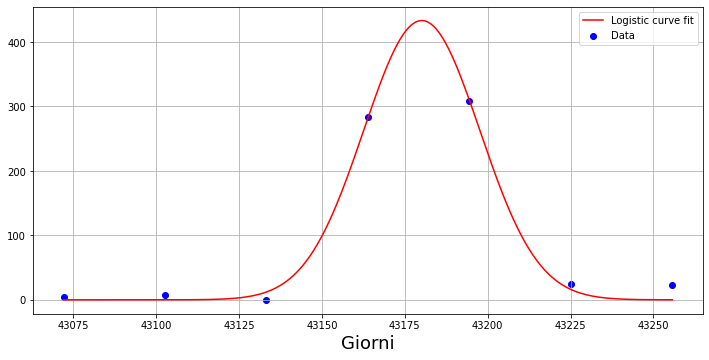

172.35551882145705 30.353567871280255 43047.48162792508
0.7632940567515705


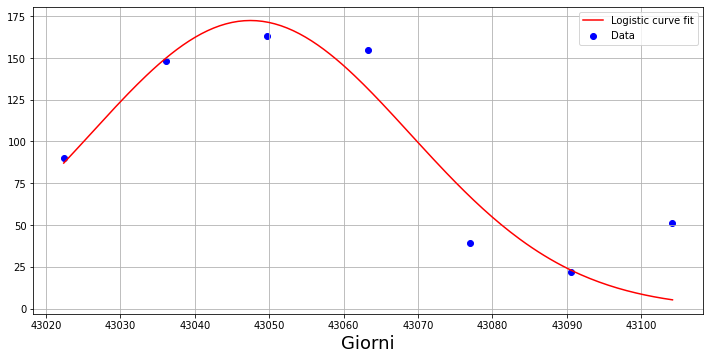

155.88469796649716 42.988271816805714 43118.91208275829
2.67548786582788


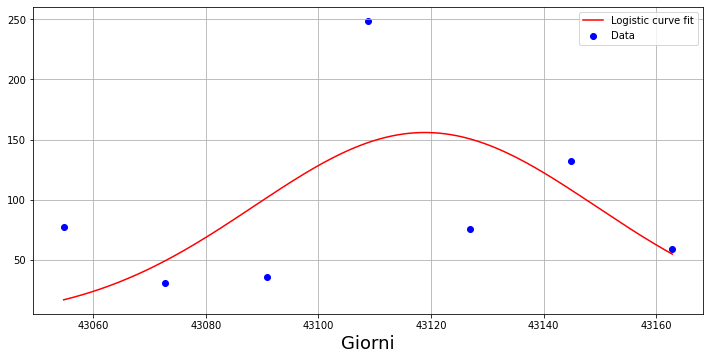

136.52477104144847 28.097203992171544 43165.62422703111
2.8031023851860026


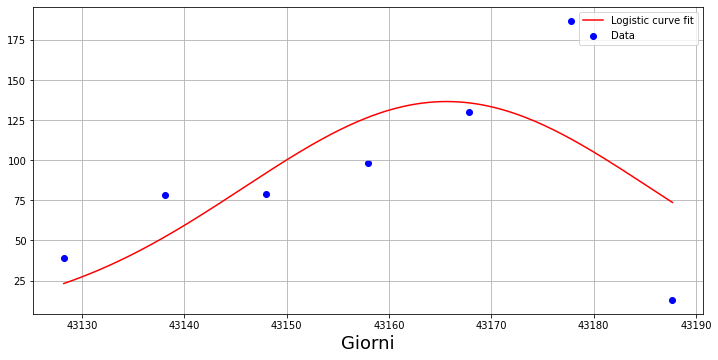

237.6144837625741 15.866825824321214 43171.612397682286
5.090429833324974


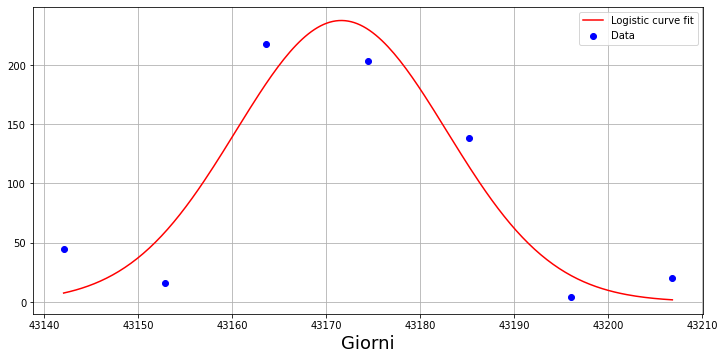

175.40028806949258 20.663085321260485 43267.23092672356
19.21483346166684


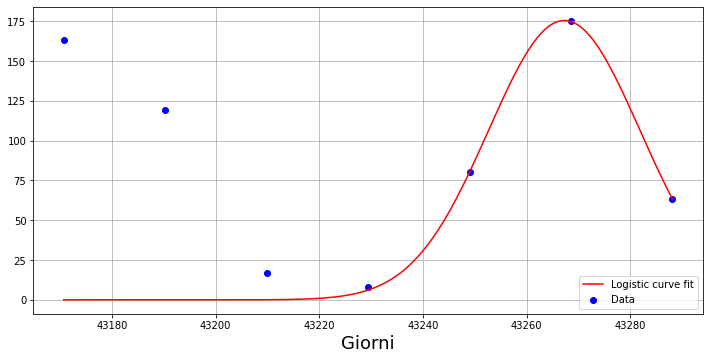

216.51085663687851 23.95842352171322 43317.30381609475
3.8036461285021184


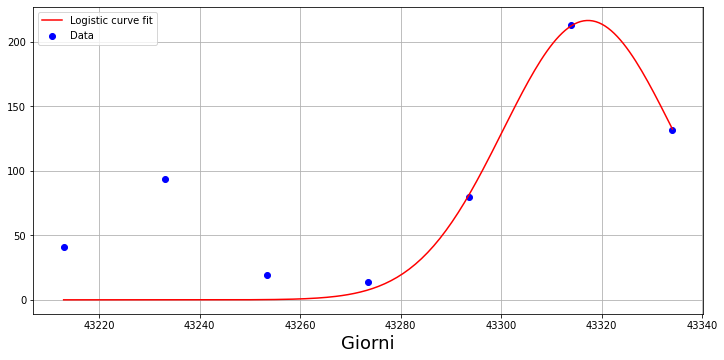

223.6775550669522 24.331966722683134 43352.67661713417
1.5903533356416344


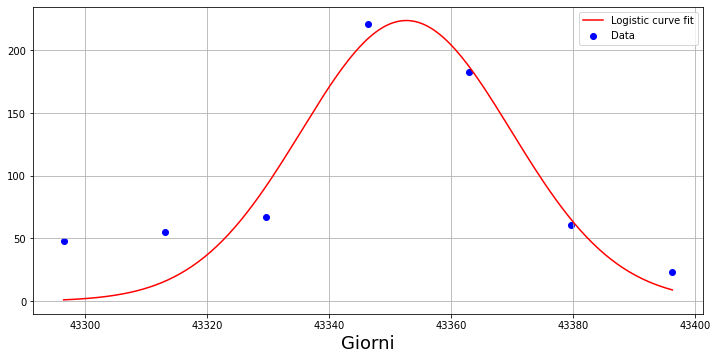

178.28013704366032 26.989969307786282 43326.65005359796
3.0196952401346455


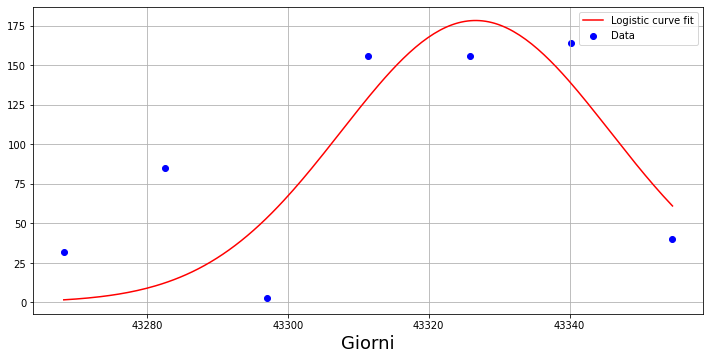

118.28206008067676 30.932946451265536 43274.12432707458
0.7305487497110991


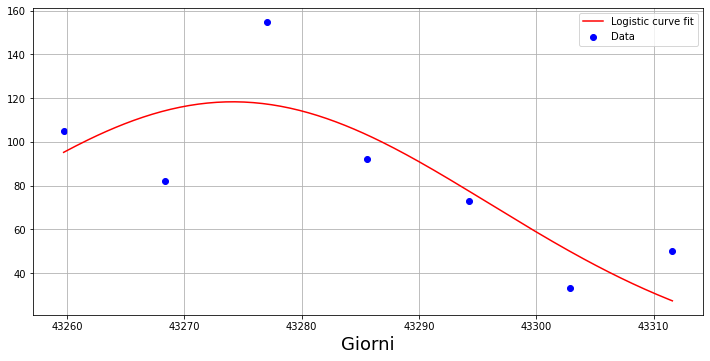

156.74806000832066 43.64960340567774 43301.3483413067
1.4448548308321543


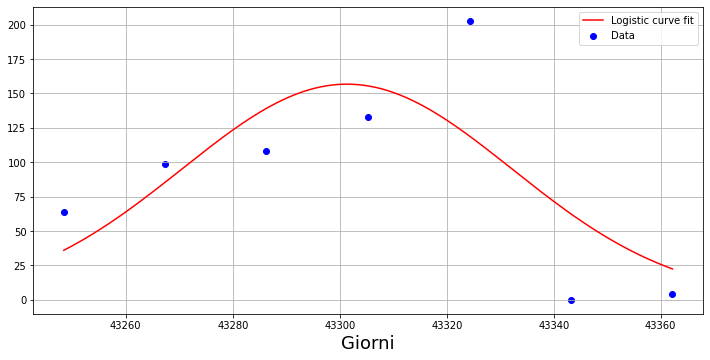

168.79865754246669 21.37478950474385 43278.081780644854
3.093392783747681


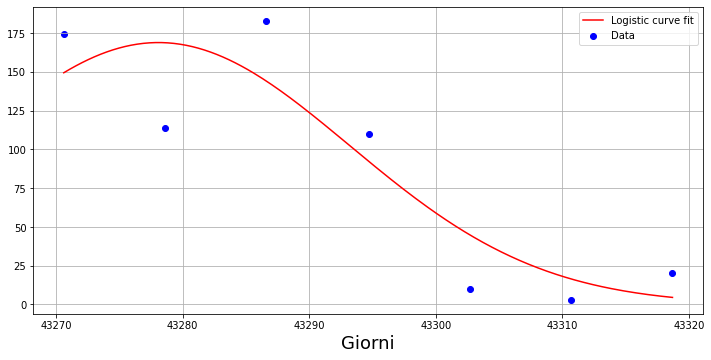

495.54816696173293 6.395991856010946 43311.16100784287
123.35257193281663


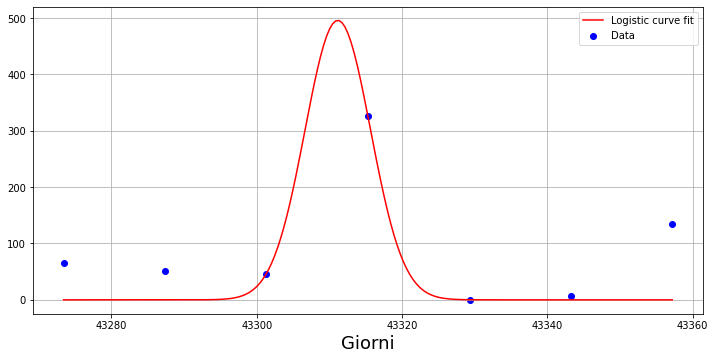

141.35768625842172 500.1997988441482 43642.919447468164
0.005568672675702132


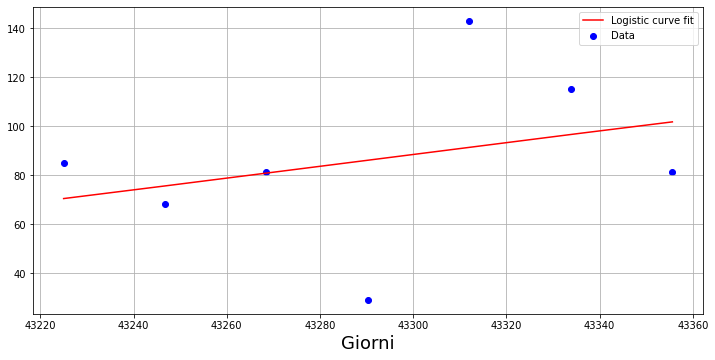

114.40357046934731 36.93775461242941 43220.87814250924
1.183255163320144


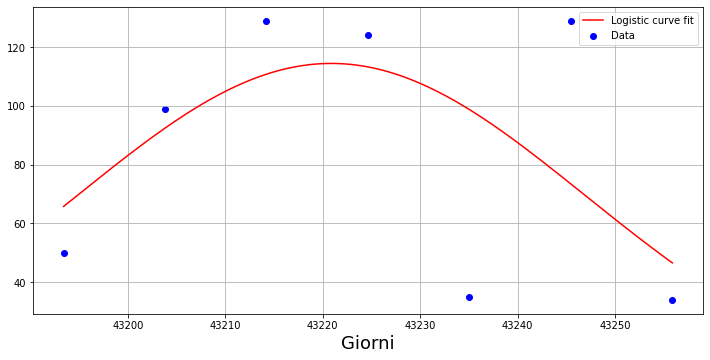

109.4348497231314 67.70846927115363 43283.123740433584
0.04336202873385597


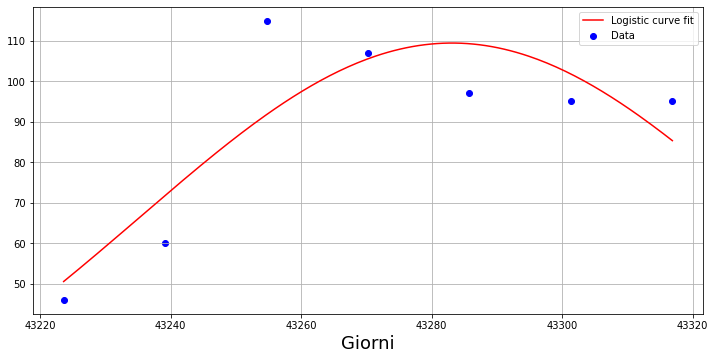

344.0478514876695 14.214805194522729 43235.66778555974
25.426006592950635


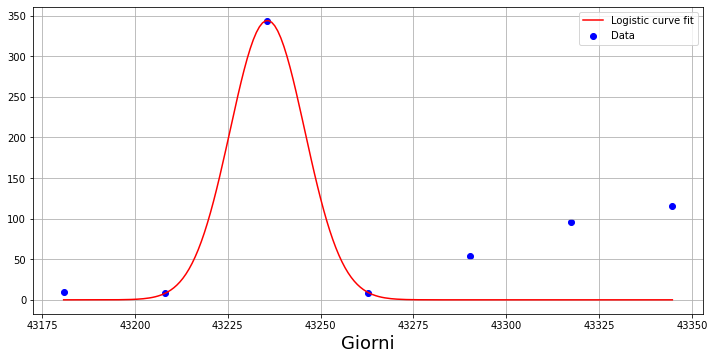

151.51228337870472 25.467805848912736 43392.602373581714
5.453594996590654


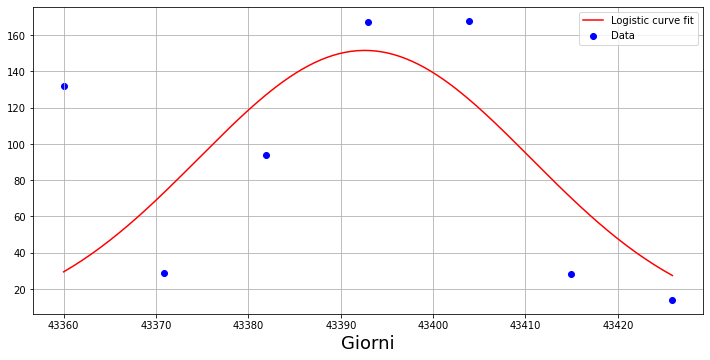

134.6285679242612 31.561982965561462 43370.598041662444
5.297438452937721


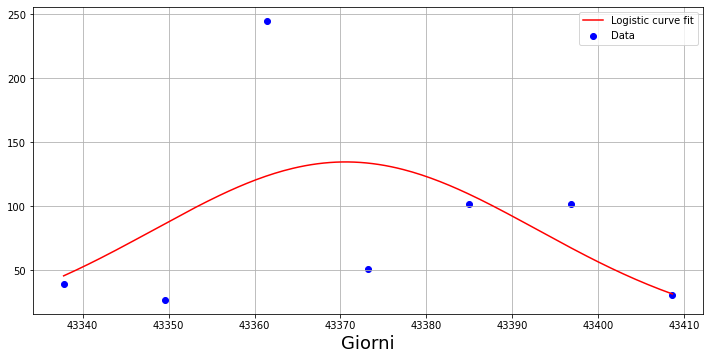

219.8091409916 21.800790412364158 43297.70893715411
1.8231030472569718


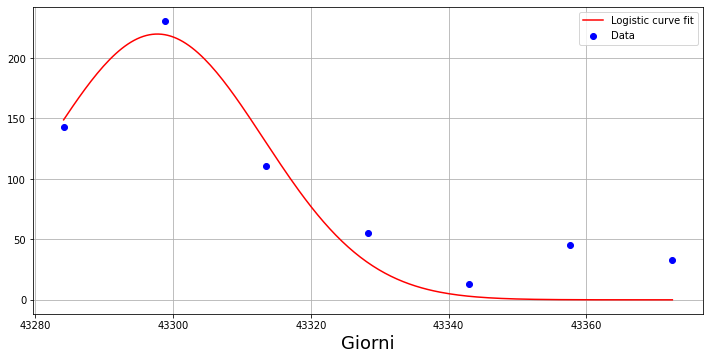

114.8213367084282 33.9431722585353 43349.517412697285
0.370060417763152


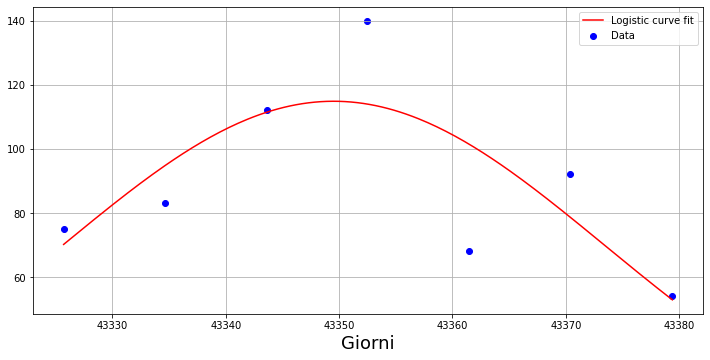

123.59858579421258 57.38831140898763 43407.04384946849
0.07602805564270537


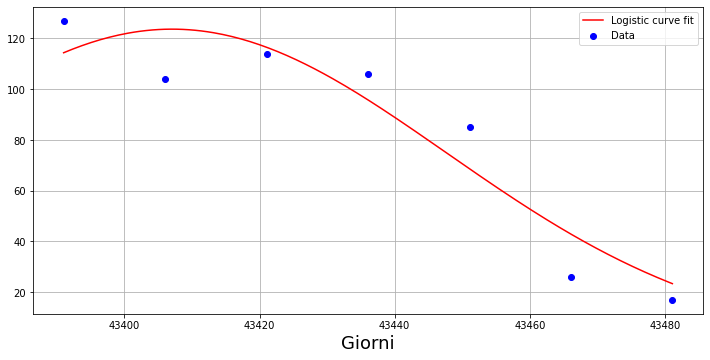

273.0284509299373 17.753429151213478 43334.617296821685
21.893980527919453


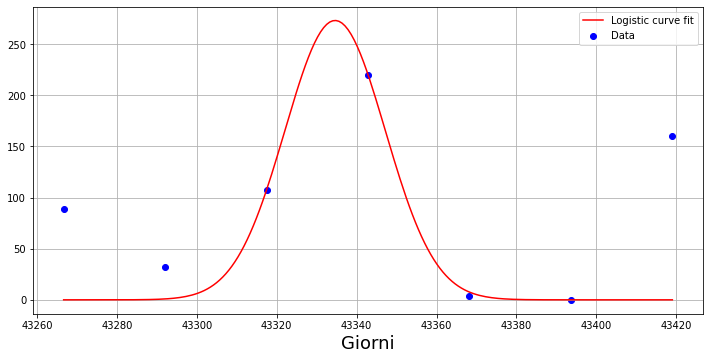

207.26064043563804 10.114824078827148 43209.247963623464
13.848235624233704


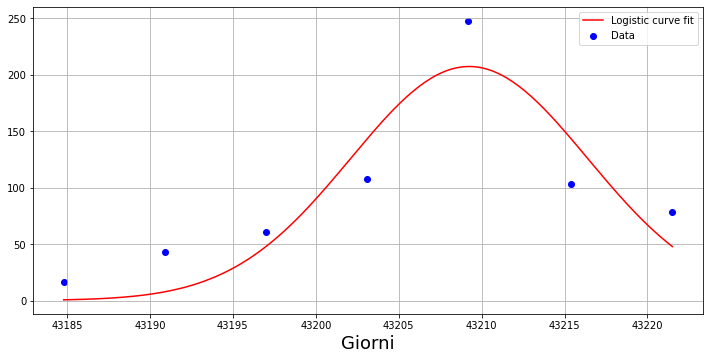

131.48879044585038 34.425453948197145 43221.7794047
1.8002343821057512


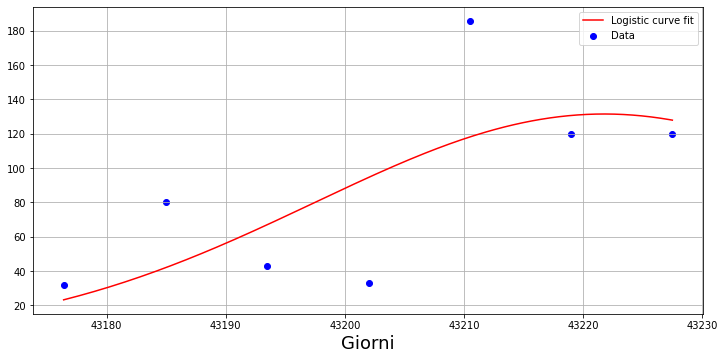

108.57786918044133 102.08366459293498 42959.605110875025
0.2673780864489922


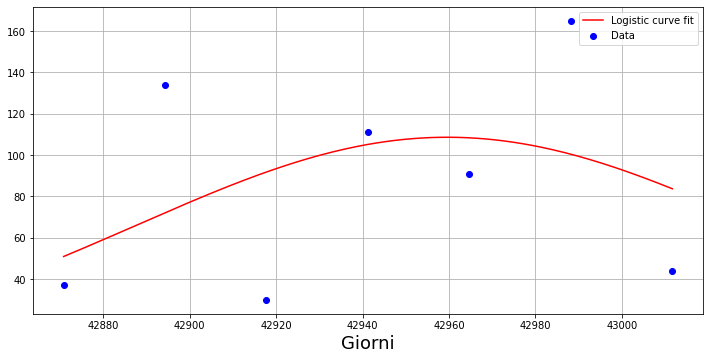

182.0188824256399 30.947461201193526 42974.15229083684
1.929552708285102


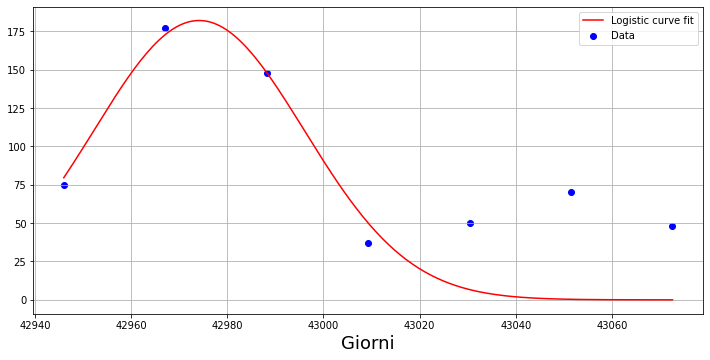

592.1469607885704 109.69866912078881 43221.359053600376
0.3031703632512376


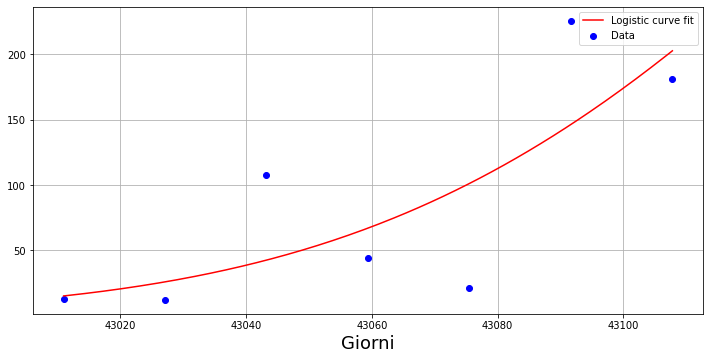

157.00537987986263 41.2950891769723 43160.3727616613
0.5016726267207552


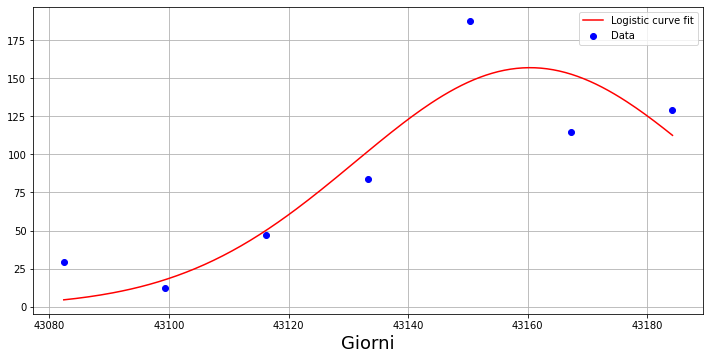

199.1495769661705 13.177227056934335 43171.524442087866
9.27250593981597


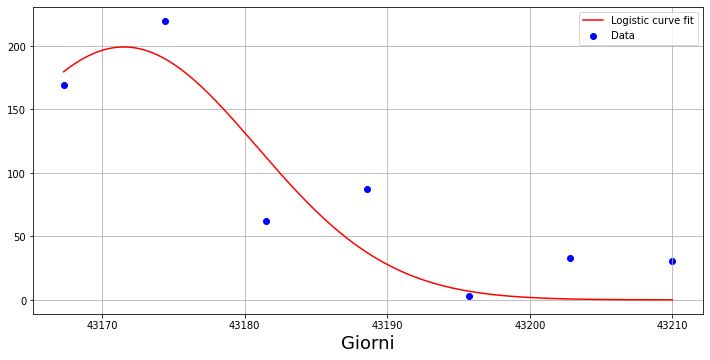

184.17435551512204 26.757647221349362 43304.48318727261
11.04930071052225


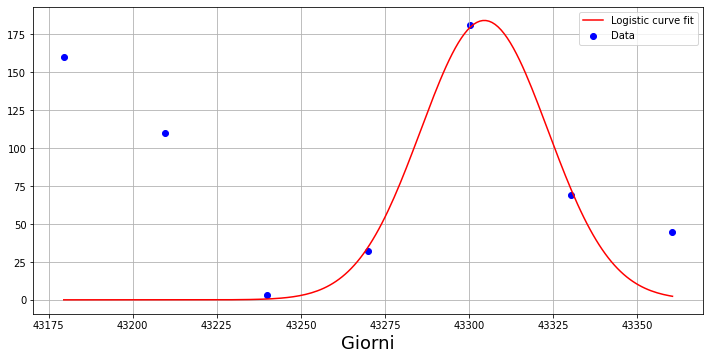

378.5890467683083 260.07061633677205 43025.64545646078
0.031249094500880953


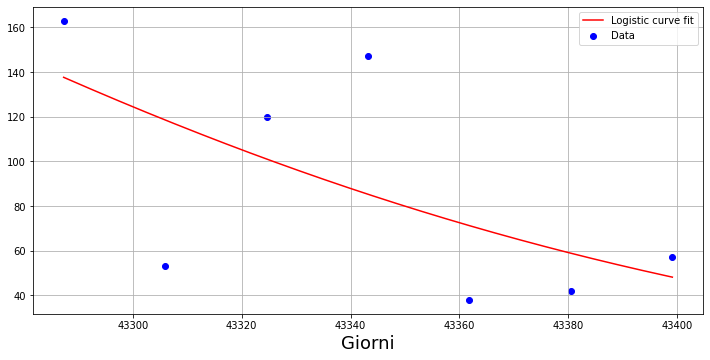

388.8971036196661 22.96542015827847 43308.04316224609
0.11401440268734922


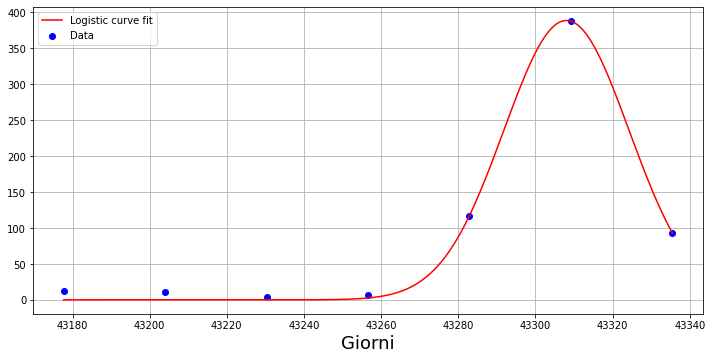

109.19482548901577 71.83679756492701 43168.610841375004
0.6617402221907275


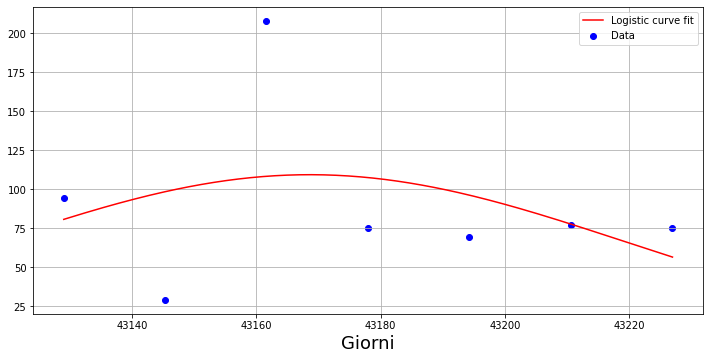

142.31988685718275 204.0566091497413 43004.77890170793
0.0719836344239694


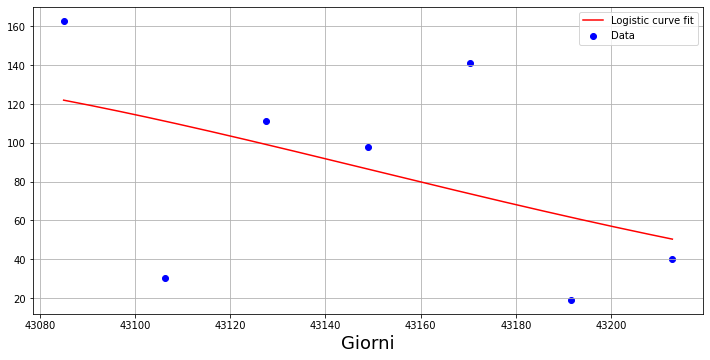

307.50196613899647 13.615804282842303 43122.69632364905
2.046585755933701


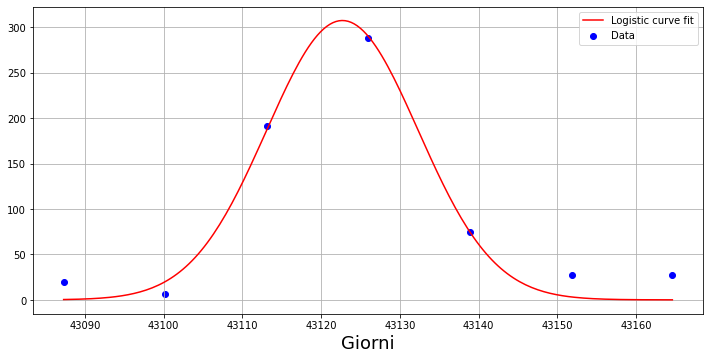

313.32362537264106 15.593092951278939 43070.54258594627
6.4884392369787705


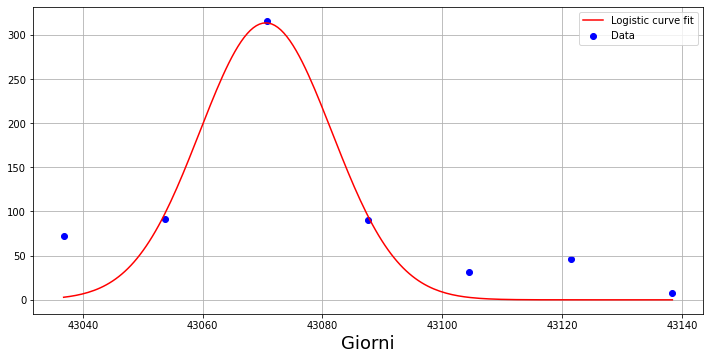

121.77910309269616 77.03255591524535 43109.40759048133
0.11520652733603995


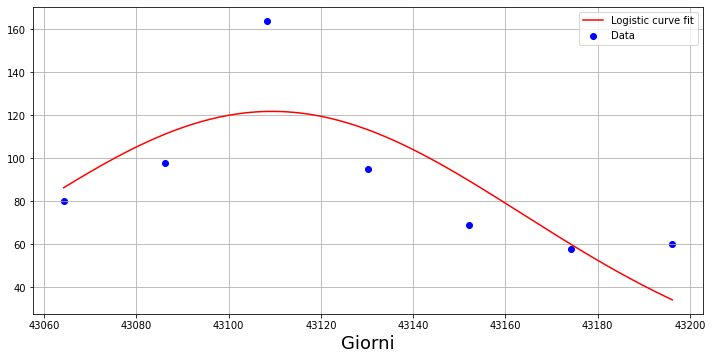

132.73306559301676 63.656037624334964 43227.305171876586
0.33734858463953693


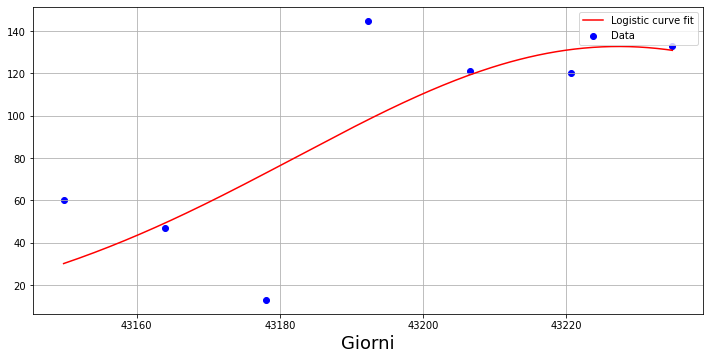

213.35016700663715 46.88259366937666 43192.18403753595
0.43210409546126627


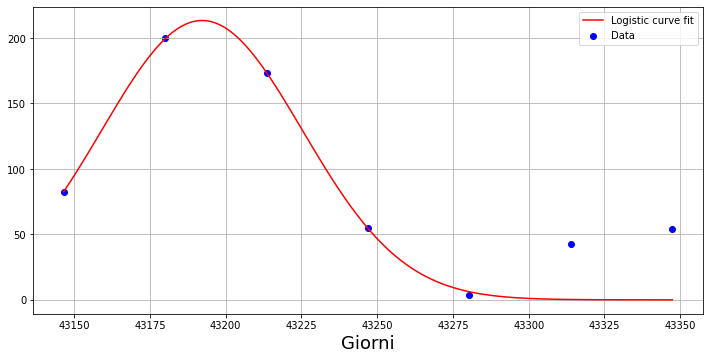

100.93777418471264 162.93971880132912 43338.18778253815
0.02279730586902859


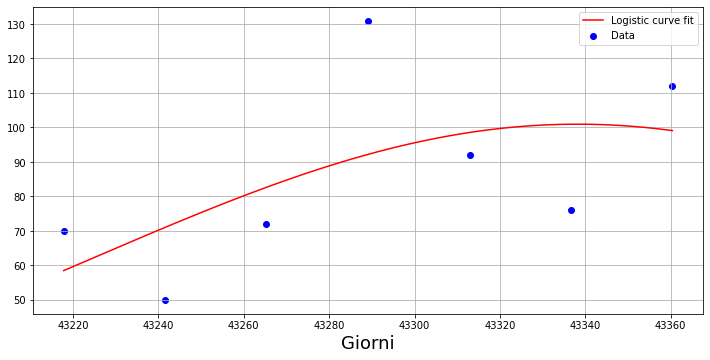

205.8076402142711 18.56054702198196 43298.46513385403
5.48112646903484


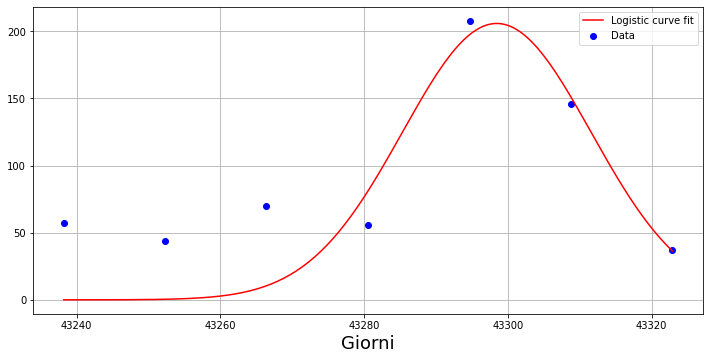

219.92350737972757 23.86937575346435 43320.76398667197
7.8857283684323125


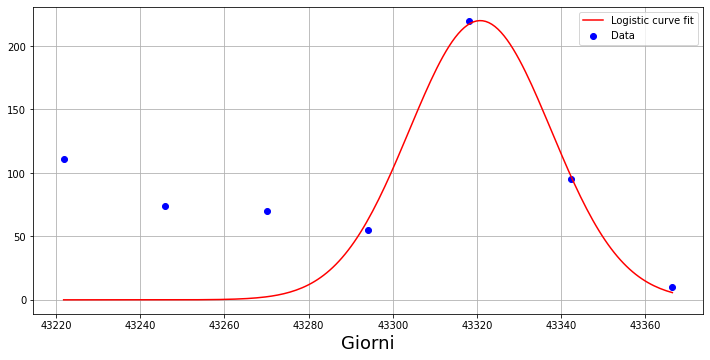

171.05928932699996 25.855458966640384 43326.2252136117
2.000834401090757


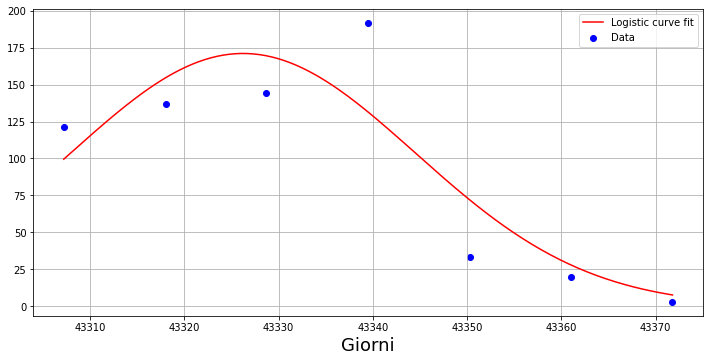

222.22789162753685 37.50048091344466 43313.927906782
1.234630822974236


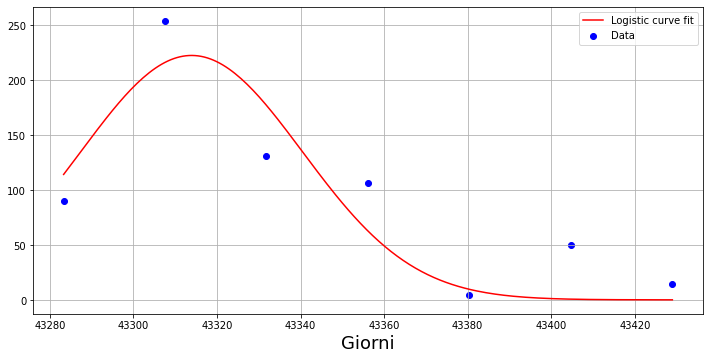

128.74236109275918 31.93952865432752 43378.28078531872
0.6390553641963865


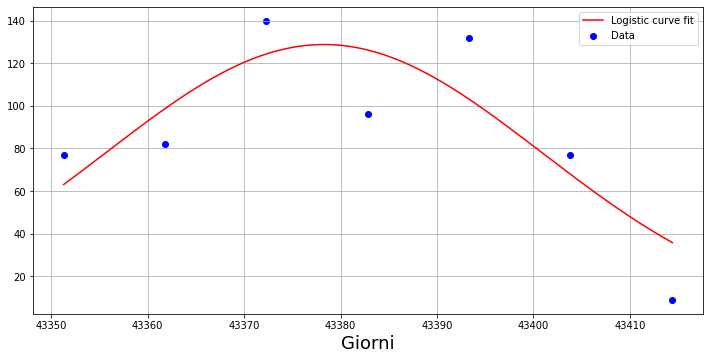

160.38534362385664 49.691719942772956 43391.40160027042
0.8600146321534643


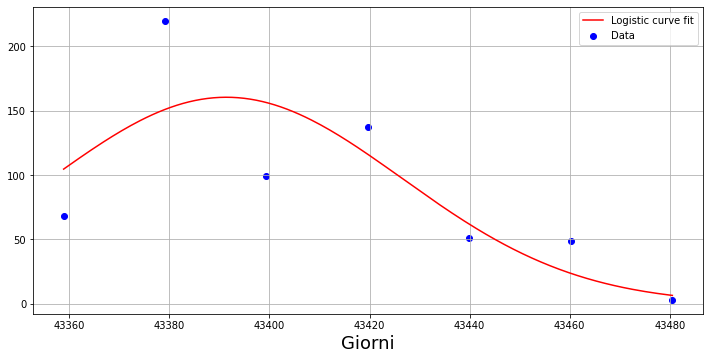

134.70586492759335 23.53177903324121 43409.40220101904
1.6907376356341306


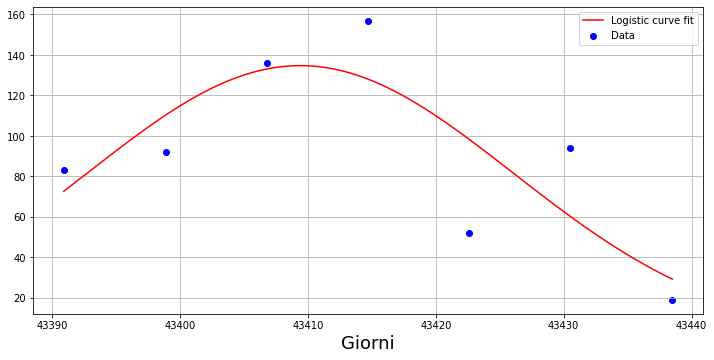

243.82823151141596 22.34048232531432 43401.90937512939
1.1613138264235636


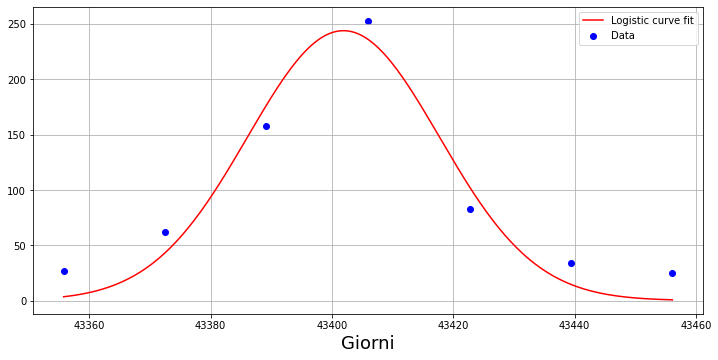

231.00905873191203 25.72985546818792 43404.15309846369
1.6183896368510748


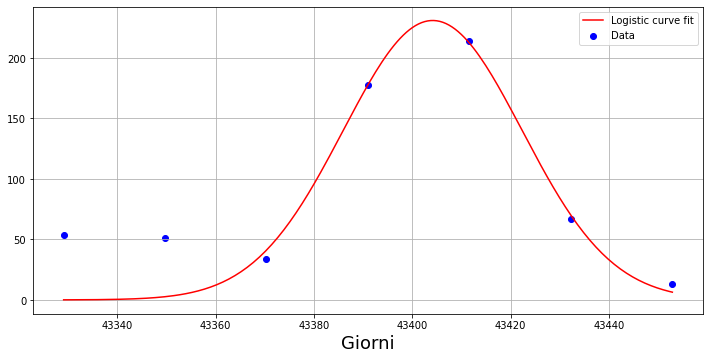

207.05987573752907 16.5632685432696 43419.37921832147
0.4309760238765417


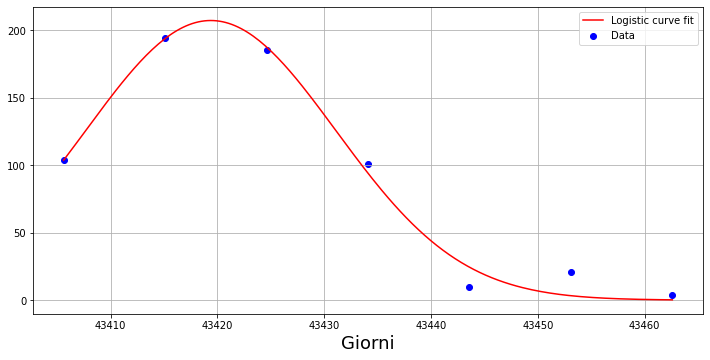

372.49749174190384 11.25802923173646 43420.1323503984
10.825881914866459


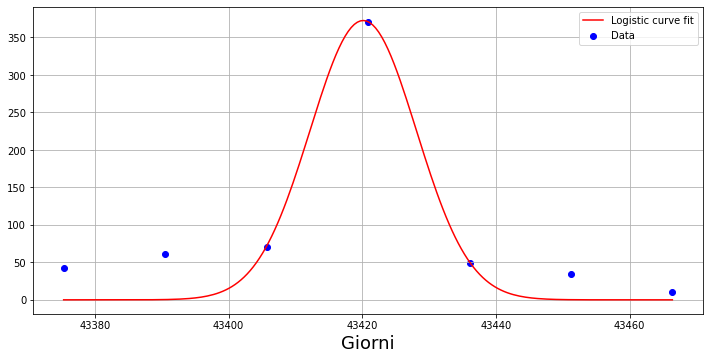

160.08217963774433 25.101580083333083 43394.35483132617
2.327434053842436


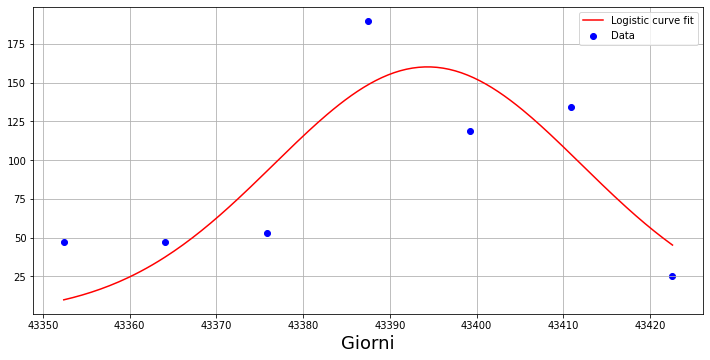

358.1870875946827 9.66151280001797 43370.7945344322
8.22957524076276


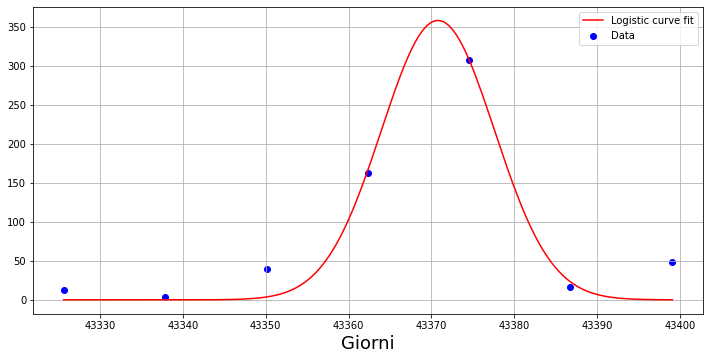

350.95730381035867 7.608319866679128 43364.19503876216
7.937501299077589


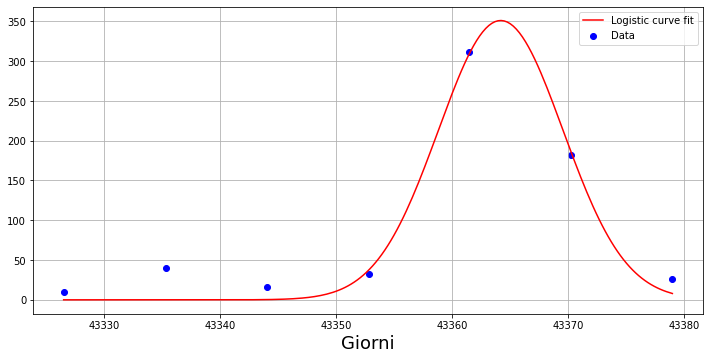

207.48458856990135 15.025370091836711 43368.31833361409
4.662809212759919


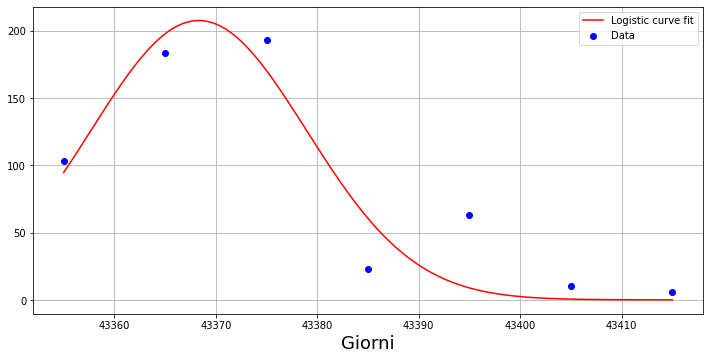

201.89918172895906 37.88440869888229 43459.49425624942
0.6923944896717288


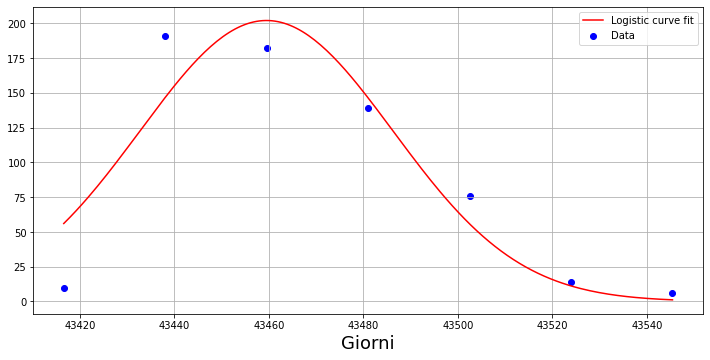

243.2807616345112 15.872261640922675 43419.32440633812
17.2025166411979


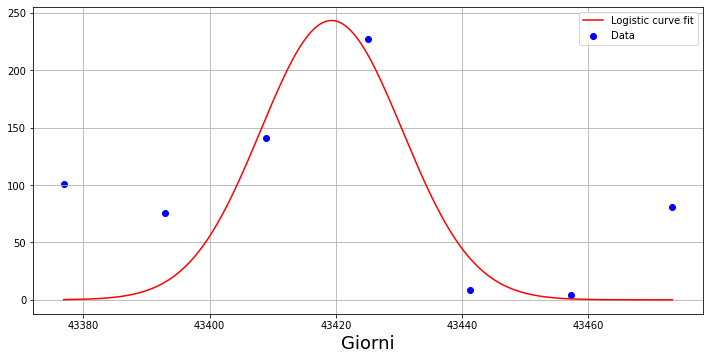

248.5760817954716 9.420393148015844 43395.753954208565
7.589015290415221


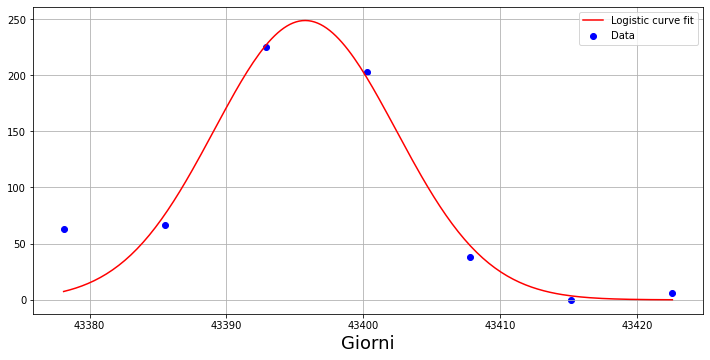

142.9114698309693 19.239118829923513 43382.4491336396
6.928017613741325


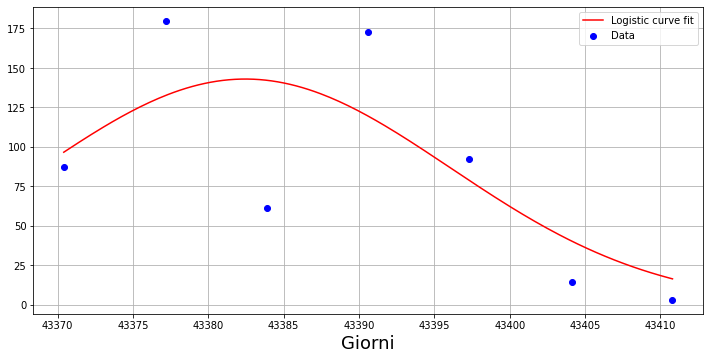

177.65948521743377 -7.549500713553967 43384.86597082003
22.873663189673817


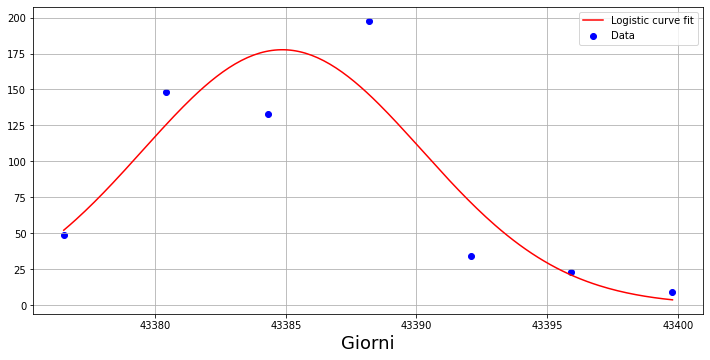

254.30363374343787 15.373962097696136 43401.25555847356
5.535831455085728


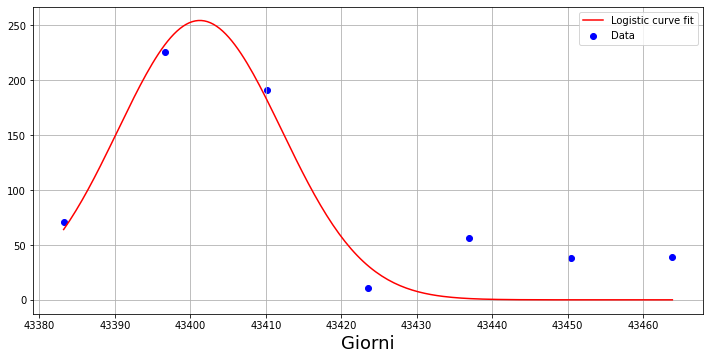

182.52632502740096 14.658638149697834 43430.15419634588
1.7167244413130542


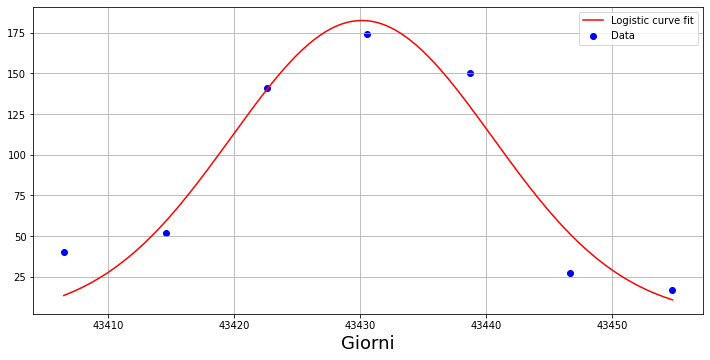

125.24662110005845 47.30466980354898 43426.8111690586
0.5630916961734037


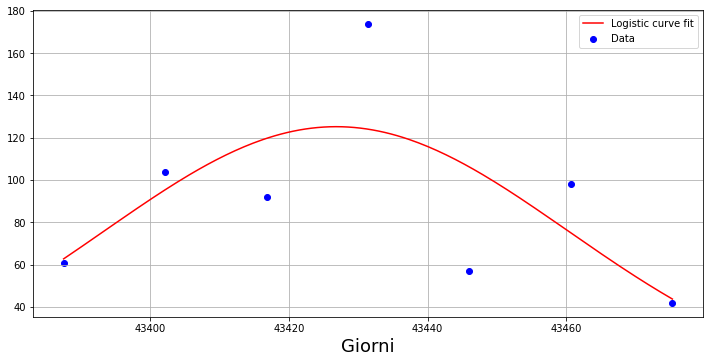

257.9229499551494 37.98035074766753 43373.770675176995
0.9191056648550819


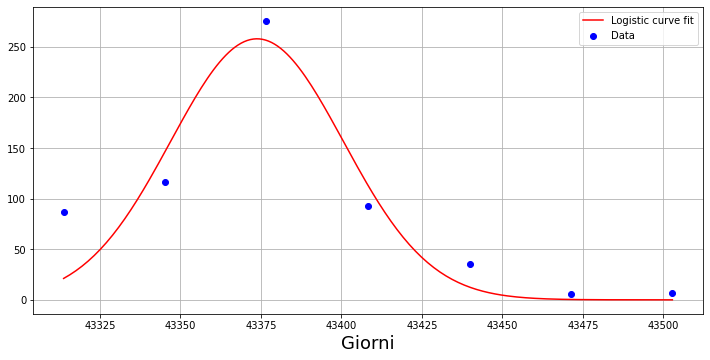

206.17315032558815 31.06425427687461 43386.49460899473
5.246800194026884


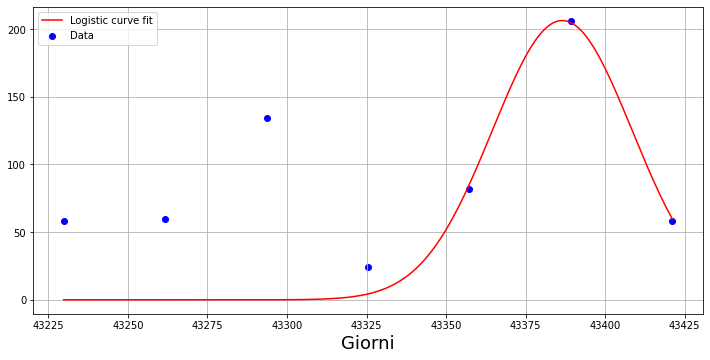

163.54624642625075 71.07764933208806 43488.88596273351
0.07676129208575845


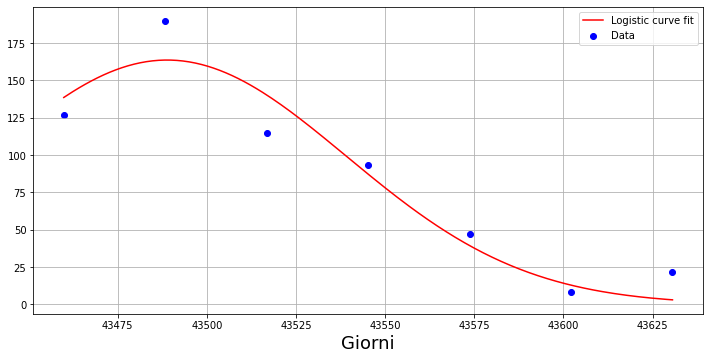

125.7485890633109 125.96451119743192 43359.86603980484
0.1062994686102183


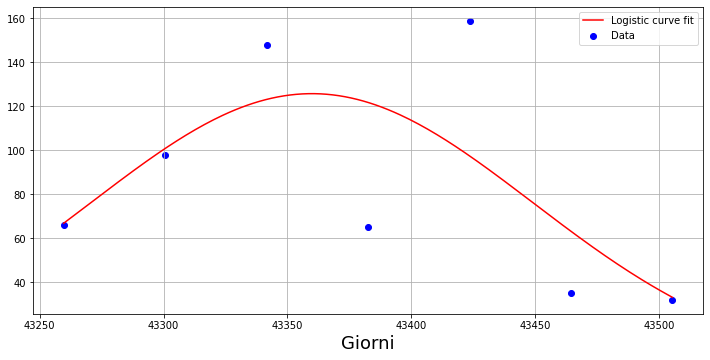

151.04406770776995 34.614508217430135 43349.68124679963
0.7783088214277321


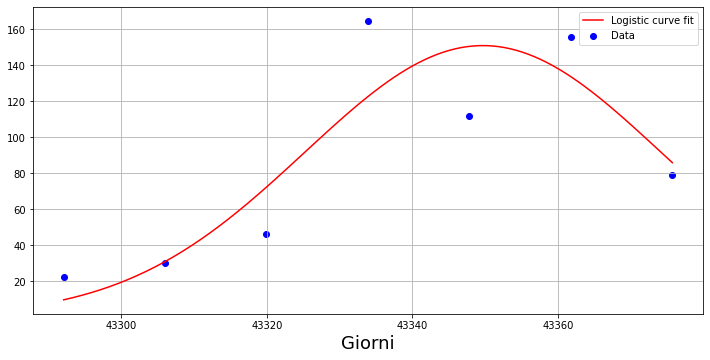

92.59732566672672 89.71764947222542 43306.67774144242
0.18850893583883904


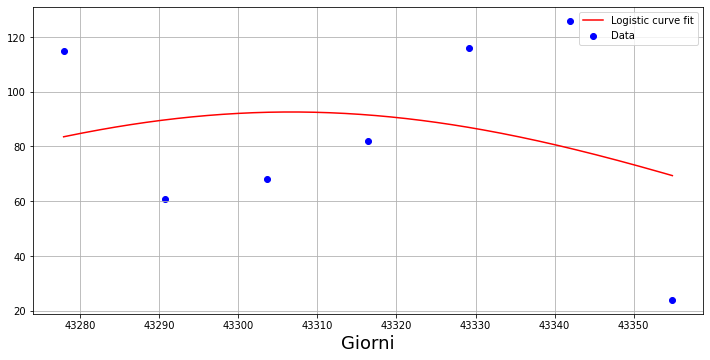

240.01057350758992 30.00005574757077 43257.70489355798
2.5638146017586907


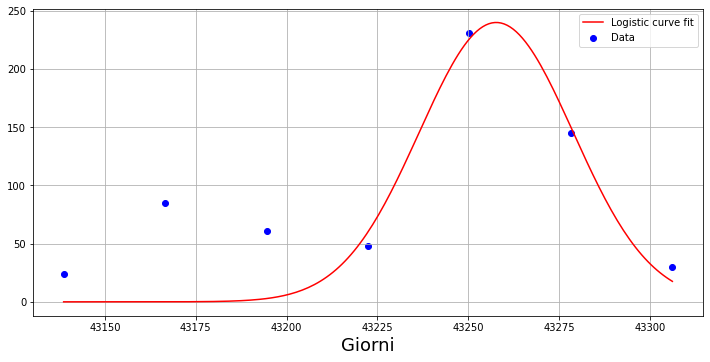

411.04002116867196 186.6266763021729 42931.156503851875
0.0008220353530747345


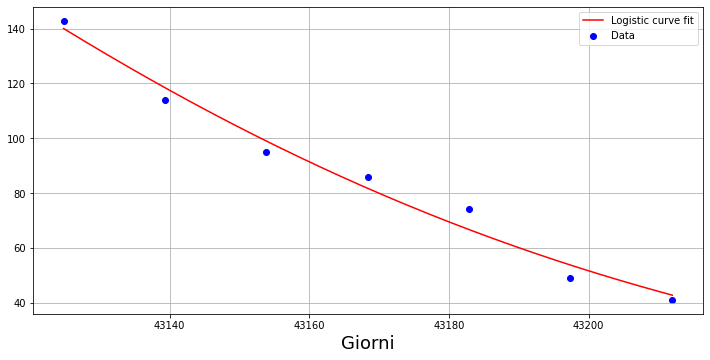

223.68937412657147 34.28023025177943 43254.308479961015
3.905215545881911


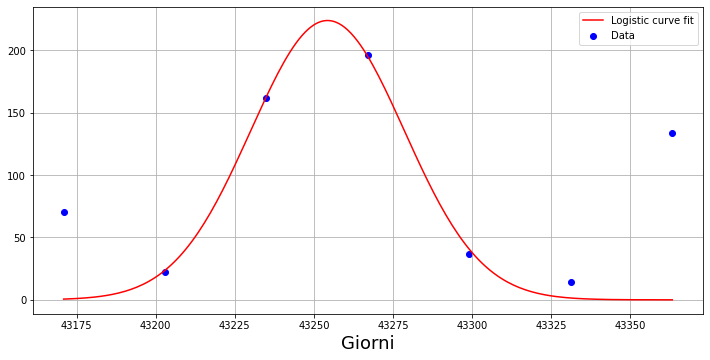

281.9105078788586 28.374882548985624 43377.779052023914
4.657783947842922


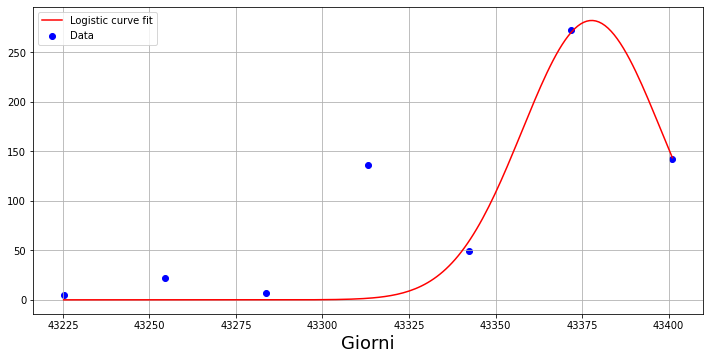

174.80107443625155 26.020046998843124 43239.808828300724
10.34723899783106


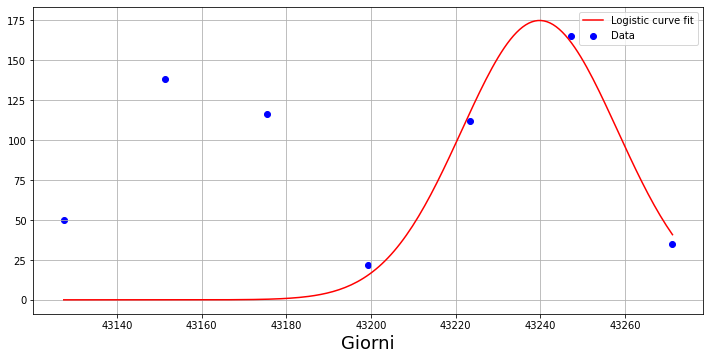

179.35543702748558 31.72444075652032 43146.95688601762
0.2590483942397891


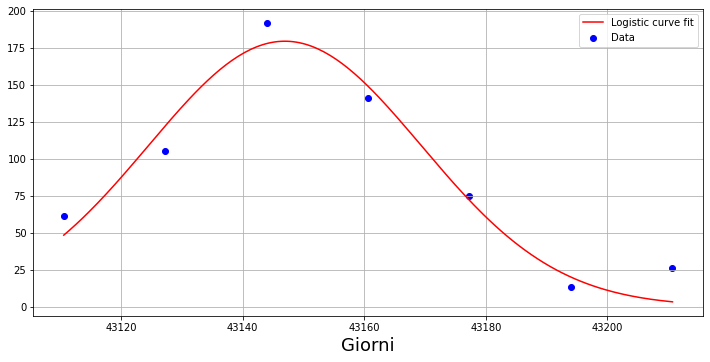

216.74922150915992 29.439650092434963 43022.69677209058
0.21306702593142704


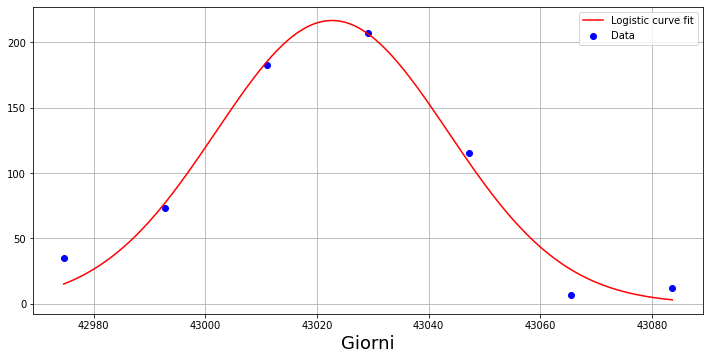

154.76382178146042 24.184613521711853 43029.99788276905
0.22669215471601892


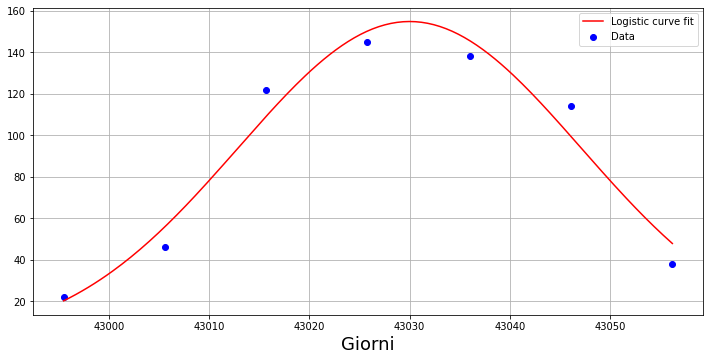

1737.6578116981448 15942.747180051474 15606.428426806593
1.2445339562666783e-05


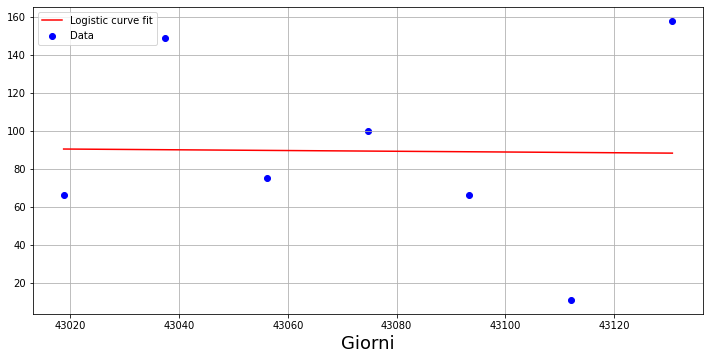

314.69137331279984 18.323885318741542 42949.15491439207
7.00712638671687


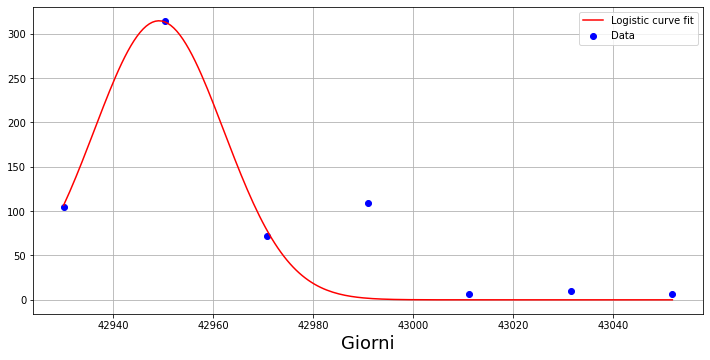

162.03210058627673 80.34131680057945 43067.49968131959
0.0778555411317729


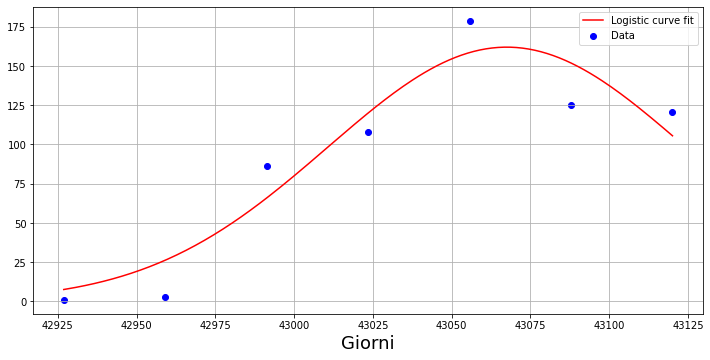

108.28588484606637 81.62686499736819 43100.245613779145
0.0827341325390413


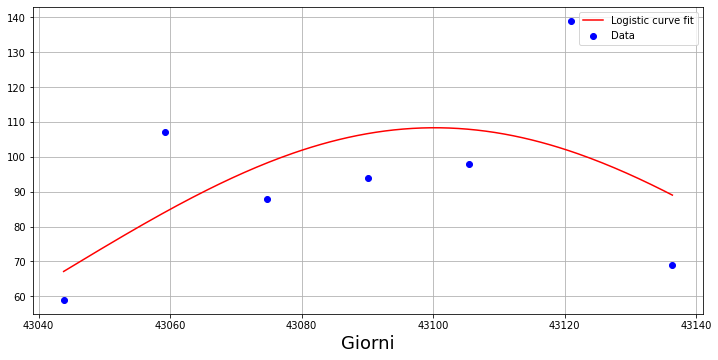

152.82017220824352 21.43305758428759 43082.975900493744
3.24135582986194


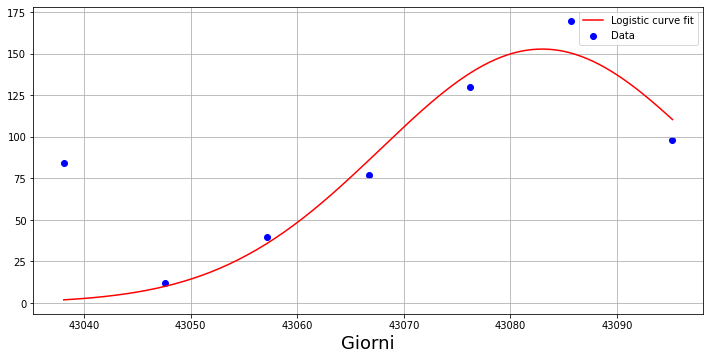

209.8144771421665 25.628118112158106 42995.05109373355
2.8214429078971235


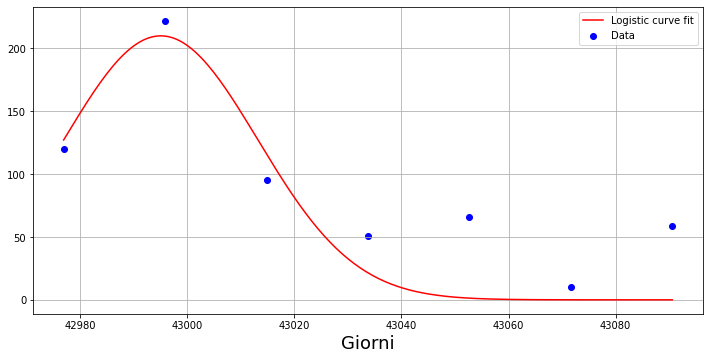

157.7244527610424 96.10598088545986 42957.8256379087
0.27601754468069506


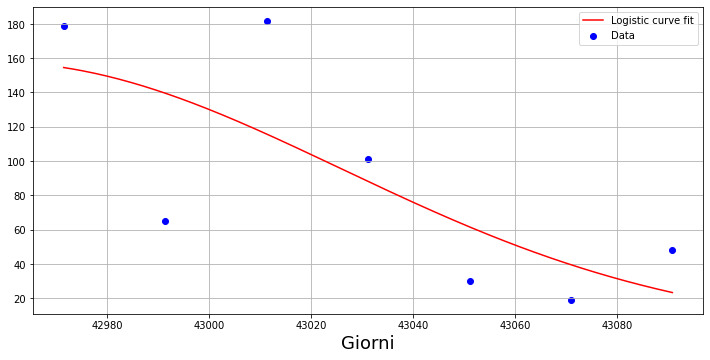

317.2080316179537 9.145429759941809 43067.27638525637
16.359825201693116


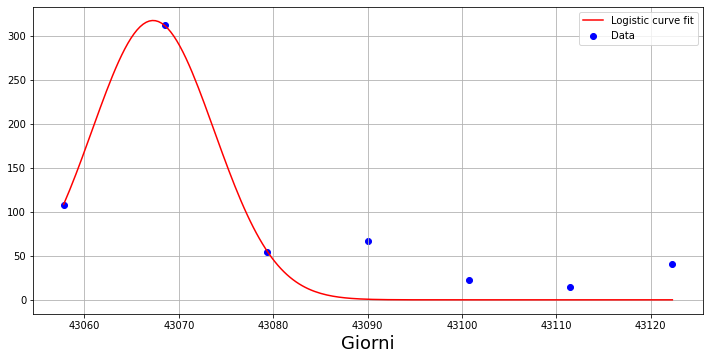

245.7170352184696 15.648714371291959 43118.37509431458
4.288910388818823


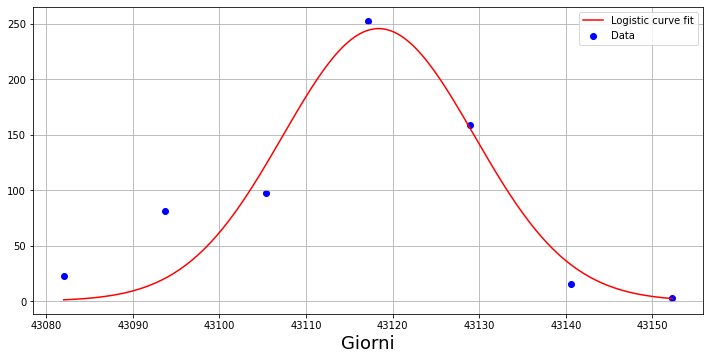

139.65117317348933 47.200805378065226 43082.194588656115
0.8155144029954948


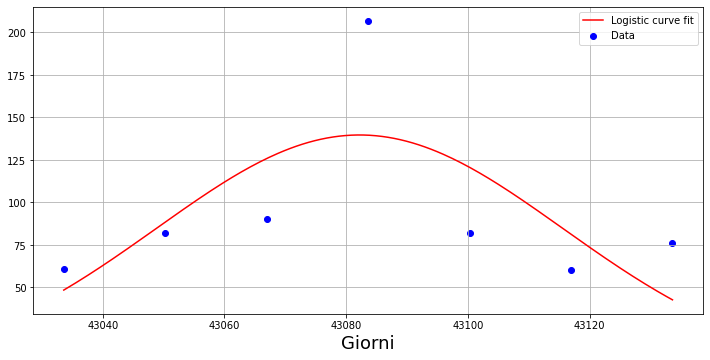

245.575427030546 21.36646464250009 43209.4214901004
4.287341464441341


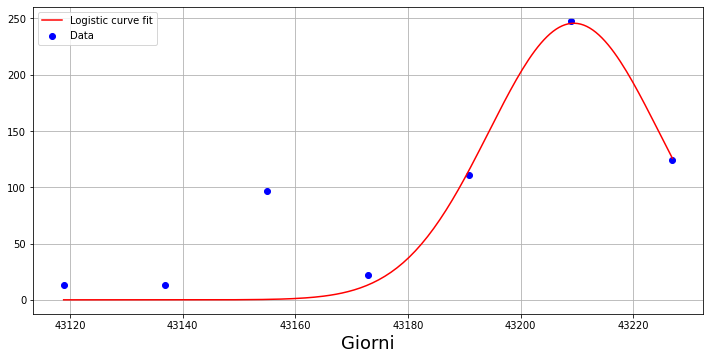

135.34875430218892 37.94538232636069 43240.89656058678
0.870359782344899


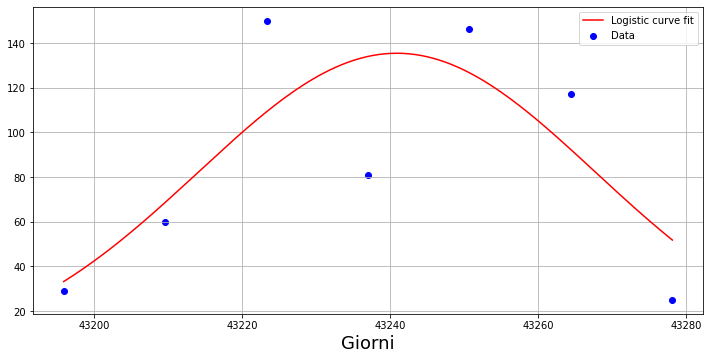

301.20507597328697 9.287060463590196 43319.39639180601
23.84055292564503


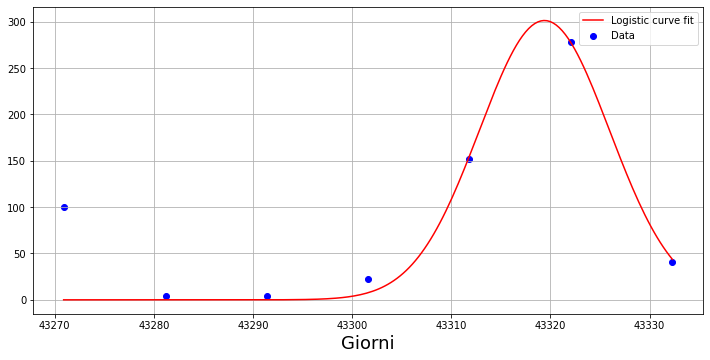

245.94079893540155 20.99415790703445 43297.94074230797
13.696794111447133


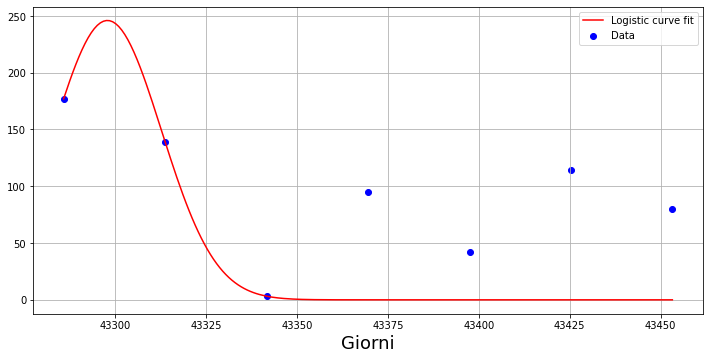

264.2882244155971 15.01133140886374 43419.97105368616
22.343386631476683


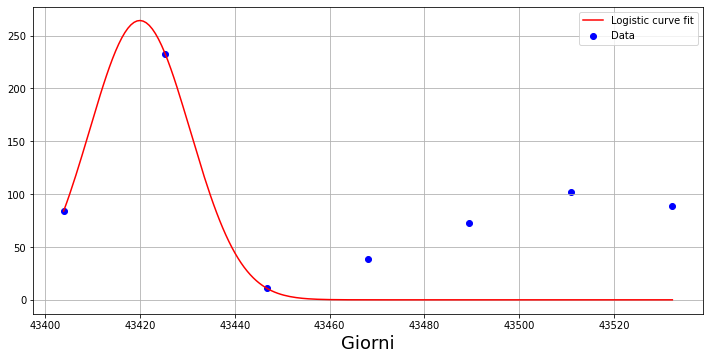

108.83917031849934 47.10272682022302 43508.98432285655
0.8620227125862698


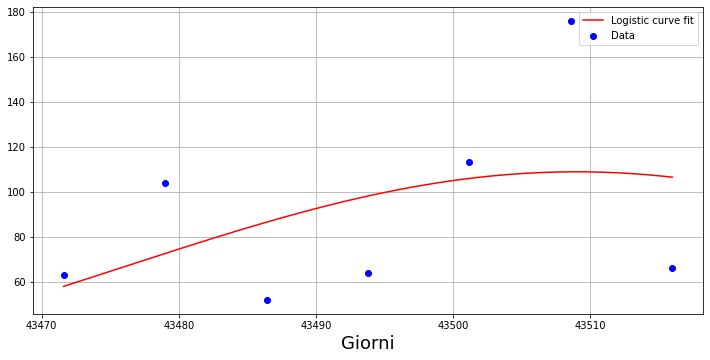

274.40676285985535 12.27425943840178 43502.17311492821
19.39373129381544


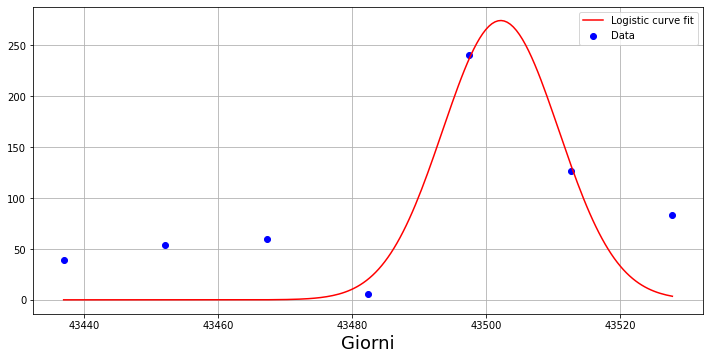

256.28019183631824 15.611866120298577 43387.04108220758
8.444061042497266


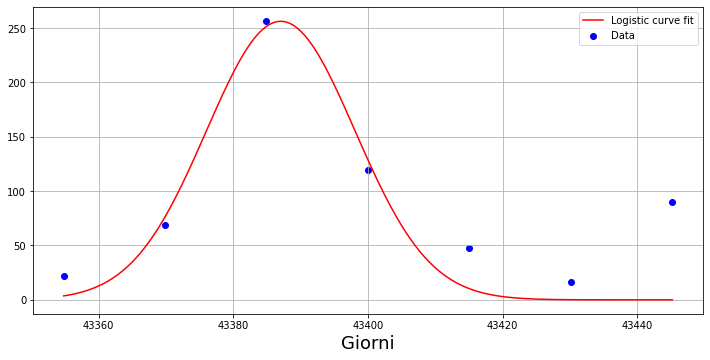

117.38140591996323 31.797725254891112 43427.50836765738
4.738321421962009


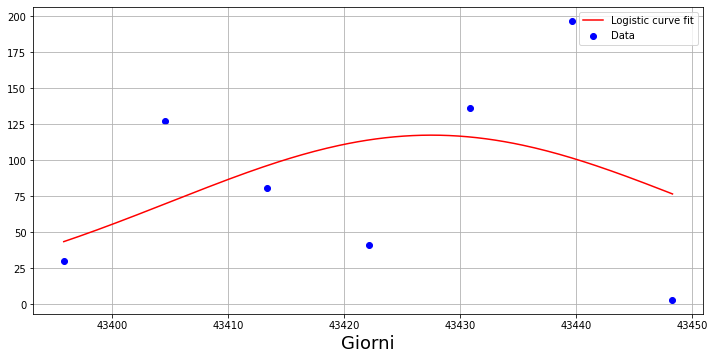

334.9903547162842 5.378699872652826 43397.330810779706
50.26678419990908


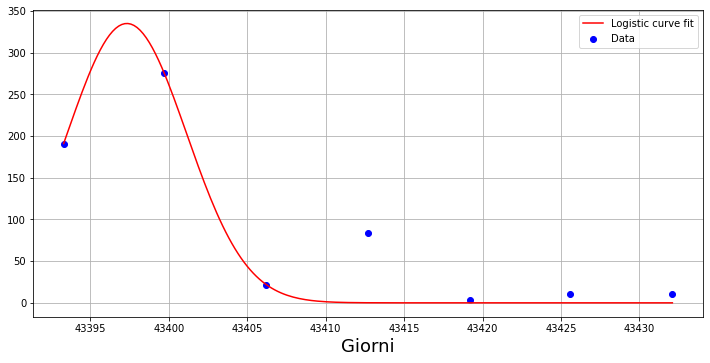

331.40602318949016 8.537674552338132 43354.847433777744
40.43793658469288


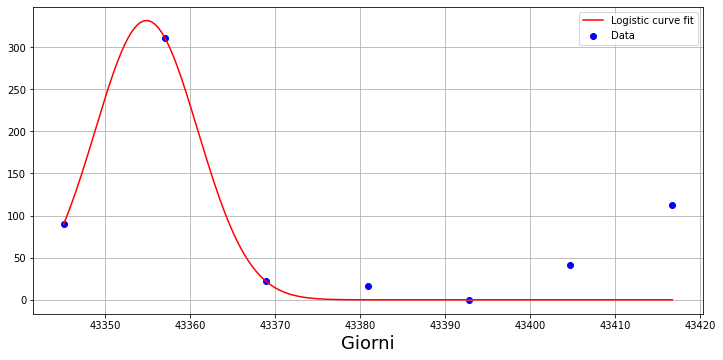

197.44617471611596 14.198210682869128 43432.59185853861
27.50725892874624


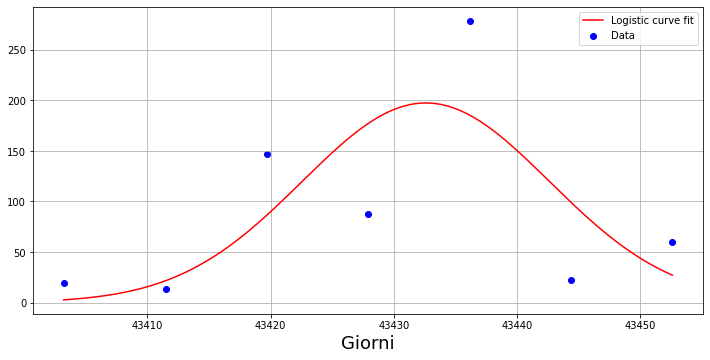

202.49725579175532 14.393080198142208 43459.59584318646
26.78979884686591


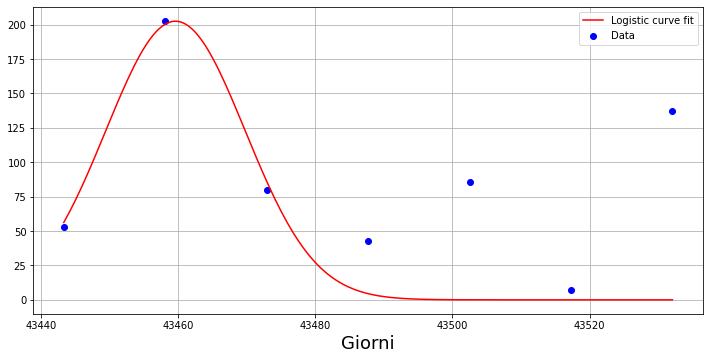

238.66977082365702 21.404388015493264 43527.27201688775
6.4951066727677


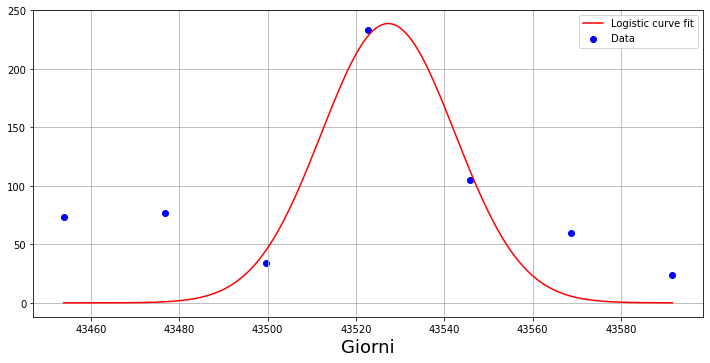

205.63187515750963 18.72240152093438 43481.566644846724
17.643205854269763


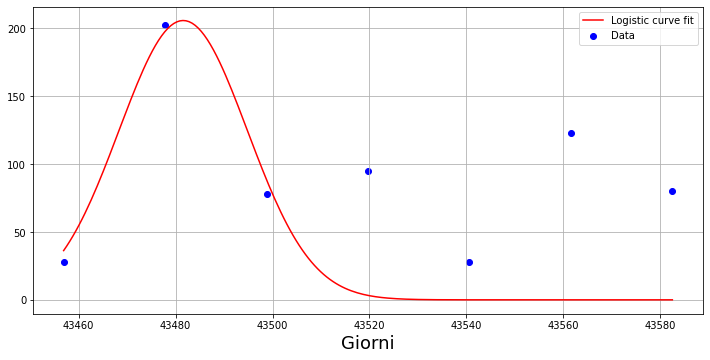

205.30472813664616 22.252168400355796 43541.611705848045
5.291632810896889


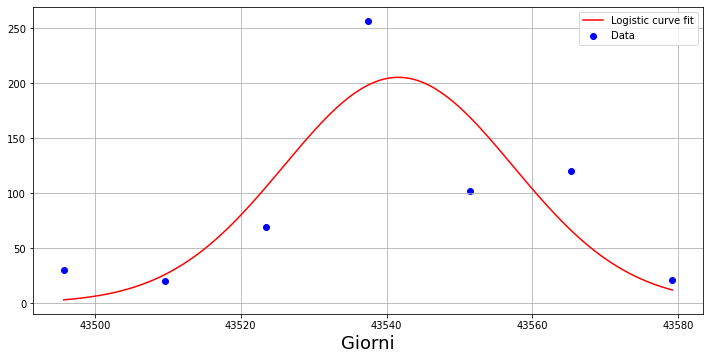

186.36454100979122 21.474934866486166 43557.12368211573
3.759985556351922


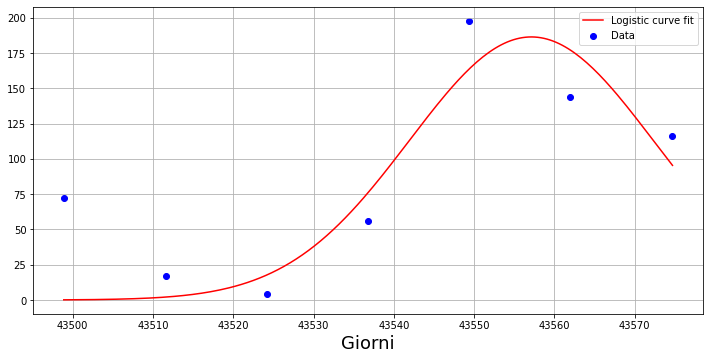

299.09299720565497 14.727418203683758 43580.21936417934
8.59980510478281


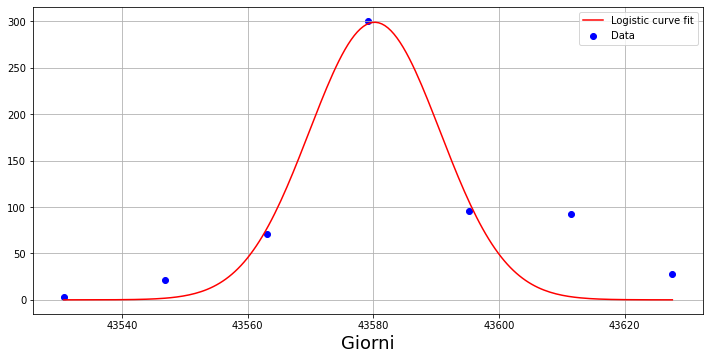

348.71284072415705 9.88939527319005 43527.52271205264
19.90033617708101


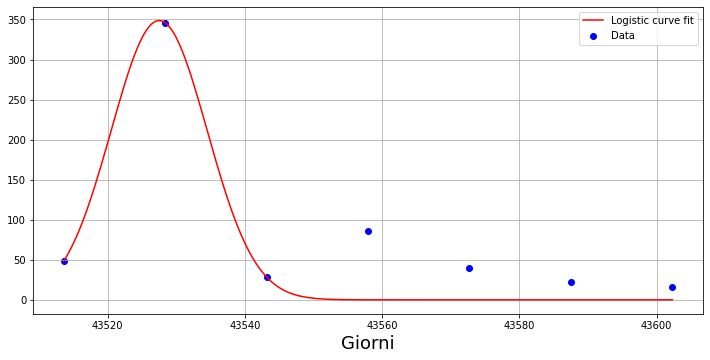

110.5356779953255 149.72995157680538 43485.291407610224
0.02285668225634844


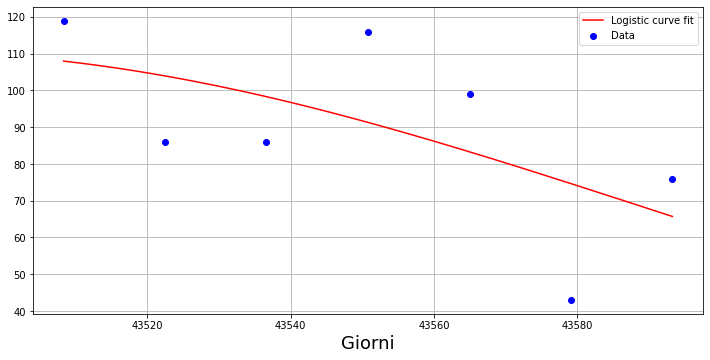

145.48653985290994 29.917612349100114 43555.542565111944
3.075204479513432


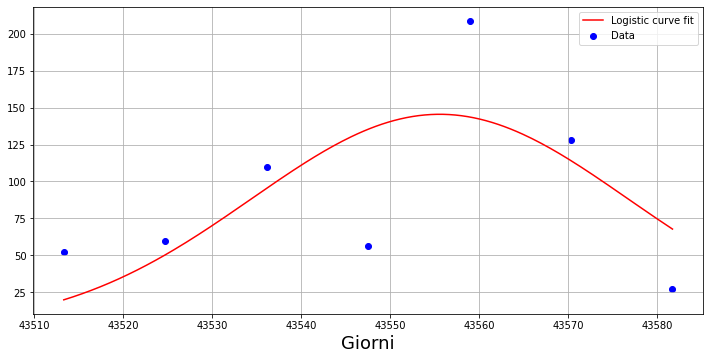

136.47601410191362 47.94845676374263 43564.45951015131
0.46252975194233736


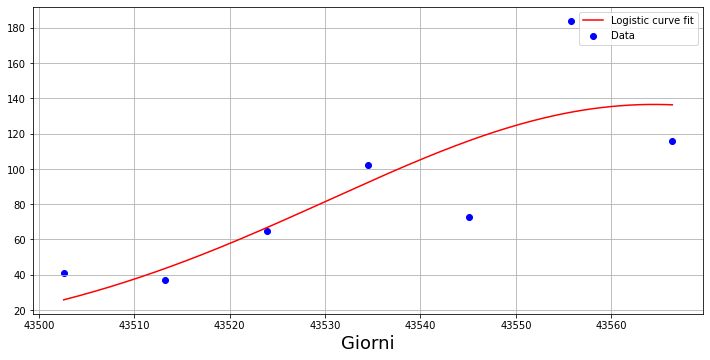

238.06873154649404 13.61745915917934 43510.4848609662
41.72770876218129


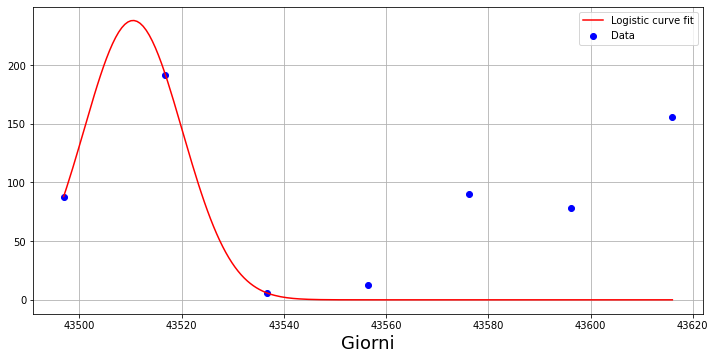

283.92279612073105 12.950540047148777 43589.60565531294
6.862239736028687


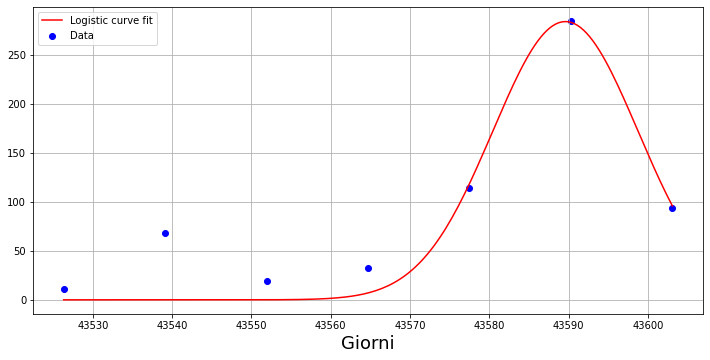

158.30509486247487 29.71521956323248 43522.48465980385
5.946073929426576


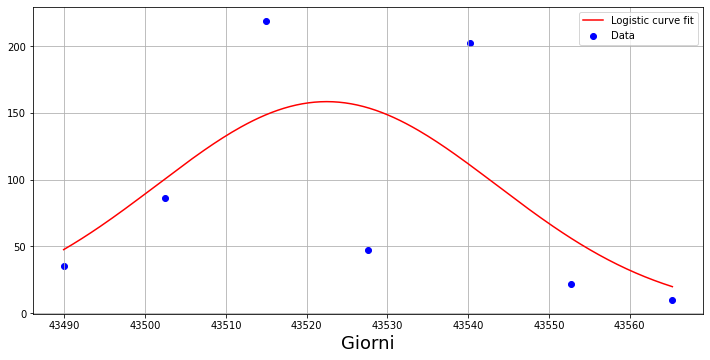

171.83086441969468 27.86532763628973 43499.47170526257
2.2664829643478743


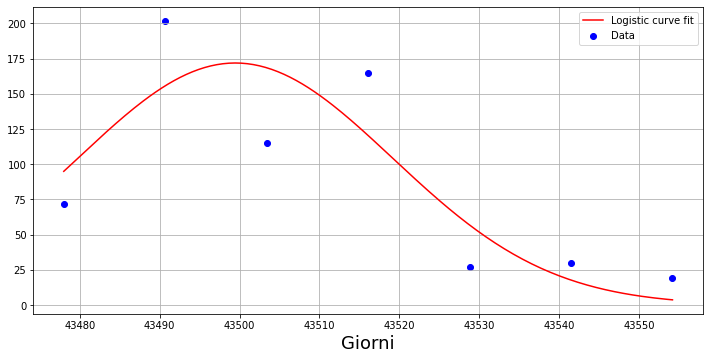

277.8501403988187 9.176812713562757 43547.88118105098
2.5526491569031267


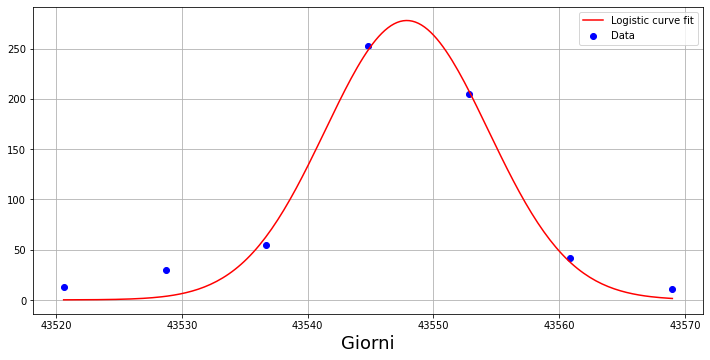

133.0021718356887 103.32481678391642 43682.34488063764
0.05955219366129723


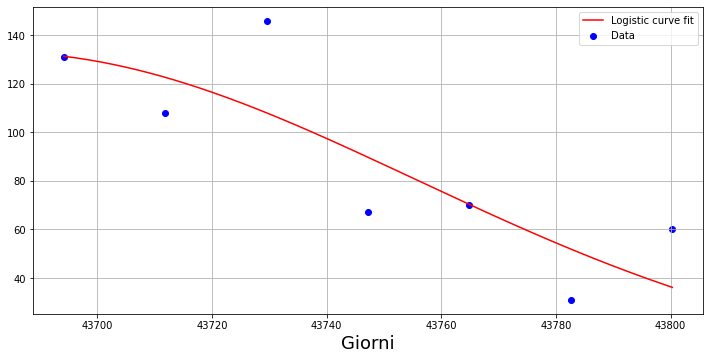

207.92417268637666 37.76997057597194 43793.374825751205
0.7880483001094877


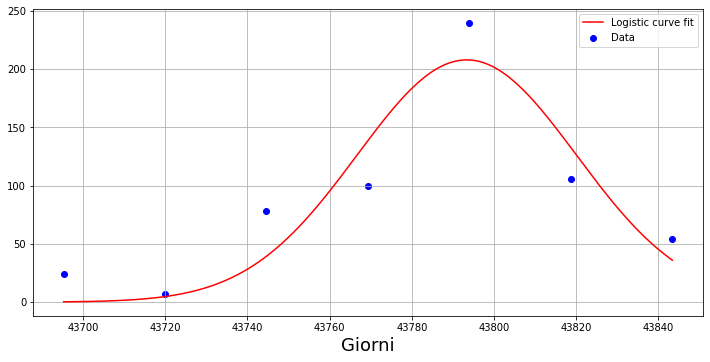

145.38741470923824 113.13588165087978 43923.969068392165
0.0644606732623689


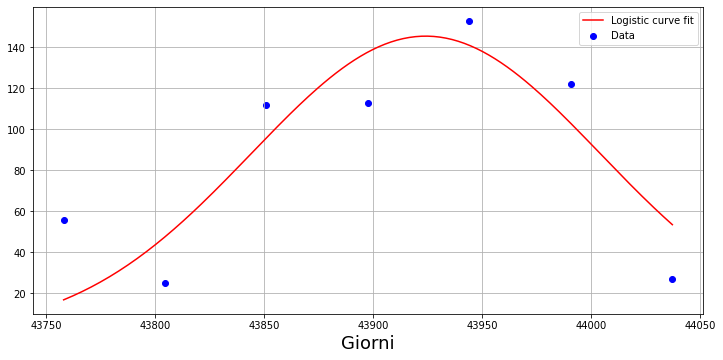

155.78424442854484 42.991279149100244 43977.06371509341
0.26126165036720106


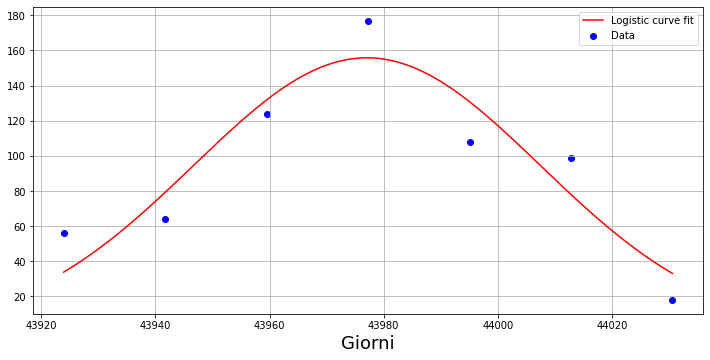

253.6687311969397 23.826794415378664 43958.79743184881
2.6762999176405797


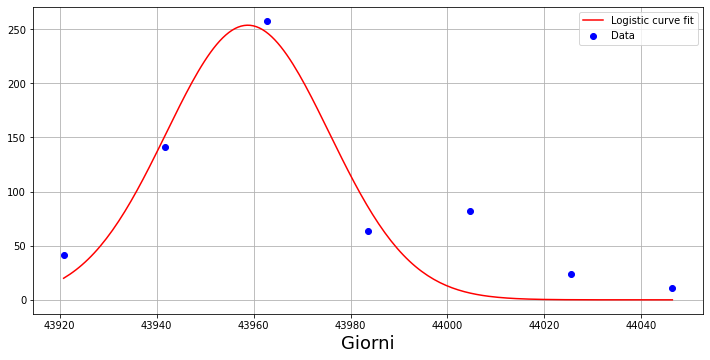

150.27059493635727 45.952163170924976 43916.33982988415
0.2604941493204883


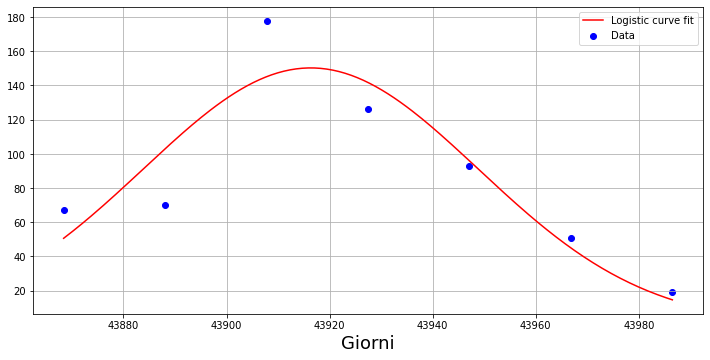

334.3777064161787 15.397133021666935 43917.91135363414
14.485997313267594


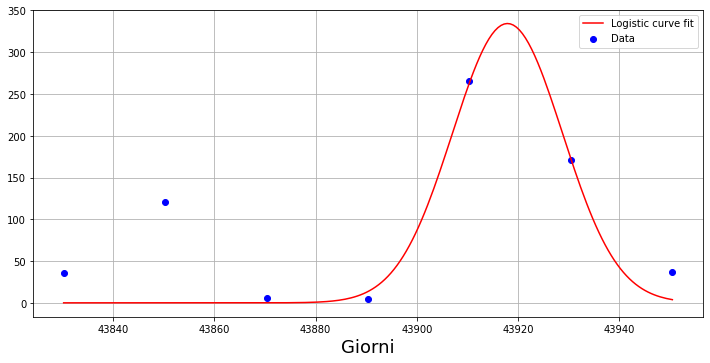

169.97044115401164 23.276242366842578 43837.698280191194
2.403319788706982


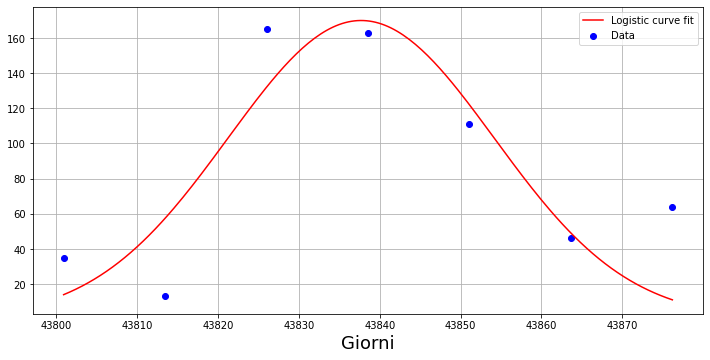

221.7240364122548 10.550418895563018 43869.02604026213
15.931461595623608


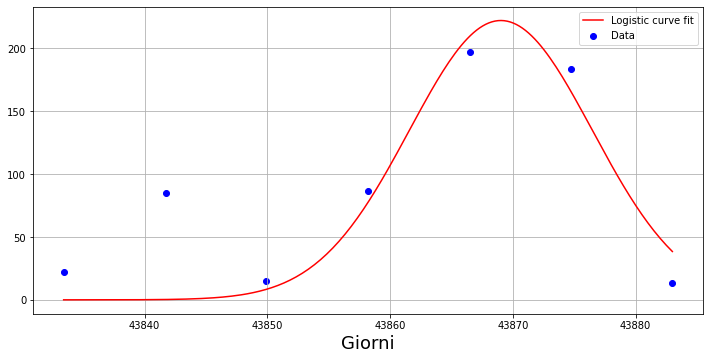

115.5606653640335 71.07326143778181 43866.3856732965
0.6900991389065869


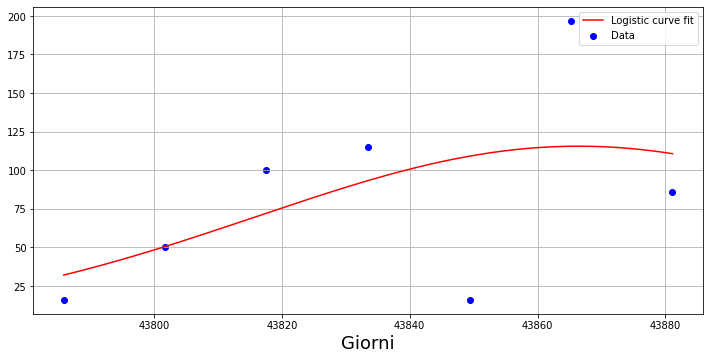

185.45381546466567 10.320806566806265 43874.37781267161
4.62487725844511


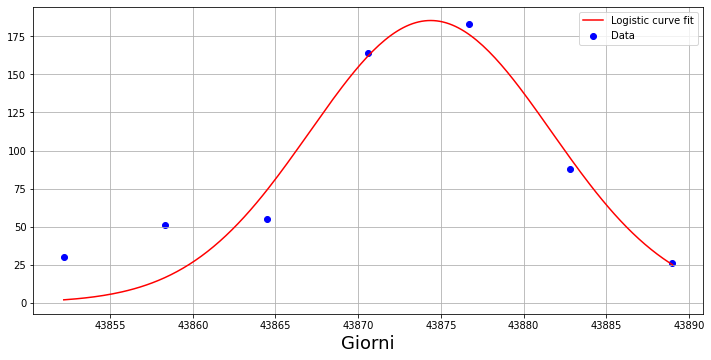

163.89972072757382 13.579193957323898 43922.21401146977
14.912594512026747


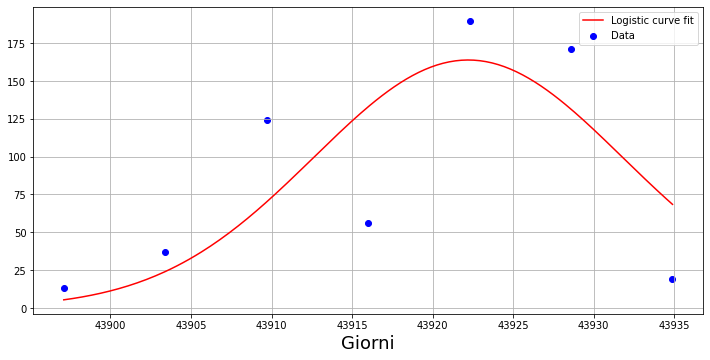

244.64848397140952 15.919275753334459 43904.09420382001
9.454064129607332


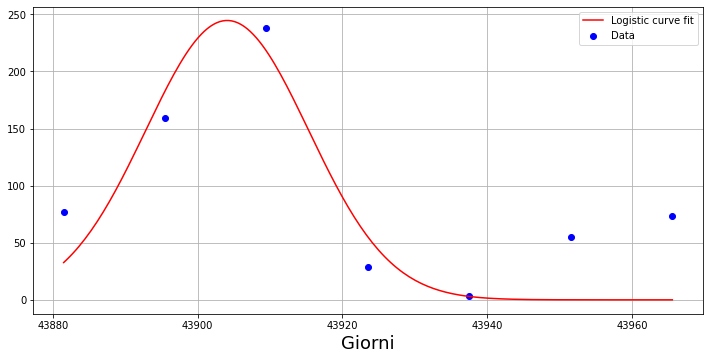

293.6355180841067 11.288682679567883 43971.4483923001
11.668261738343144


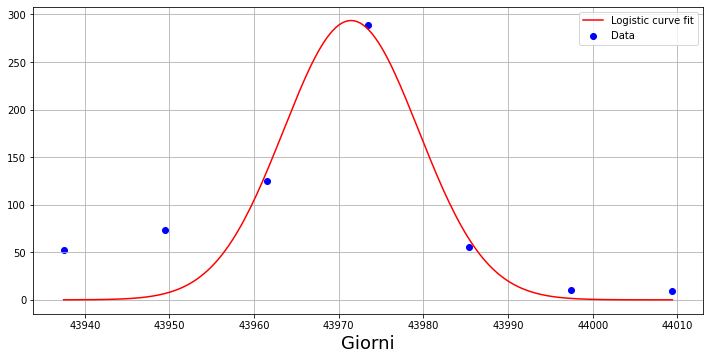

218.37852317330018 15.57108322342722 43971.572788899066
8.872316744917432


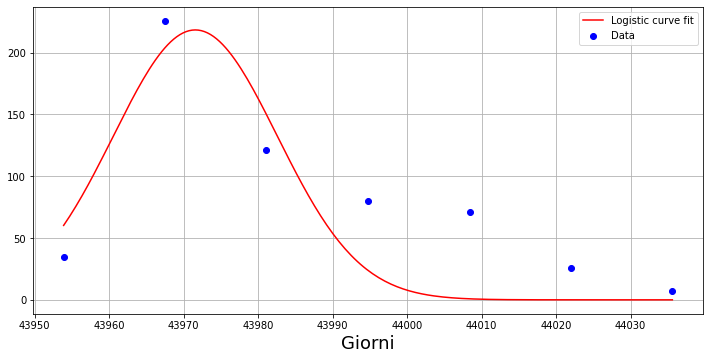

344.37085214618145 11.057455946851643 43999.412336218535
3.8839484545064105


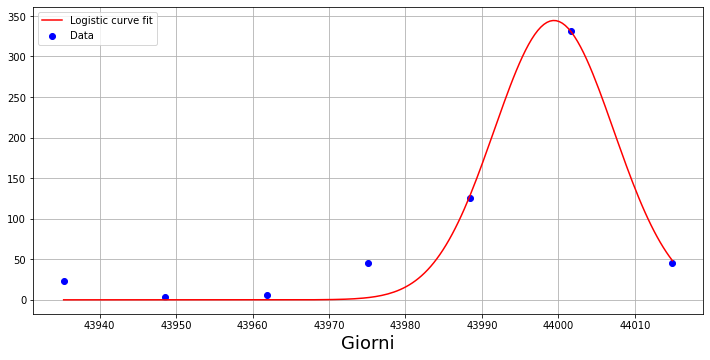

118.56374603067914 37.02214581806666 43914.767446519036
2.2837424938299056


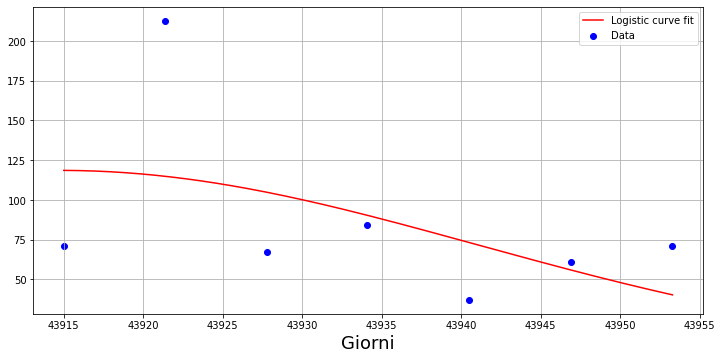

148.2200483718276 26.55802553187694 43946.835723453725
6.7463690184652


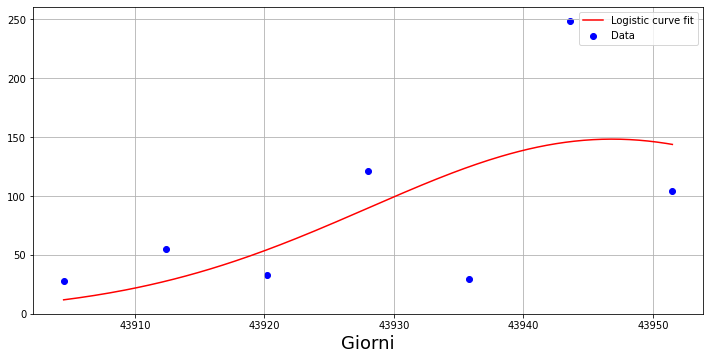

105.67303325053093 43.81579005357315 43971.85154741035
0.2470402430483653


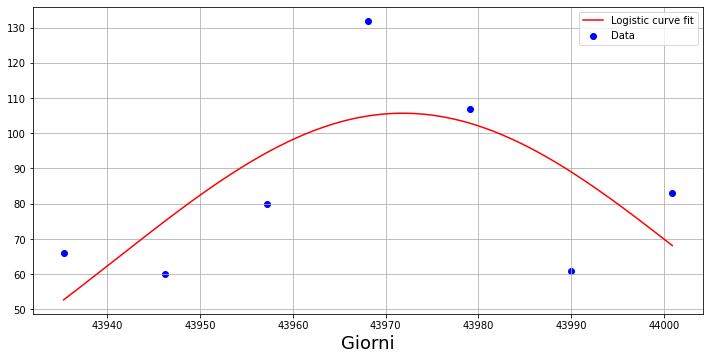

165.31015395849926 19.18905012666733 43993.43868687693
1.8561290699078428


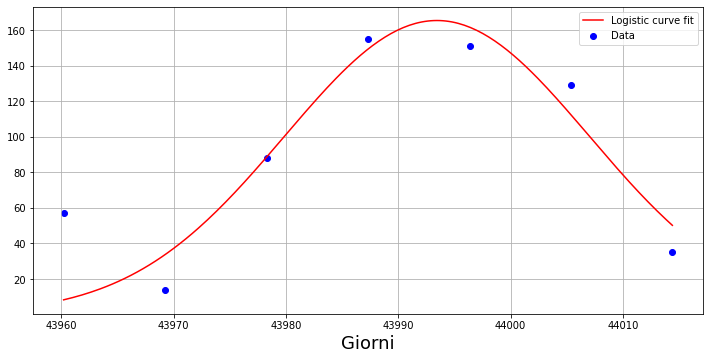

96.32030330609773 98.37680096472329 43972.63748989076
0.11553629820115925


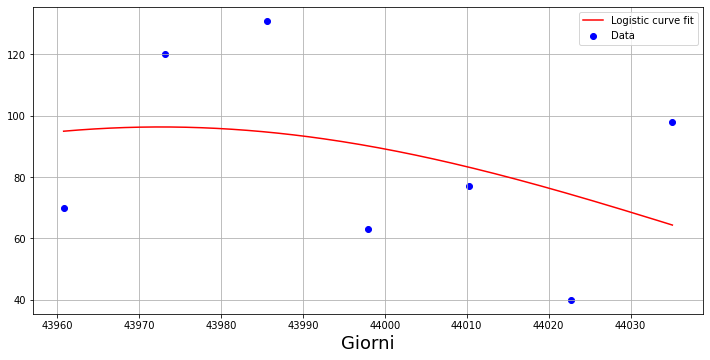

126.9951075524016 44.88132942780667 44000.27661343978
1.9998315911963727


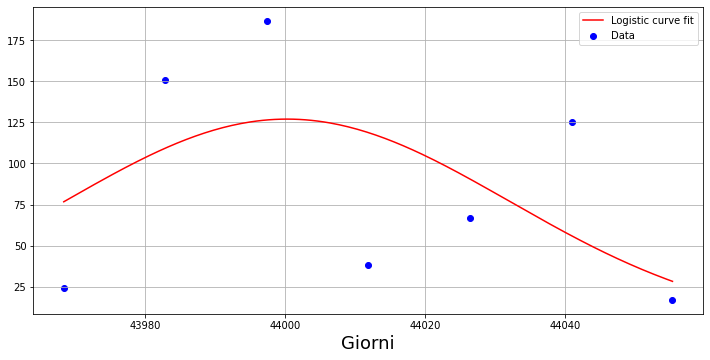

222.10421604606424 33.72254265566352 44034.69968201475
2.7179376385222804


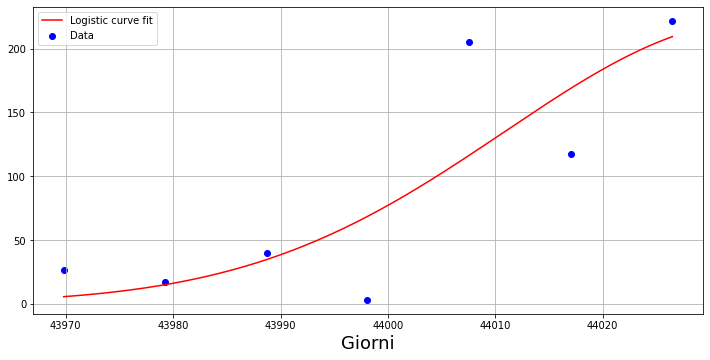

229.33374287762123 22.629028841853803 44114.250400014076
9.012448754448709


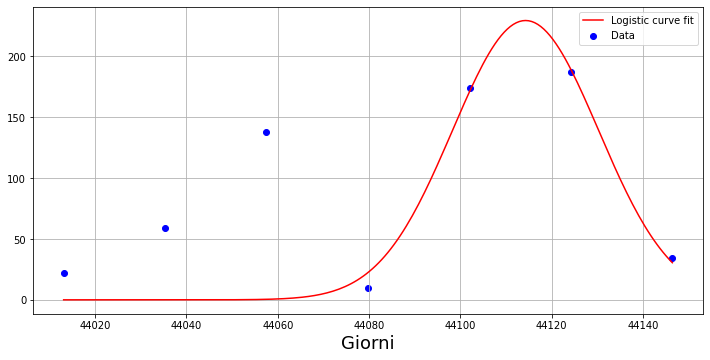

188.97393055792918 61.46846209737559 43982.356461247626
0.07919372689810283


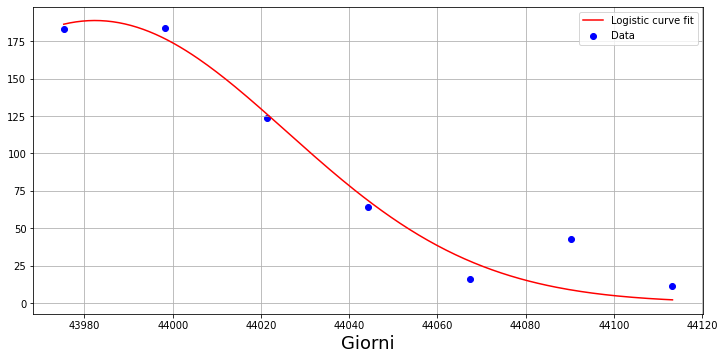

117.04953004488345 41.230349936624165 43894.78322288293
1.101142951476286


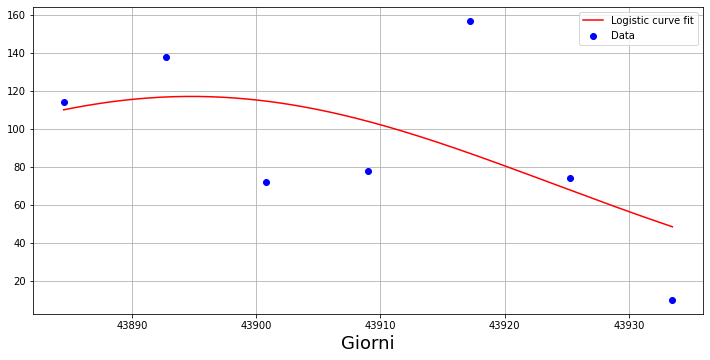

220.44308546512633 22.503310015655973 43900.1264500159
0.8182725841765727


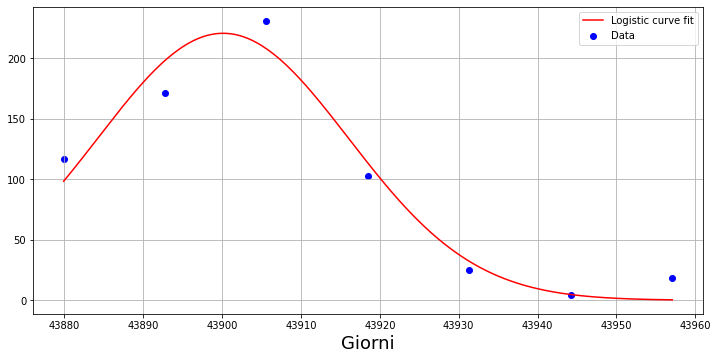

231.08679500597626 10.1371694523084 43885.041821010636
6.478008556006809


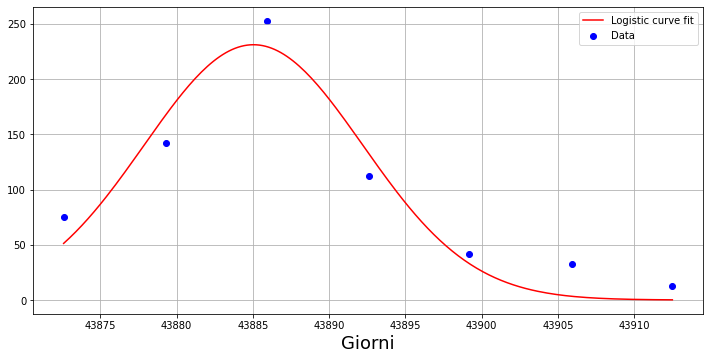

212.15857388963235 11.229224489808798 43890.245469436995
13.367642510193525


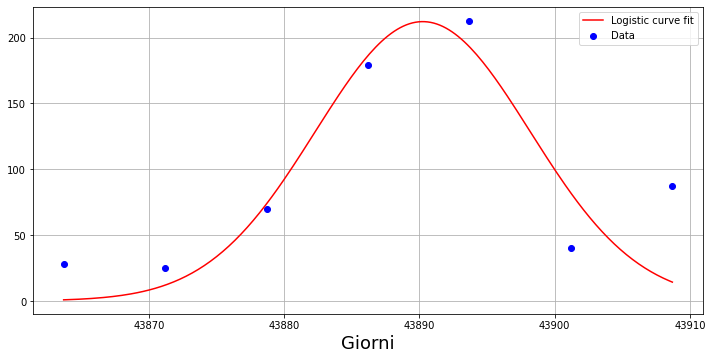

313.7506247046749 5.648413599377693 43896.47112118967
98.70481468857903


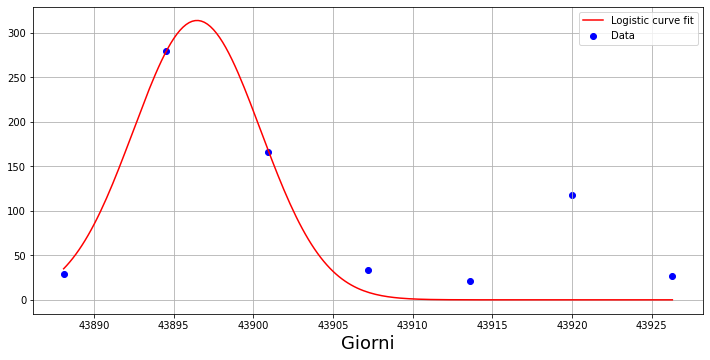

138.59622288747346 32.363998970156864 43950.16167442927
2.508648484591689


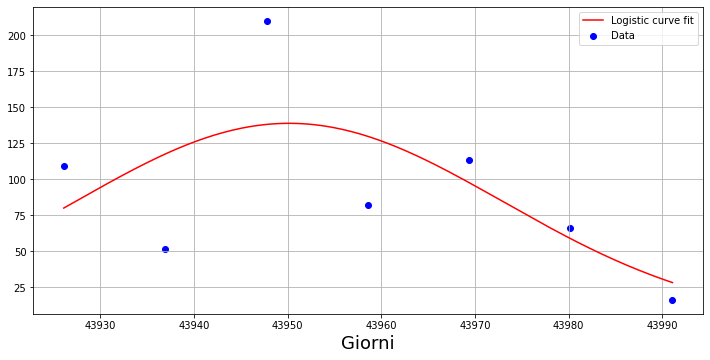

131.2358791424961 21540.022153015583 55994.14828704863
1.2007873779643995e-05


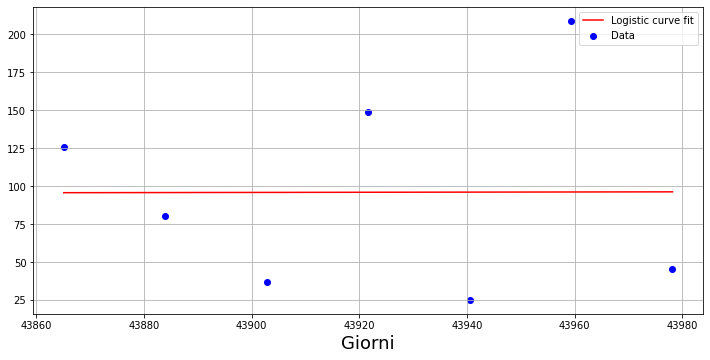

198.00684409279108 60.62557293834739 43806.660071052174
0.21107607732071582


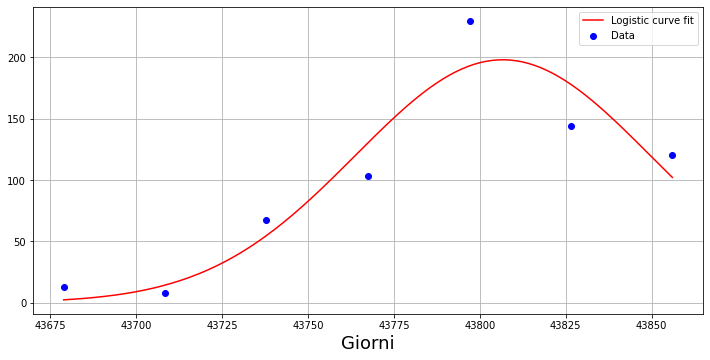

615.2407533500897 252.99627762634074 44069.538059185914
0.020547660054351387


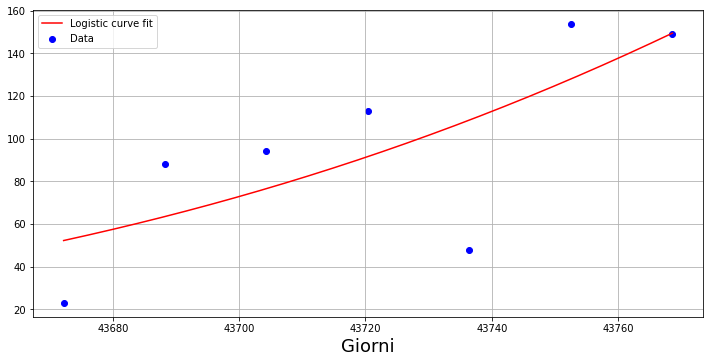

212.85624422630755 27.632229592633212 43680.199557447246
4.02755776674538


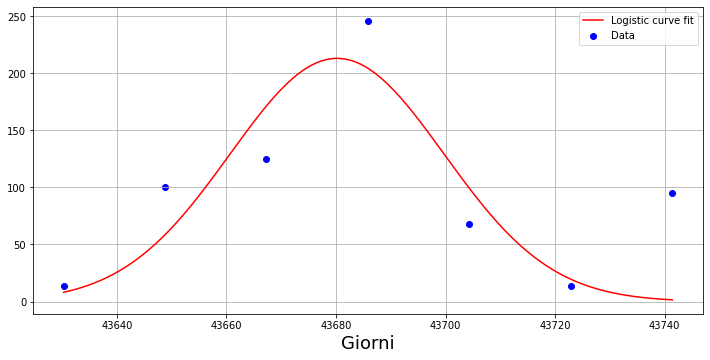

299.839931143192 16.10286525145682 43635.33243800803
8.44802893364538


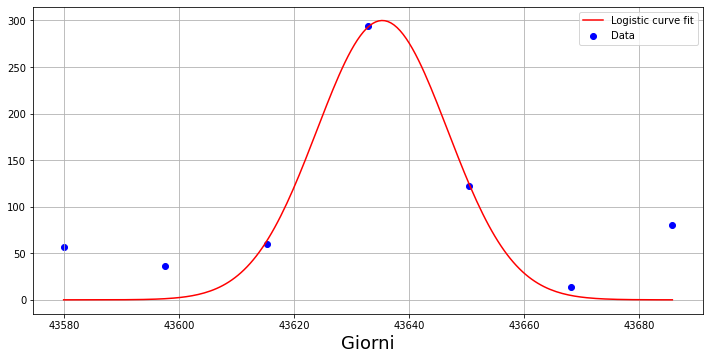

115.05221172766504 59.99785512190302 43614.736929988176
0.024314652719125324


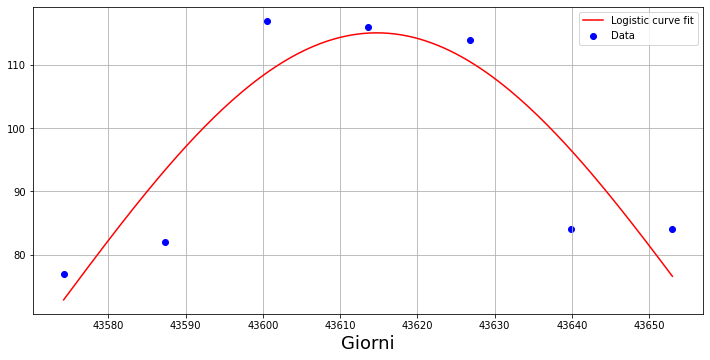

334.8006866428779 6.349653764137122 43698.18727736964
38.44031973162024


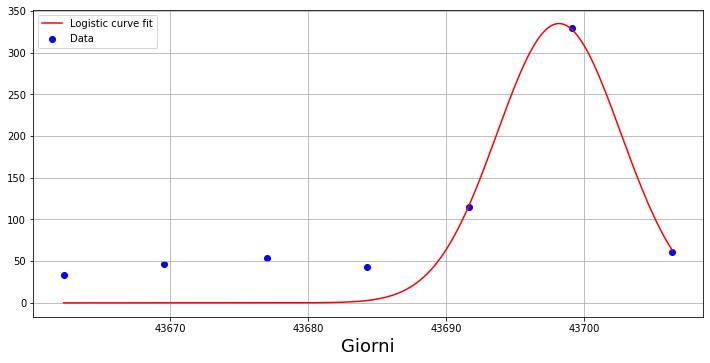

350.2917612974278 13.620917282175807 43728.94790998647
8.55879829136492


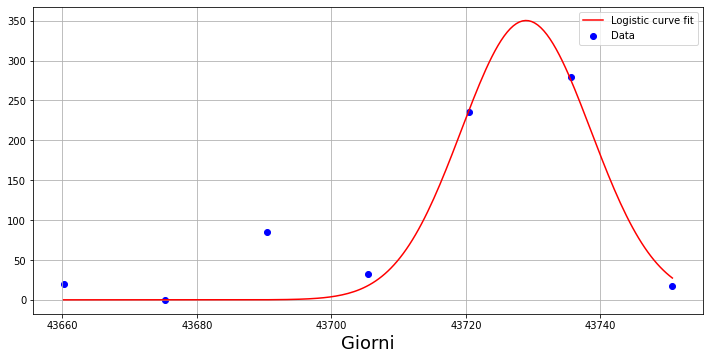

131.4172667701353 65.58700623836637 43743.78000422265
0.3097662857926462


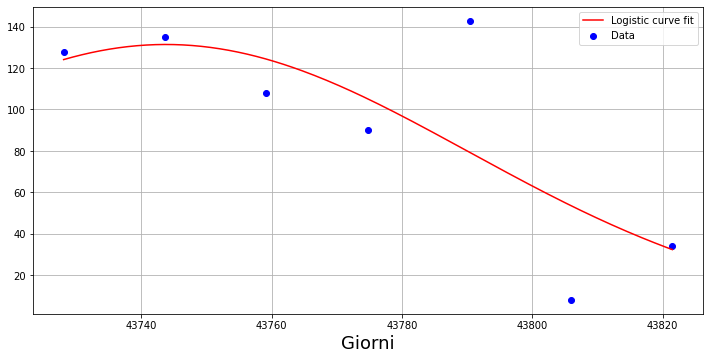

272.17605520932113 21.228066260866473 43741.45137091277
2.4360535866089914


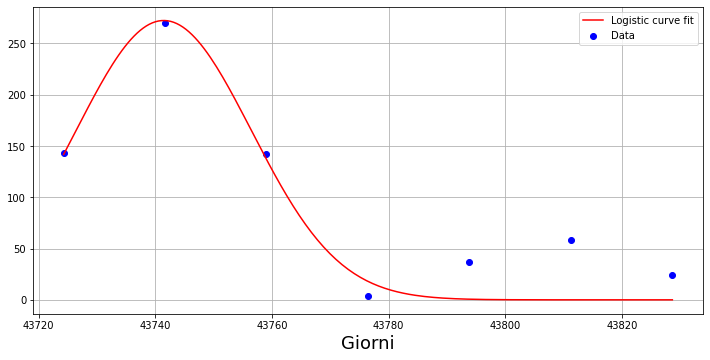

296.5574324992666 9.230620302218465 43742.63131140672
17.47538657125491


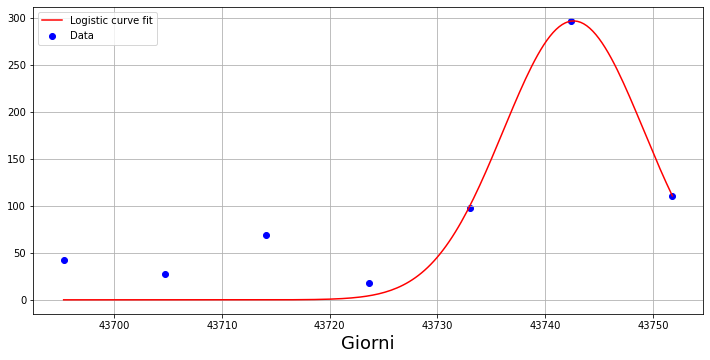

174.24562088364854 19.82079641780314 43774.97523841835
0.7756956386968696


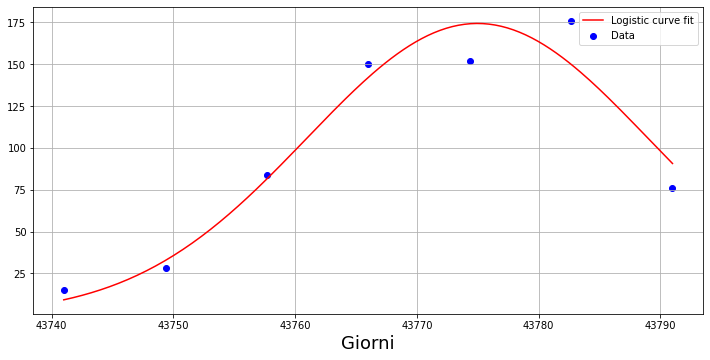

1852.5196411565394 5.713924126530195 43828.77033985385
201.7524099186363


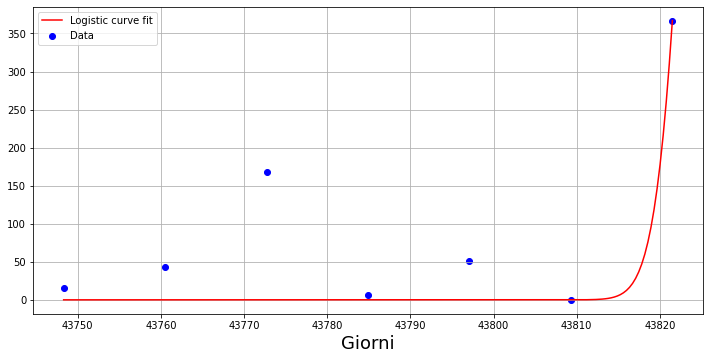

127.79985788102557 68.26260183066474 43705.40835057626
0.477370088443244


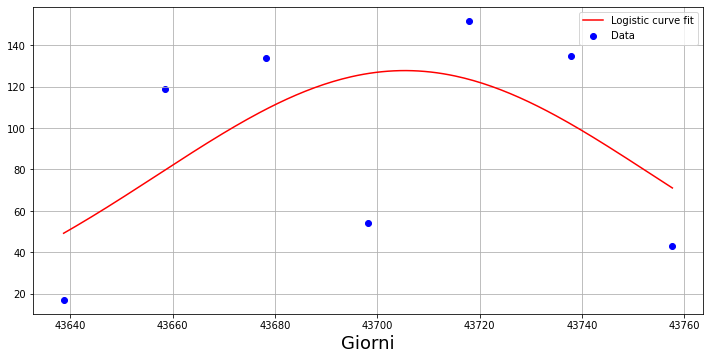

267.99081299403906 13.257652573862895 43704.51102836221
3.5022757890301697


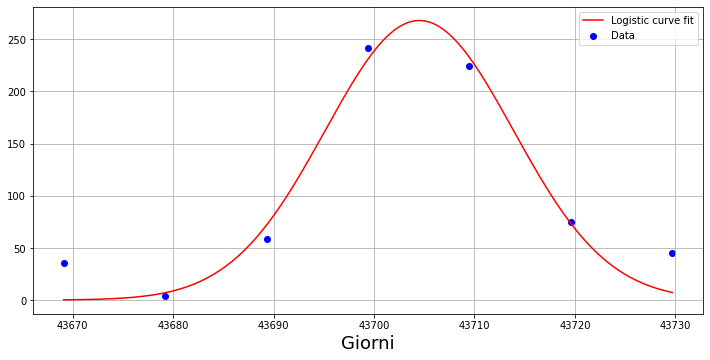

334.1609890697908 17.900166099351306 43588.12243898651
12.636953224269137


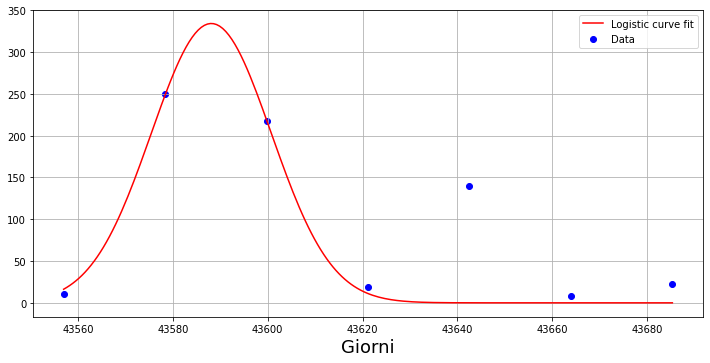

138.40471300010591 108.65824896789032 43673.18310520194
0.3062638962053066


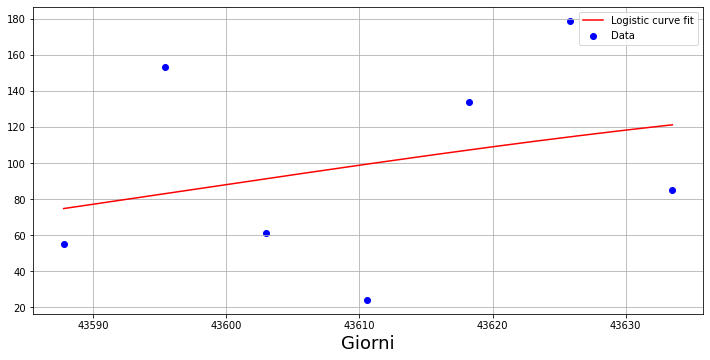

119.36110613418217 30.71885168757514 43670.67245418646
3.9141456646604857


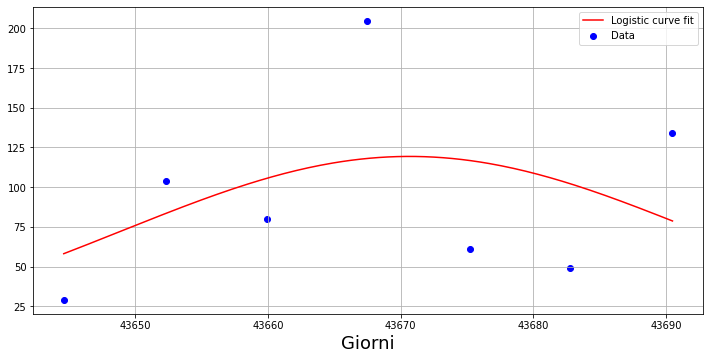

132.0456707226653 19.318008690951306 43698.43159712228
25.78471579692569


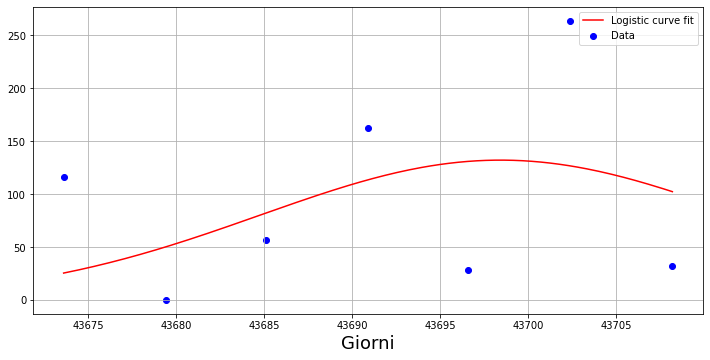

185.82716154375925 18.17167756319208 43681.33161608459
10.33791512388622


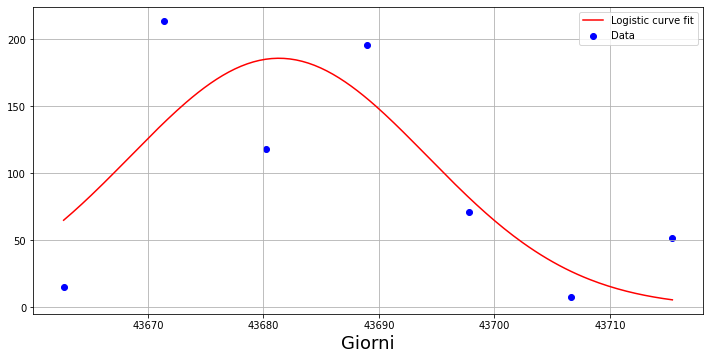

129.12127370118057 52.12976663700221 43705.50968476809
0.7511863221832911


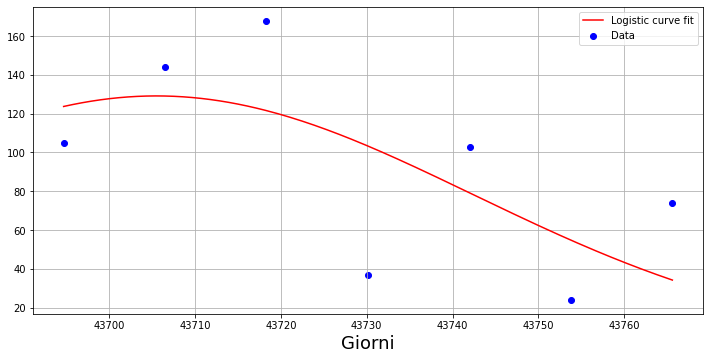

316.3823870796811 55.10705173865774 43753.156590868486
0.257593139551697


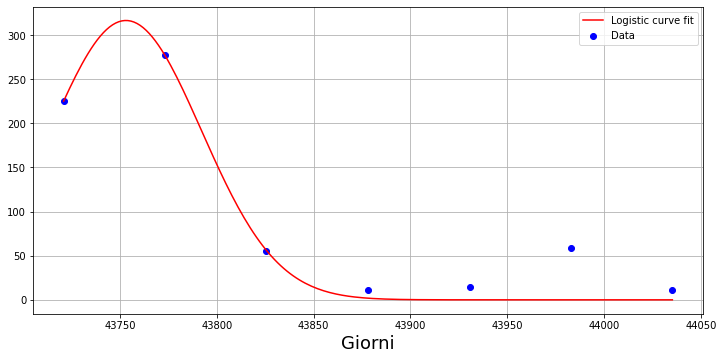

169.05839923688092 58.02408857098513 43968.690621757305
0.2756790558223642


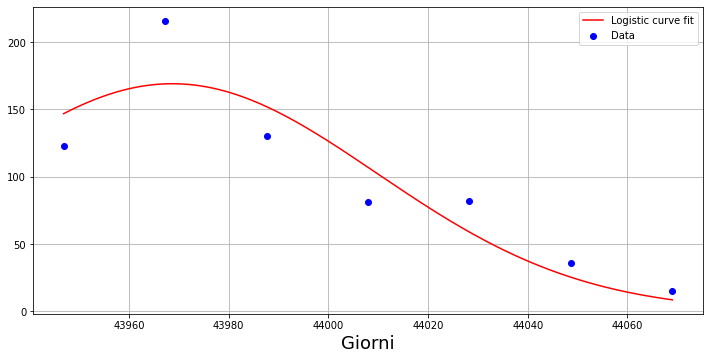

270.97325572045696 33.768712112233004 43970.79048409773
0.9238202395972076


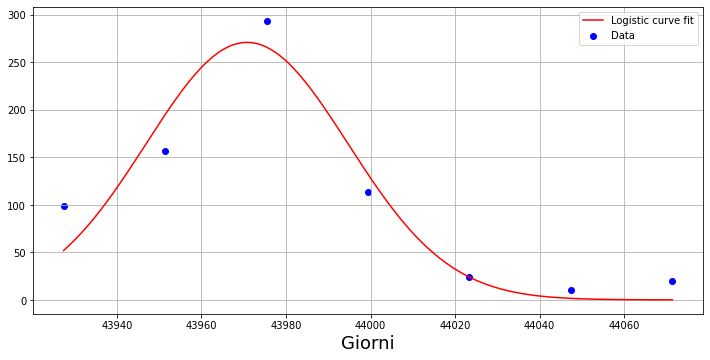

129.89271246496358 -172.97568534607444 44054.10237227194
0.01982369642963725


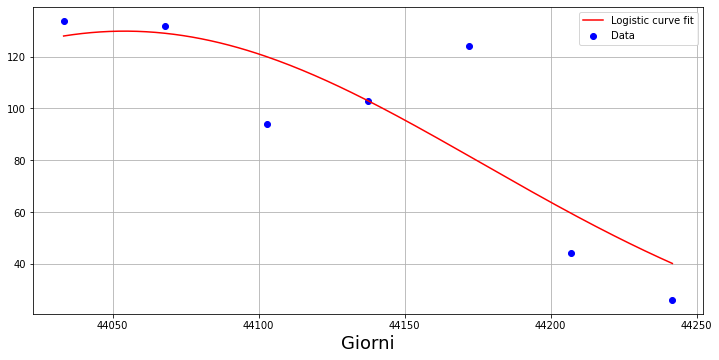

143.7484500312548 163.88858082443974 44000.341142485704
0.1620874272697337


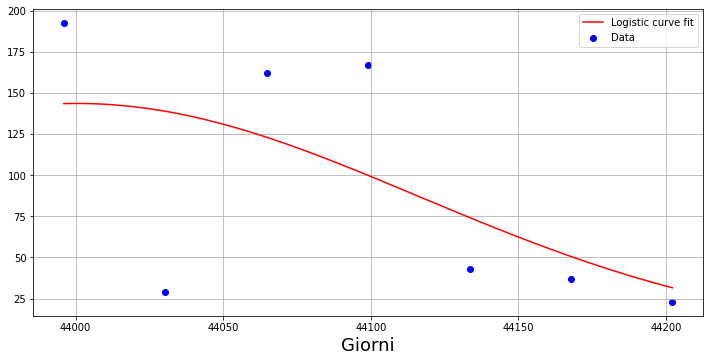

178.32605095467022 51.0206305925763 43997.49904366823
0.9263478357942253


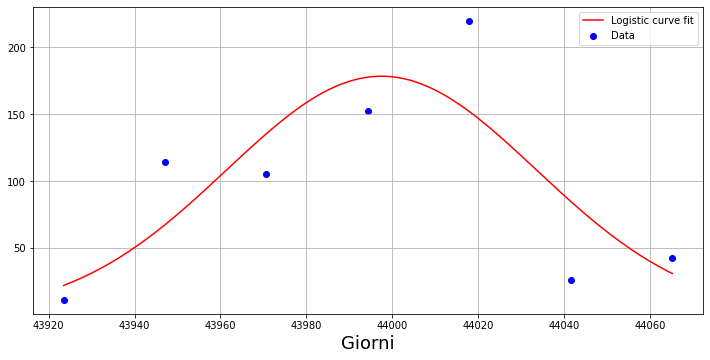

358.36078677944755 142.14321330826274 43795.59339162811
0.21177321361050083


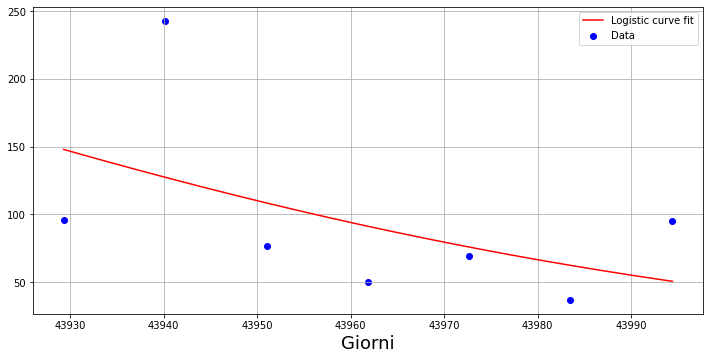

219.9230960212578 27.959841015269777 44009.33079844326
2.660805443602485


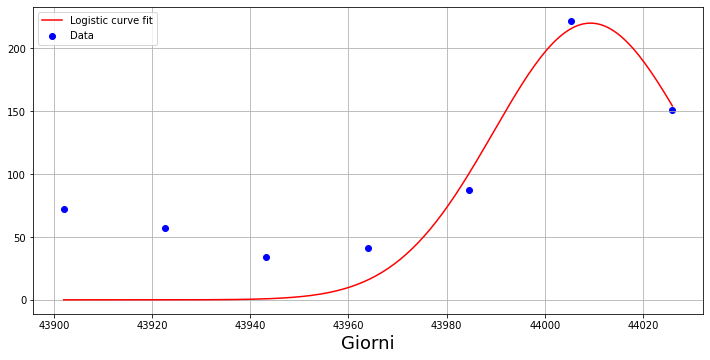

138.0745306297153 65.69025235247813 43830.502190408464
0.5514957564417162


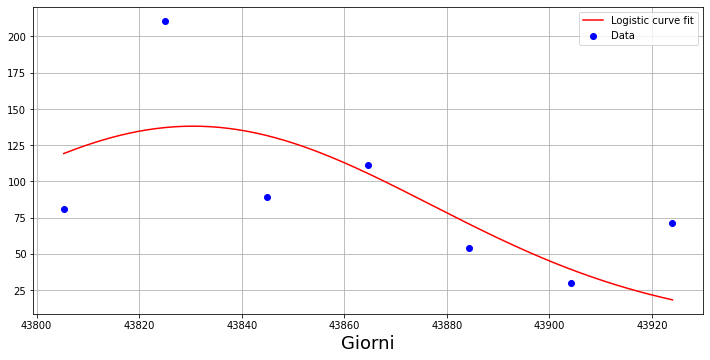

329.0852976328714 9.820489911266822 43864.00188998565
38.50223420213213


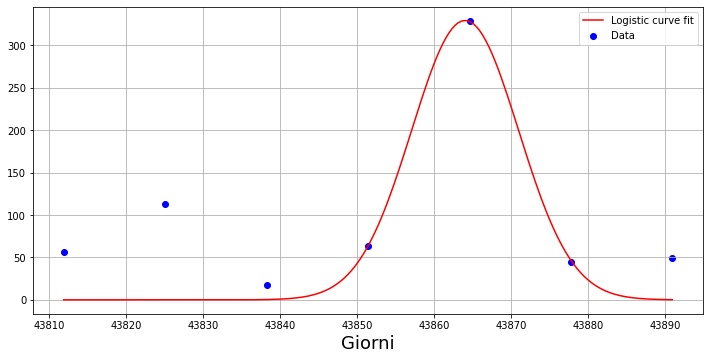

131.49866146375268 26.603999532116102 43877.12876223927
3.3642683281137784


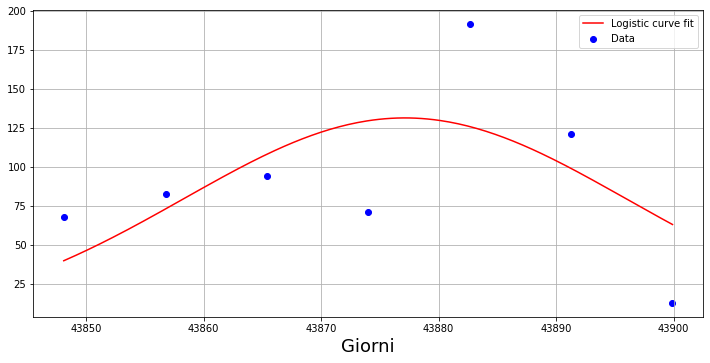

202.04219984805823 15.316061306767985 43919.49791454214
8.564158465830072


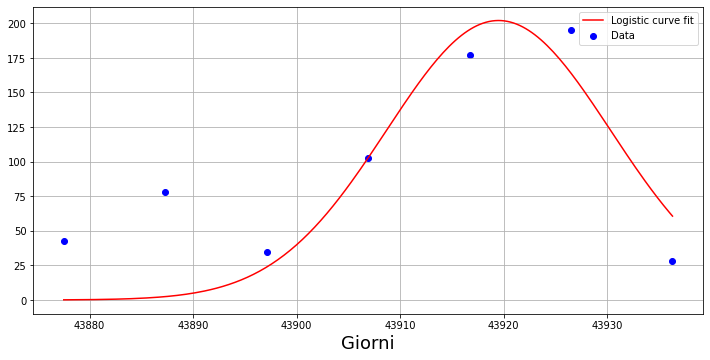

313.1671013790081 11.505335045532897 43967.831576461984
59.808234445888296


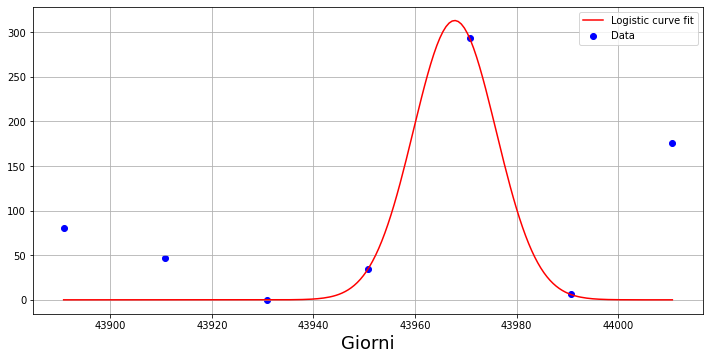

163.92751199152144 62.490792068912356 43996.89281922462
0.6625786318255049


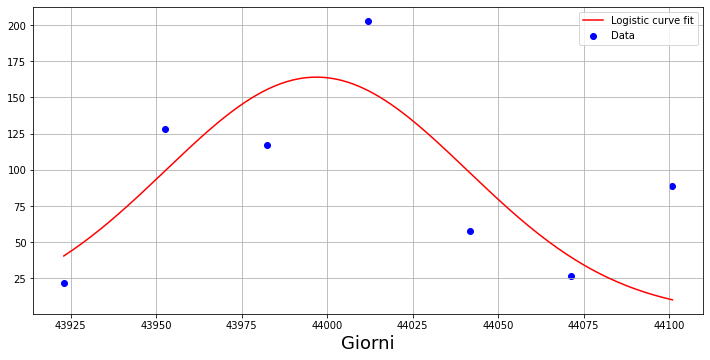

196.71917472344788 12.814737326245575 43983.05896349383
12.818113619961949


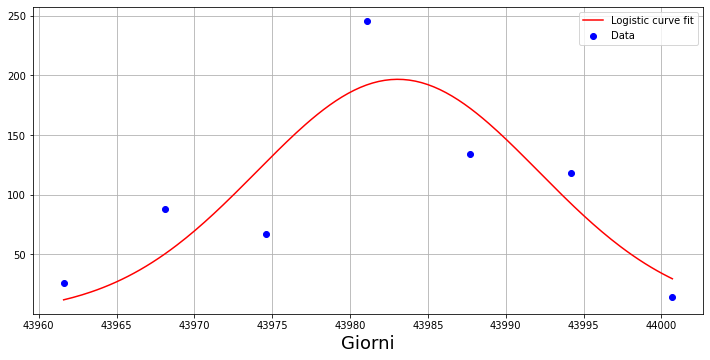

158.5303535259288 15.061510072169872 44000.612686842695
4.647491053847695


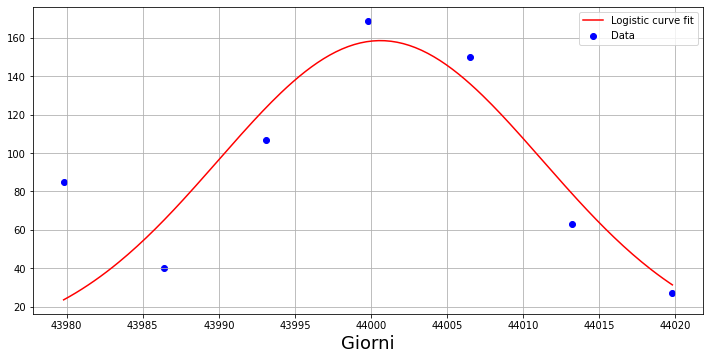

153.52280403451738 31.81302538965873 44016.74699850053
1.4622997905833137


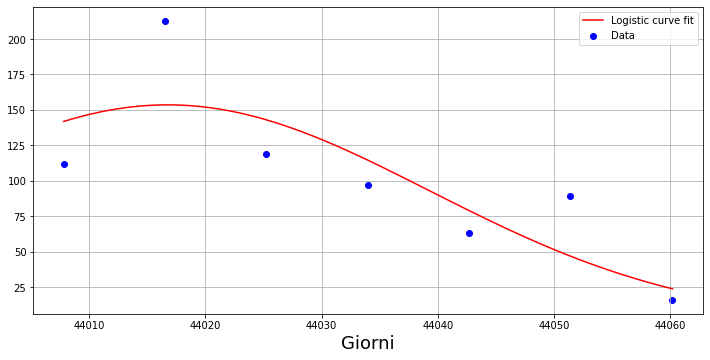

217.96600559972742 204.29295026200342 44194.15247009343
0.022504470226482214


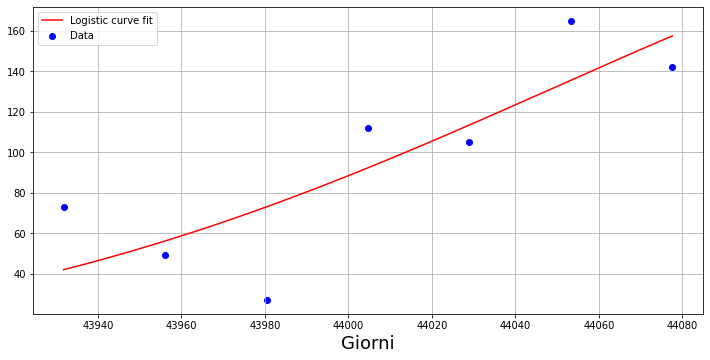

149.31004382844236 30.822683355628314 44076.05019199716
4.112111172003219


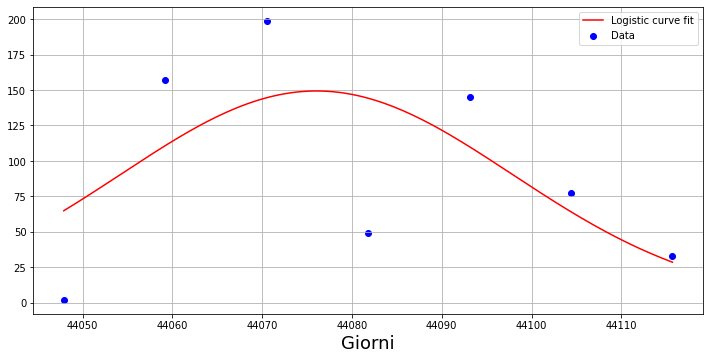

226.37243363279353 21.814914608807598 44089.49202217687
1.2894936949366822


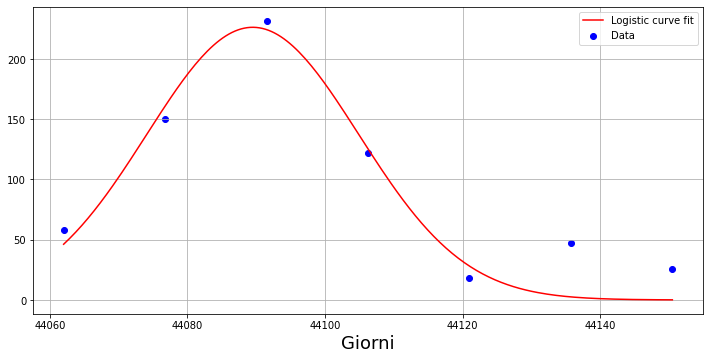

148.71588765194065 48.40650953719565 44102.890671657195
1.010453063194566


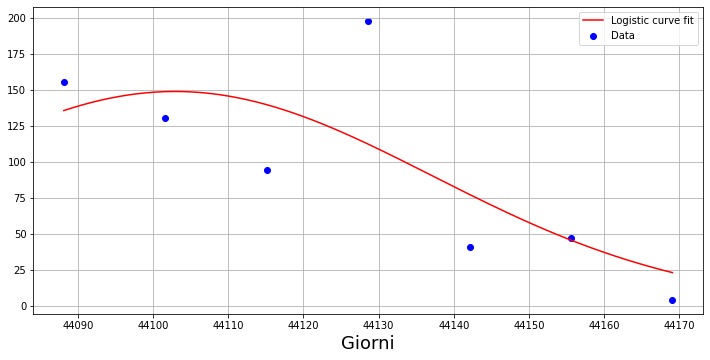

115.17399499776876 103.9005817081479 44034.51645304478
0.4042291845236784


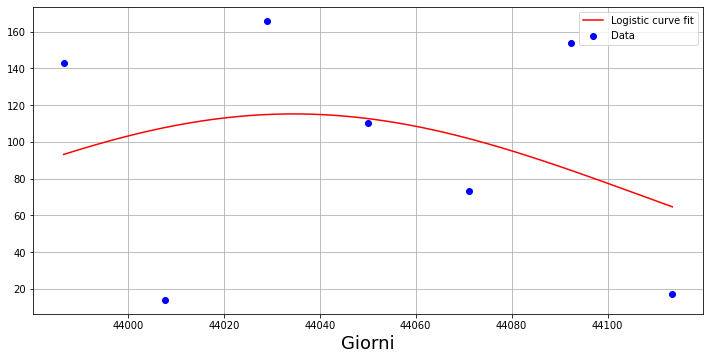

128.97666600761815 56.29482333125834 43987.86003134203
0.34679712965101944


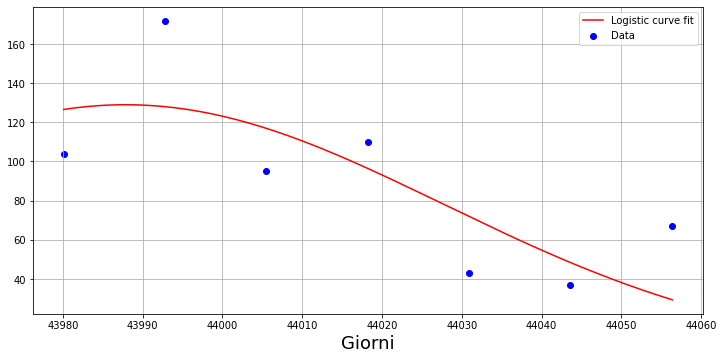

243.7652975703406 18.79463556417934 44028.90119904229
4.135650503085151


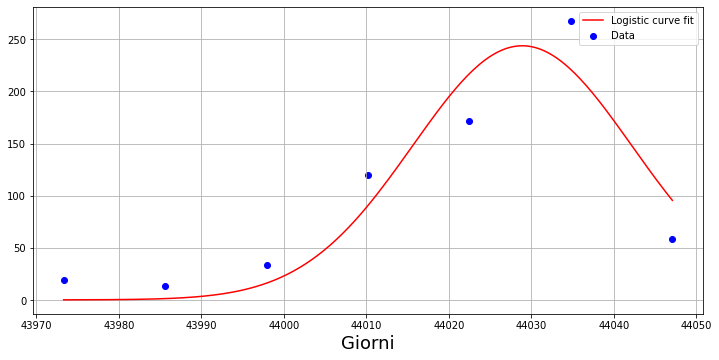

148.61847650334047 28.858032090434364 43967.58616838743
0.7949648189603397


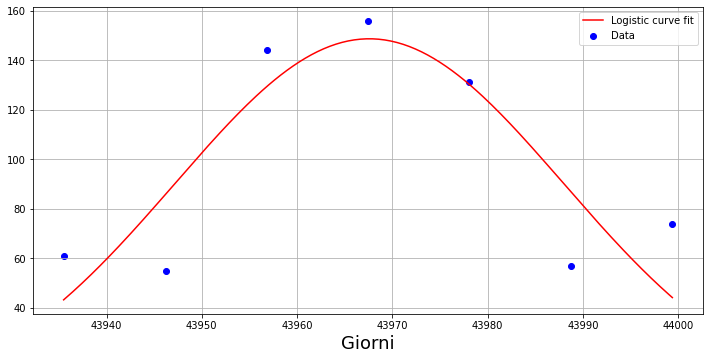

287.5044513182849 6.187601422354873 43967.002538319095
130.34515198873822


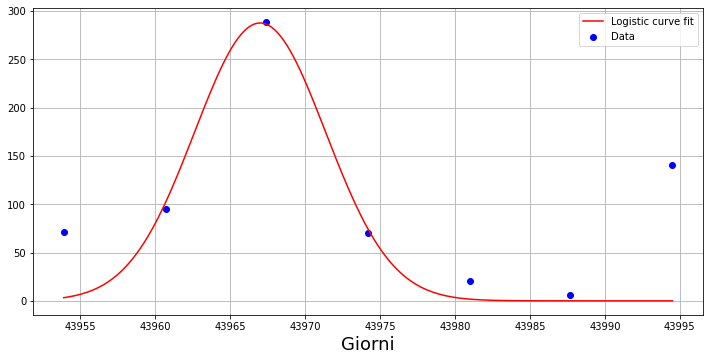

109.16749879404901 219.21071218774273 43847.74211935396
0.0120433528987008


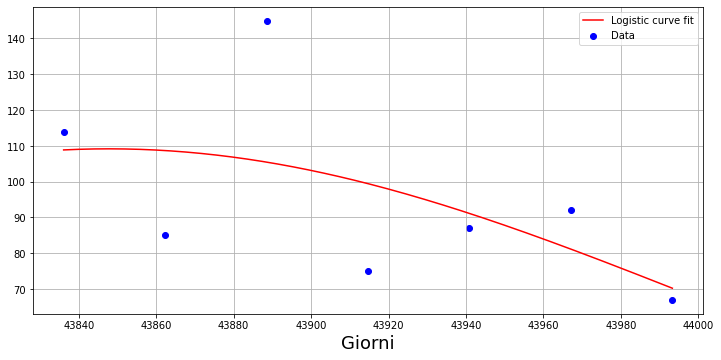

122.32714218434025 20.496468677302932 43896.70493029158
4.113785420895654


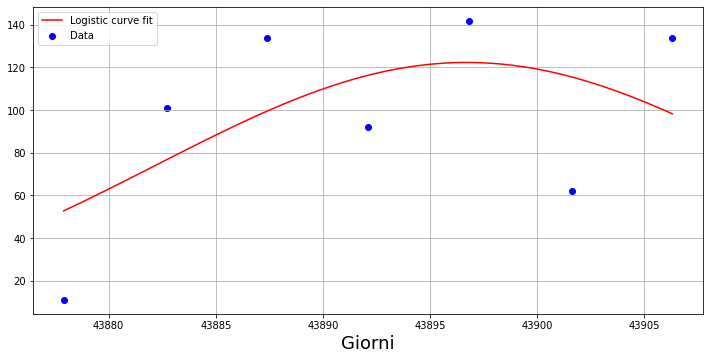

228.01811276556424 28.84598852650291 43816.11200633255
8.385664688438343


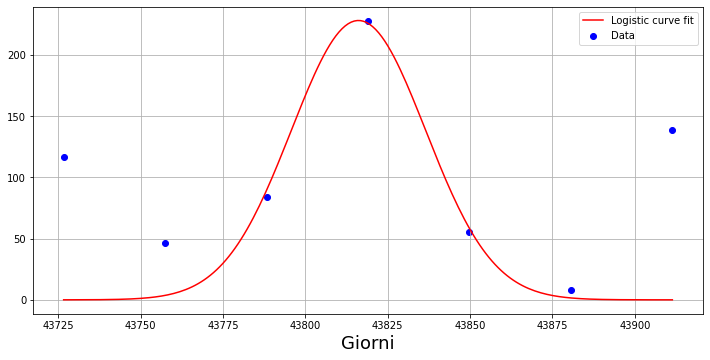

136.5710592530497 23.094710670388462 43808.37527885327
4.773189914231628


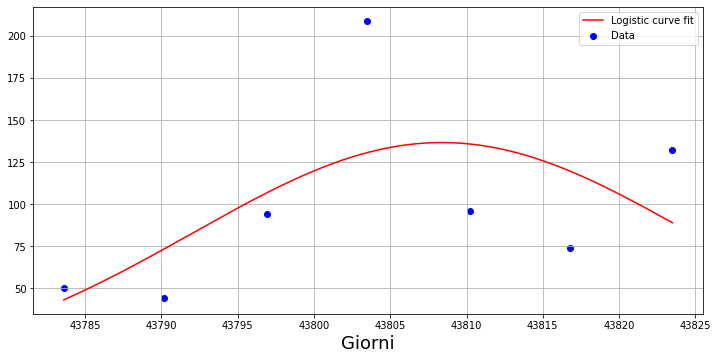

239.27875150723023 31.65919672351486 43855.79467782541
4.801669869982246


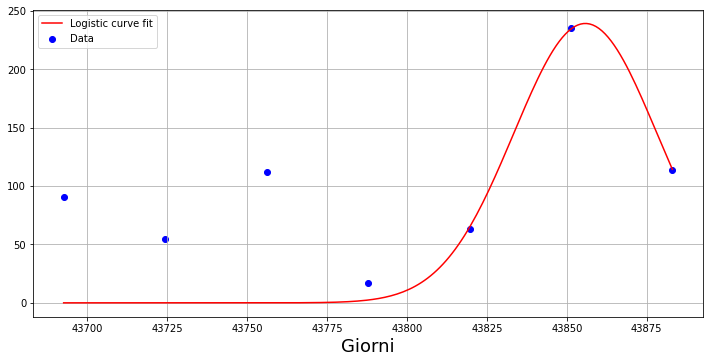

168.0850947620812 20.053294694848372 43703.562895496216
9.352842386205186


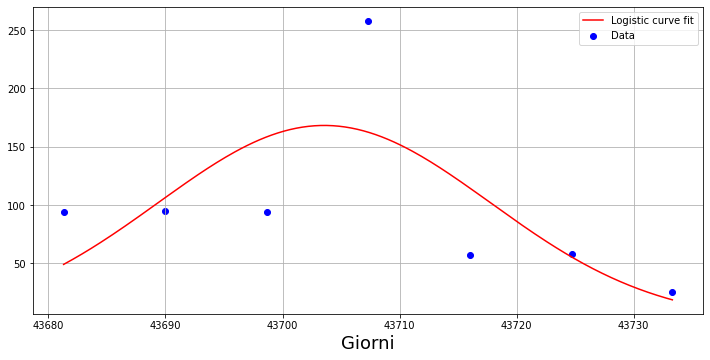

217.0022090095315 18.78016632903867 43720.68482339922
2.6624716277771356


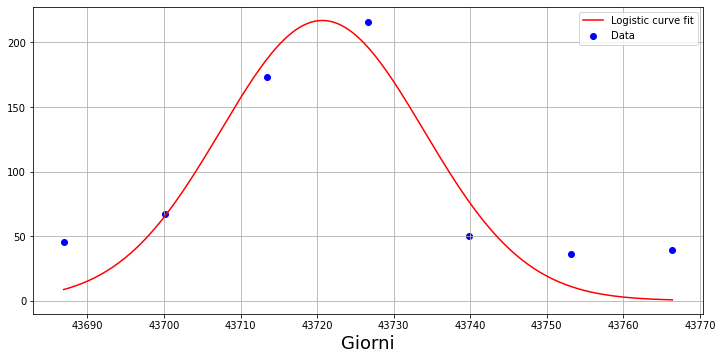

140.43084354097212 144.24955192408737 43806.81406893618
0.3004457969469971


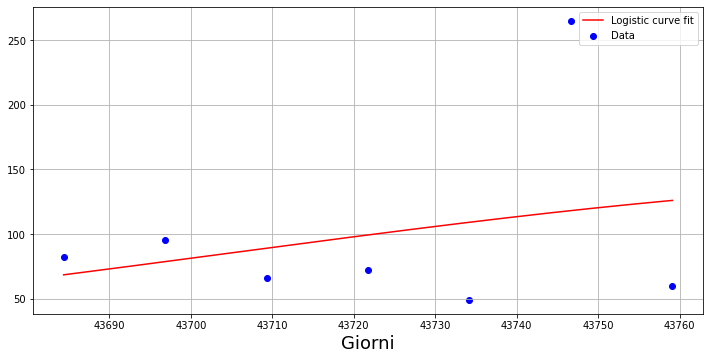

262.93652468516564 13.06931728689045 43731.85831830602
6.8294246909083345


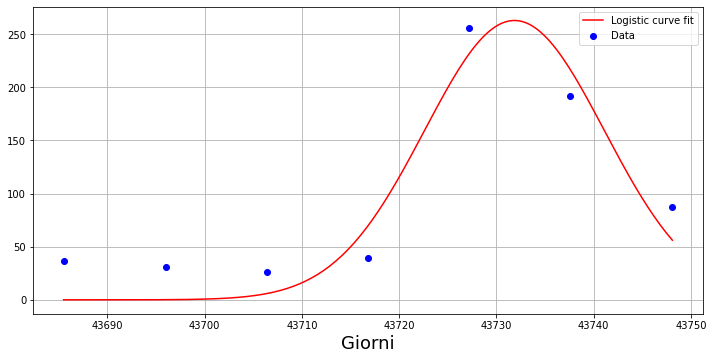

151.11281943669053 57.65932682536356 43708.900607430354
0.6459130513115431


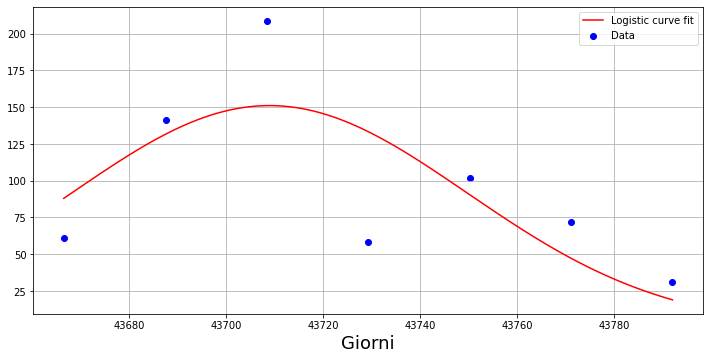

138.83519745535386 79.01946193489968 43651.842230720744
0.3235660661915026


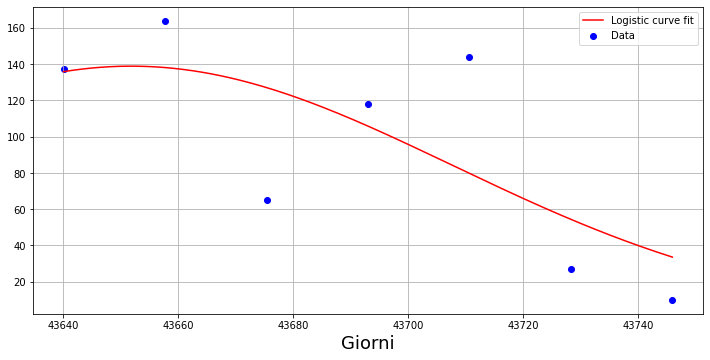

196.36853644981304 50.70040988669624 43837.70743734149
2.440965241541943


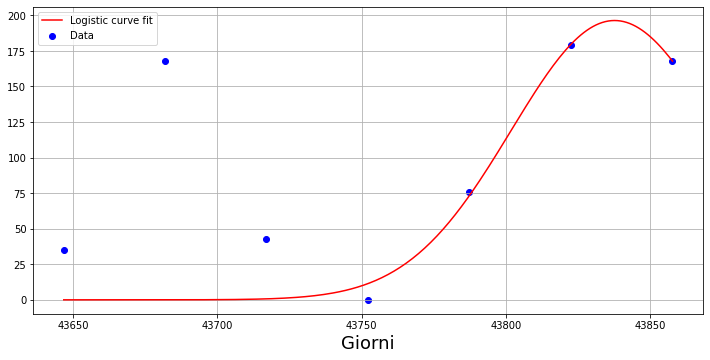

112.61509294369479 218.89342920308414 43993.23468536948
0.008301971995276613


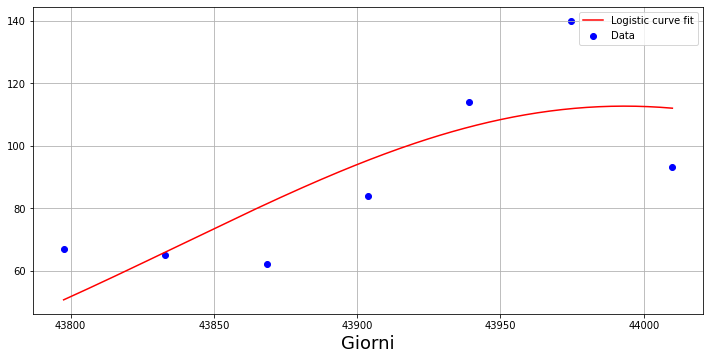

184.21010509992067 19.289271563012576 43999.483126084095
29.10753044791208


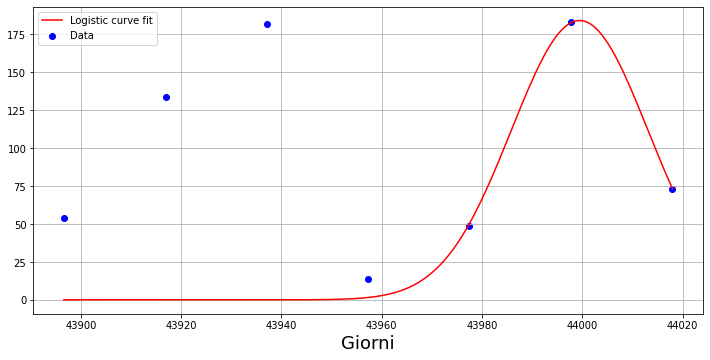

139.5614436015308 47.422998372974696 44005.1853001727
0.11998803698468533


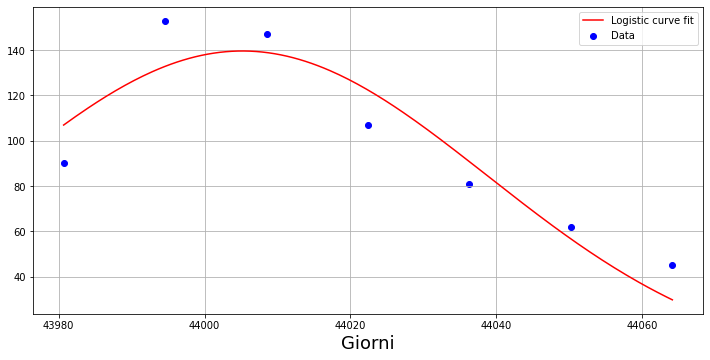

214.66603085068192 29.548299348551286 43966.258190482964
3.078642065815046


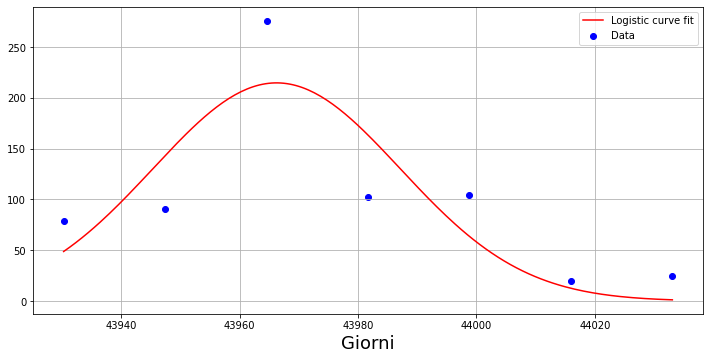

124.35918232760976 55.95666033935524 43943.560700353904
1.1467319366081867


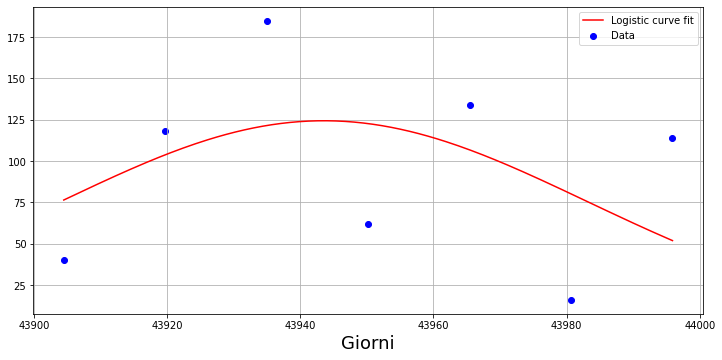

127.6225900850461 102.56382237857794 43872.65472222599
0.6696563612903559


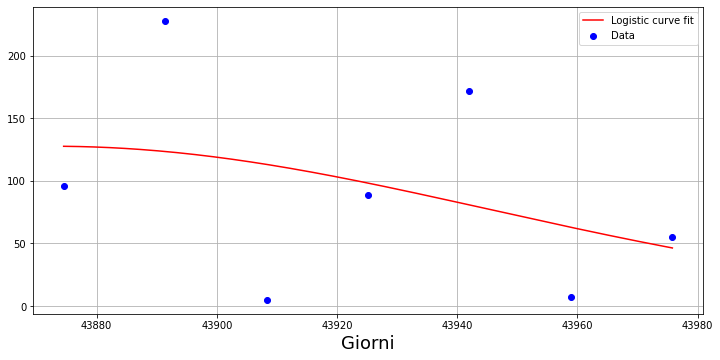

341.30100073175885 8.608904308161373 43939.01383788446
52.15399512369396


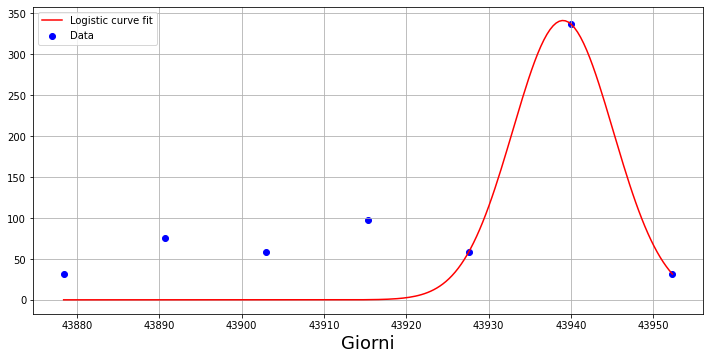

236.27644068861125 54.22336411761653 43787.454982457384
0.9070096471955754


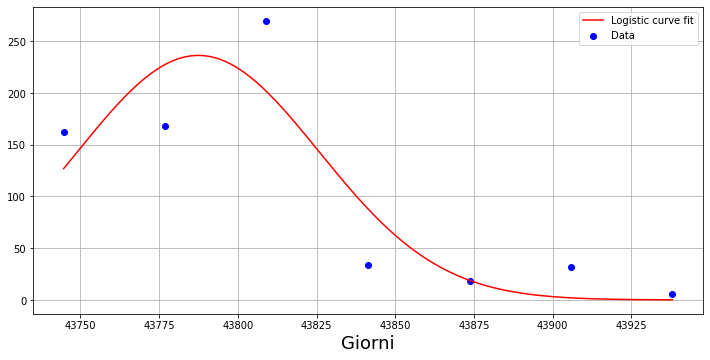

252.12949447539296 11.016619261268643 43843.30910904169
92.75919161546442


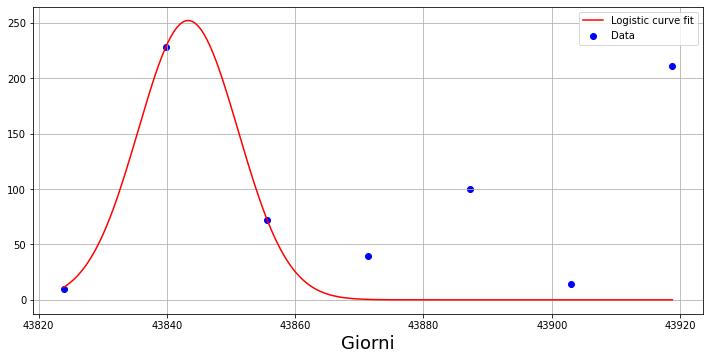

184.45256205350518 14.494699021927088 43898.01978908152
6.544372701781699


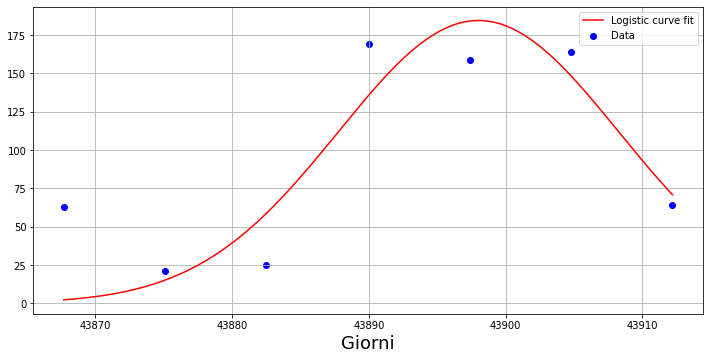

185.85094969096178 41.4014559998211 43921.24767948648
7.168842865464301


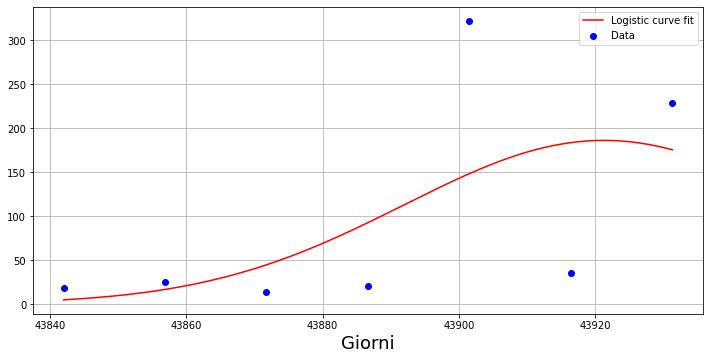

170.47893963843285 25.904050436137698 43806.54108583621
3.390701169042866


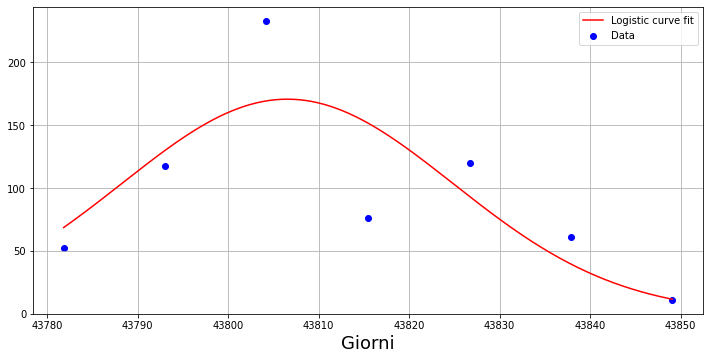

260.00027420738644 9.381695649604353 43827.8734475276
91.97097767475407


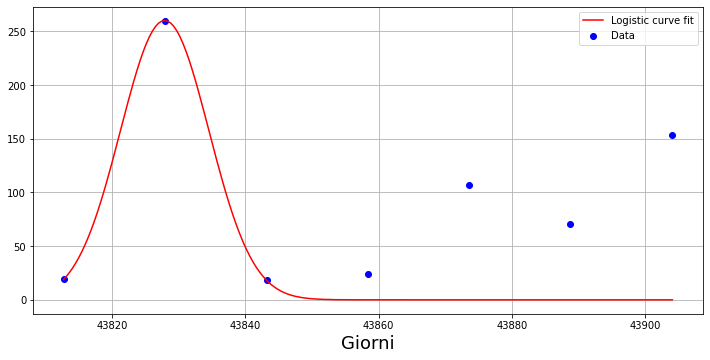

121.28140482965468 96.89069898905407 43940.219946568766
0.31570394808886765


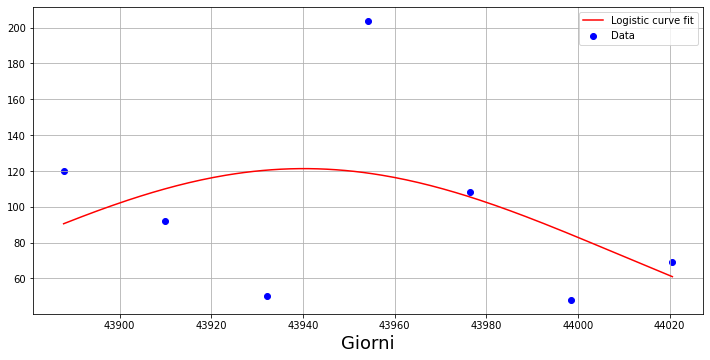

163.27028913147217 112.03493428823359 43992.066905507425
0.1574523723286574


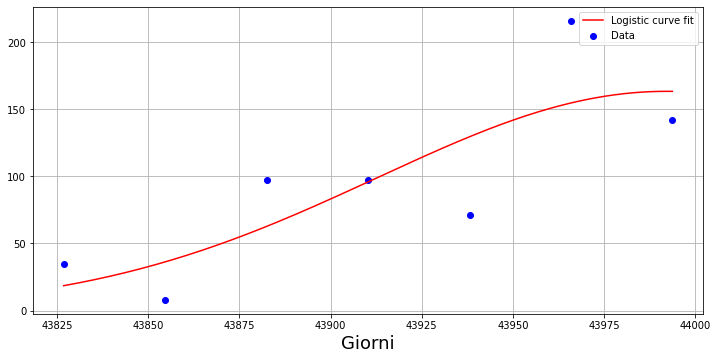

216.5820381884554 56.244477429985665 43759.4816456001
1.9629032667409292


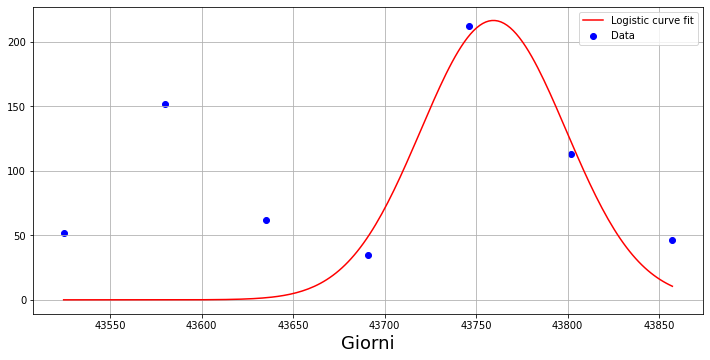

248.49479982105905 27.740057757061635 43603.699890797754
3.8066117623545876


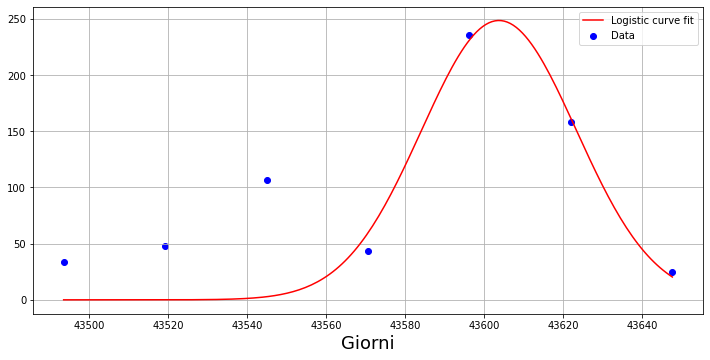

299.7892657097874 16.022476468709325 43683.295806727096
30.87740056518971


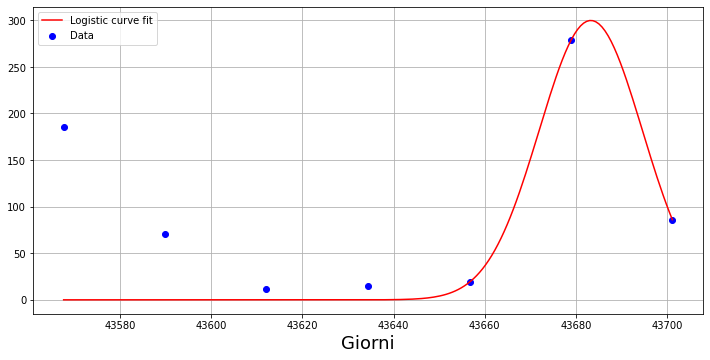

209.33314538836555 61.026682001899594 43440.64242182829
0.1451758738207535


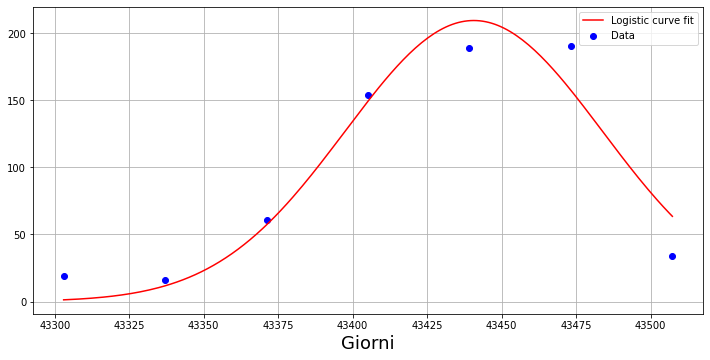

124.03848342513547 103.40231265873665 43475.336712003016
0.12312761578876312


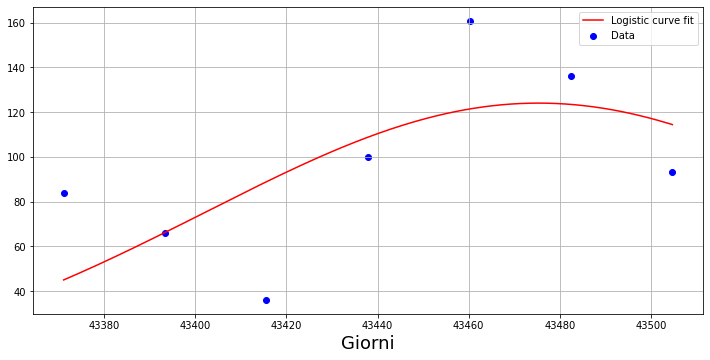

143.6362608174174 28.632240300223078 43494.31090473298
2.2683672638499868


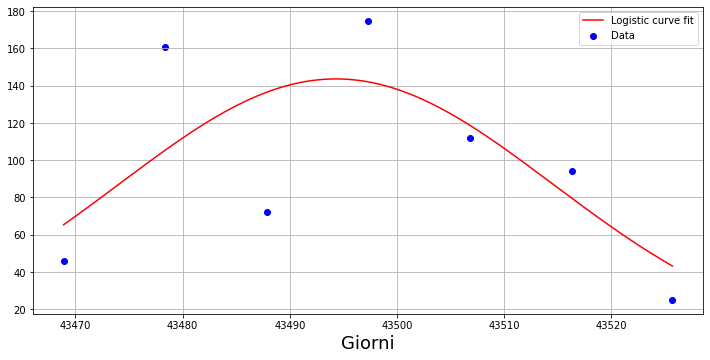

105.20208325634276 64.37442828834669 43475.32903103599
0.3914316357852162


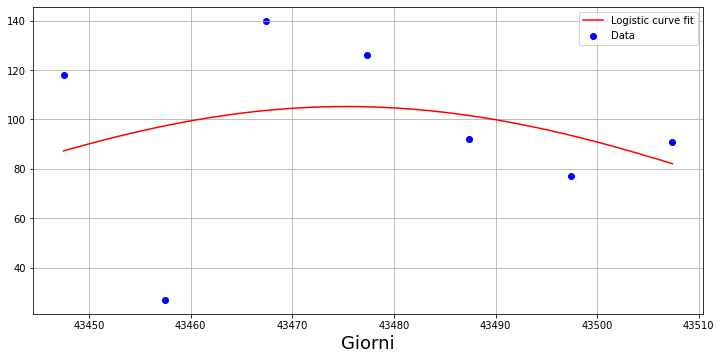

143.20966811289665 55.4227646322968 43460.22163300031
0.4247054956577925


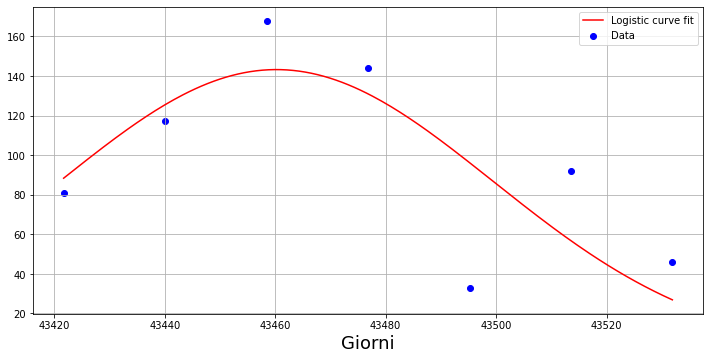

287.122035900488 10.42779334688758 43543.25673718108
16.907294676743142


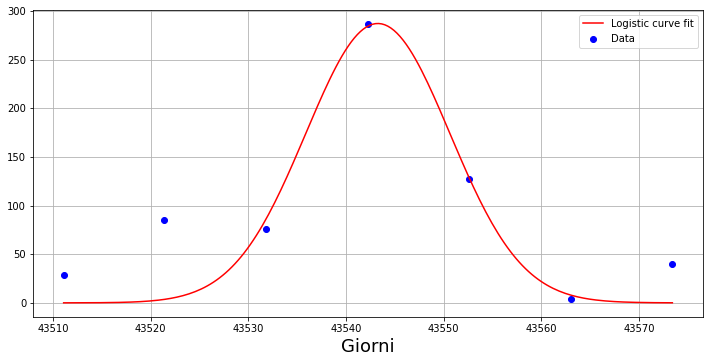

159.22705648236823 45.25917223781184 43577.24265174993
2.4235968324737462


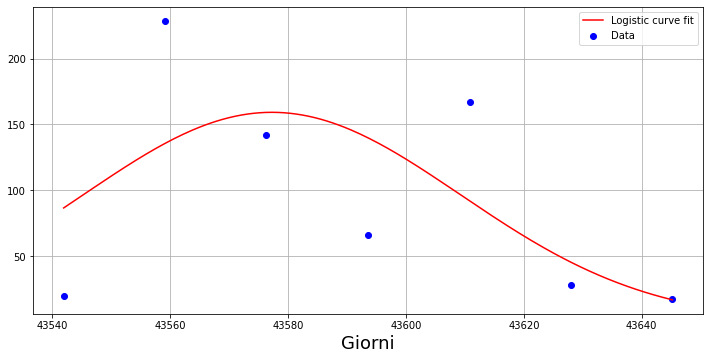

255.71132471948613 17.389237700810174 43652.303706380626
5.6910314253541525


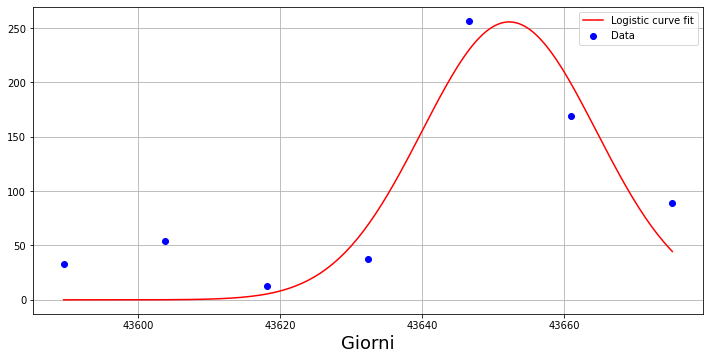

141.76667447813185 40.46587150183398 43631.44933811572
1.667997819938114


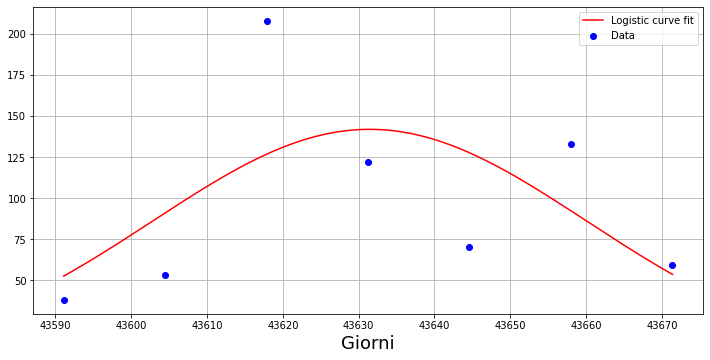

260.51685275595344 20.455910584800655 43525.22791353084
9.394948648972804


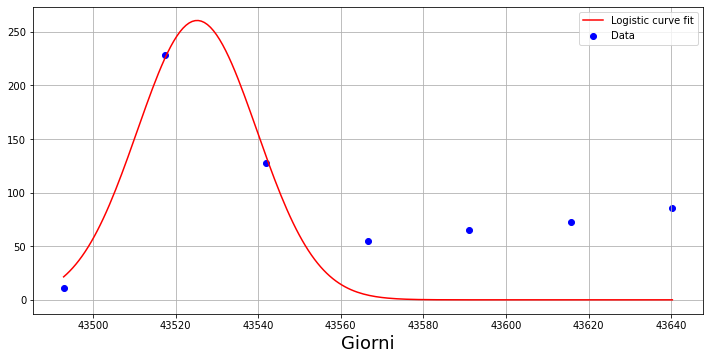

117.29067839998625 57.65306762249509 43472.80498869102
1.0470156314686059


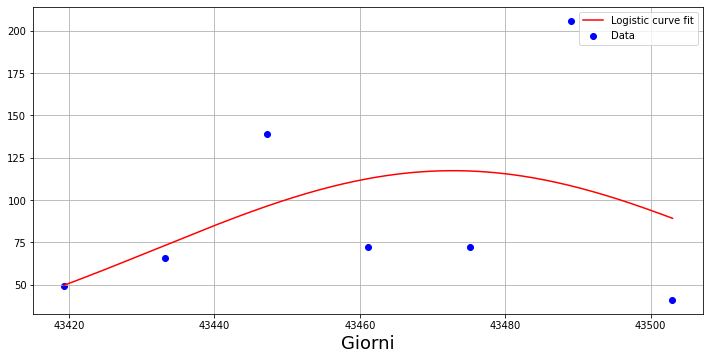

219.49161711500895 24.714178041198398 43497.505317171555
1.3585060449910036


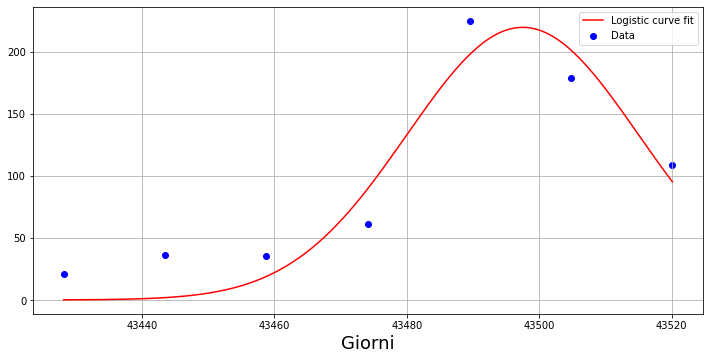

114.48950022209475 111.83933456906537 43418.102941328034
0.21803928321311883


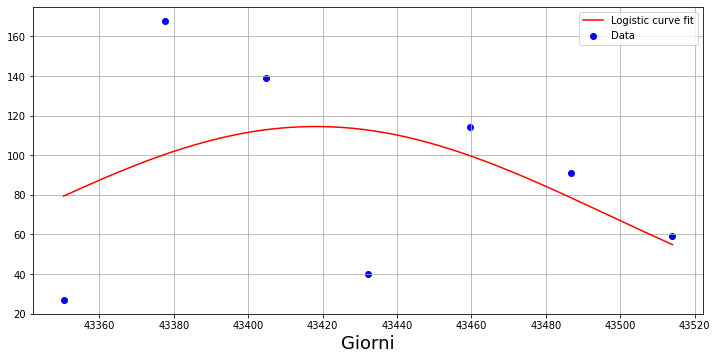

214.38161084819336 36.48926979150886 43509.43319056001
1.119844385089765


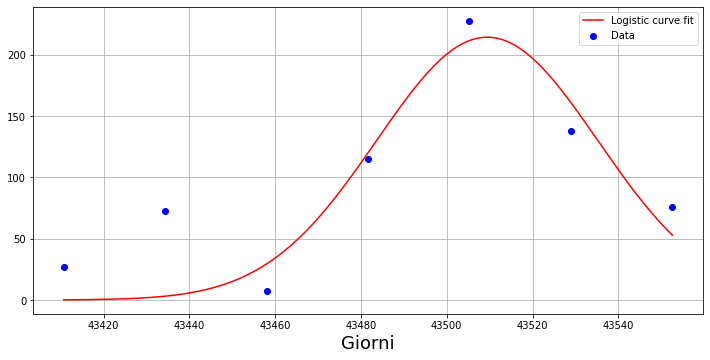

167.2253923028194 55.01957142333414 43558.099472155685
0.15591619745682106


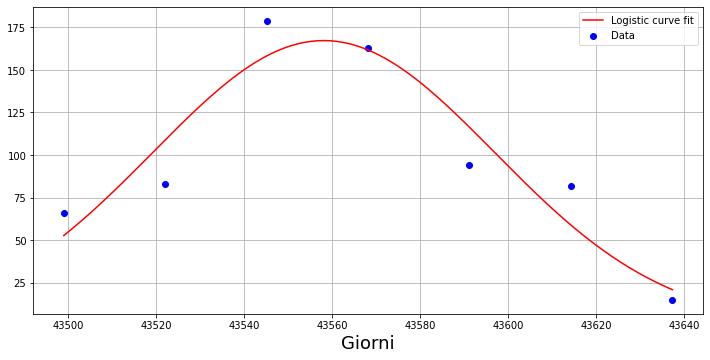

126.41525150243028 152.29267319020454 43641.1555289729
0.11545306961174737


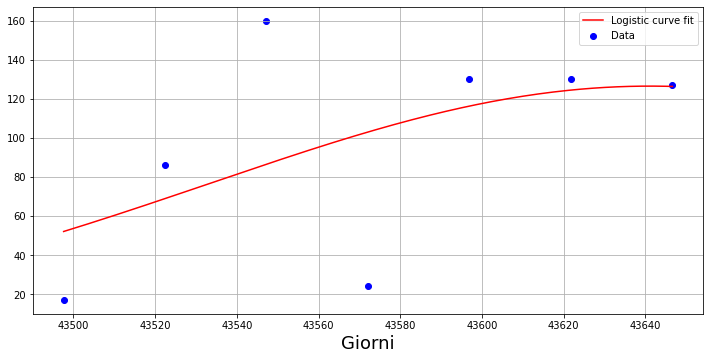

242.48674157245614 13.628584372329083 43546.40900286989
48.37218191683523


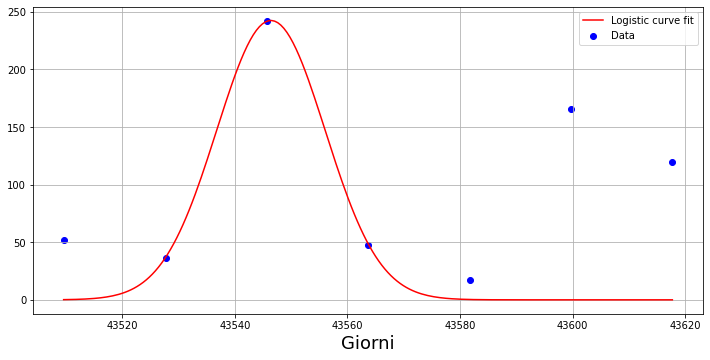

221.36628879539668 12.906668640110118 43560.82522118362
6.008109129686339


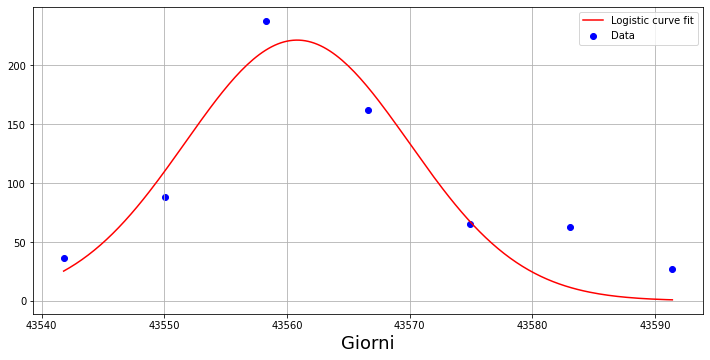

151.34775561477974 61.126894760626705 43433.28631929088
0.31736799038301083


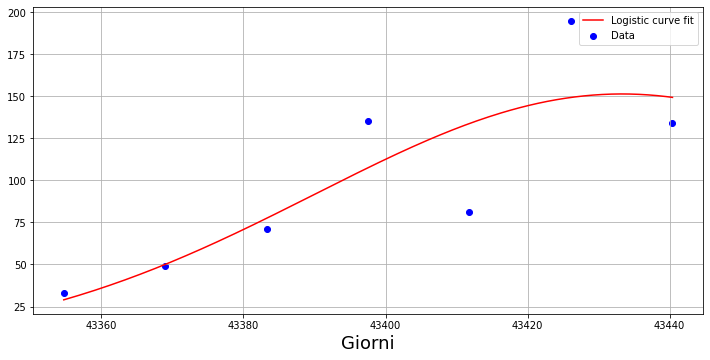

269.768327857831 12.585807503503718 43424.69601424508
2.8463458816298313


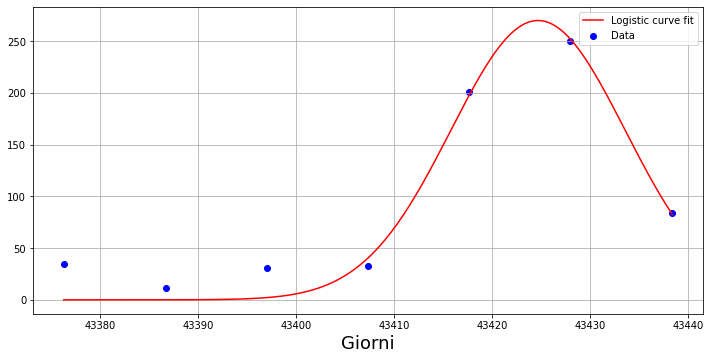

192.78470769371268 41.95144766671949 43331.56147976591
0.07145690882393665


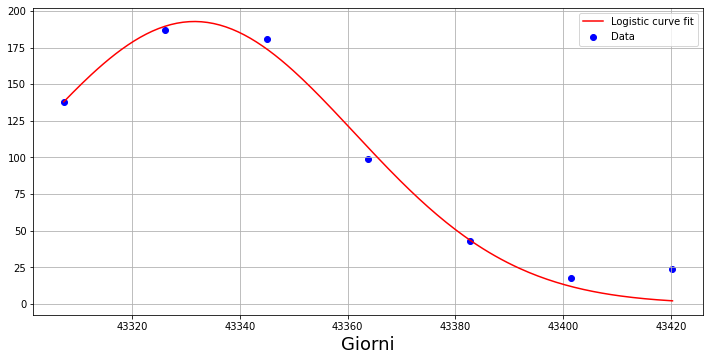

148.9128254793267 53.93925080366261 43282.05727024142
0.28704023563017167


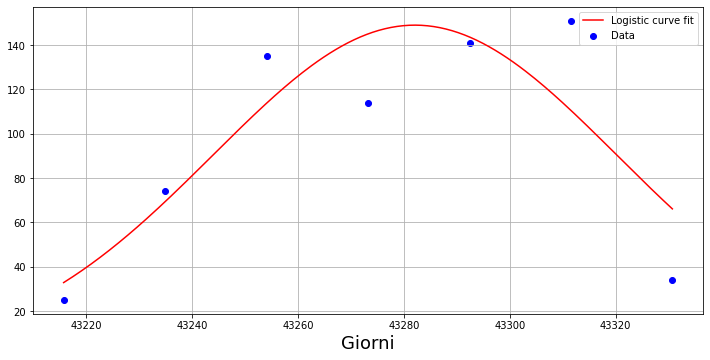

124.97683242698177 199.1707756013365 43275.25487391811
0.02524875698023138


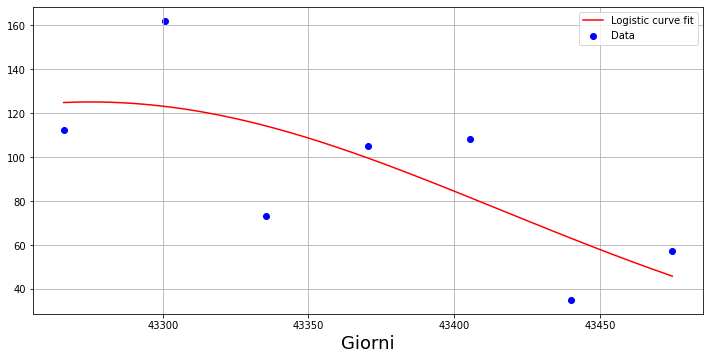

272.55737743287204 23.211851586478218 43436.7498306584
0.5742219887399097


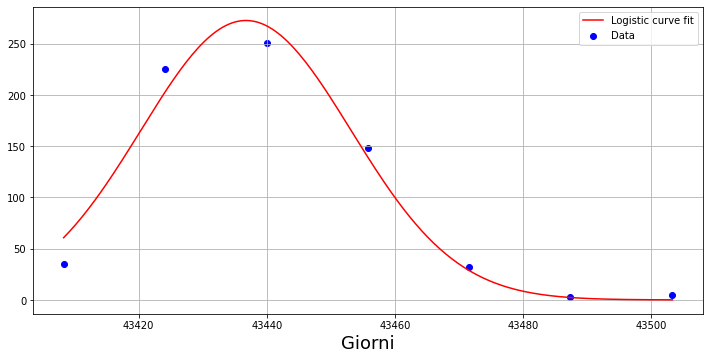

207.76867536858438 23.188168471410723 43334.38040349559
5.489503280589065


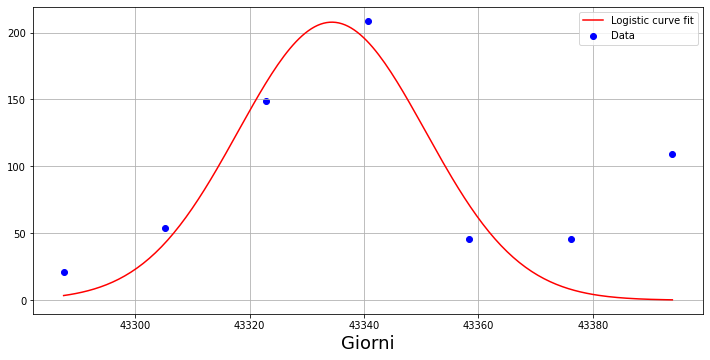

531.2933808988017 157.07505711121573 43530.51757758801
0.014557885024289027


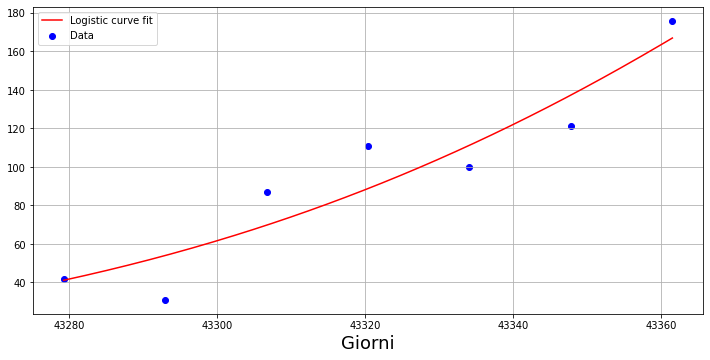

110.67137689442319 104.41600904422978 43333.557079980725
0.3069182651100198


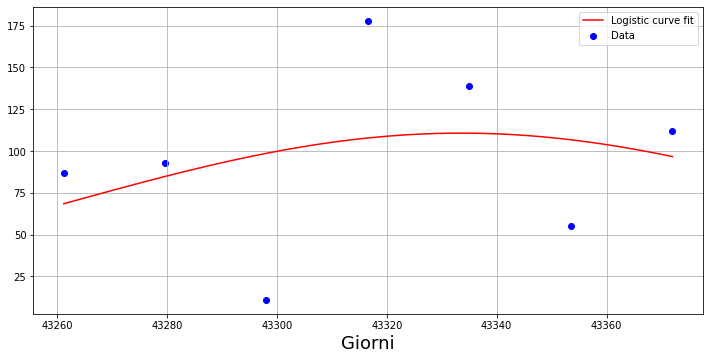

115.3739418747473 107.94496694119691 43381.92958812024
0.2532996417587838


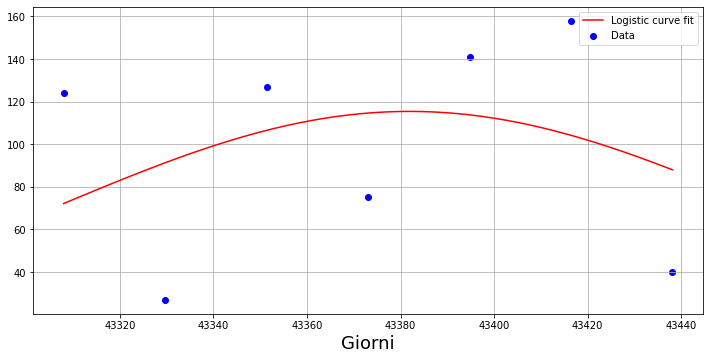

185.03461107874236 22.72982119808121 43402.1349328663
0.7381454312488482


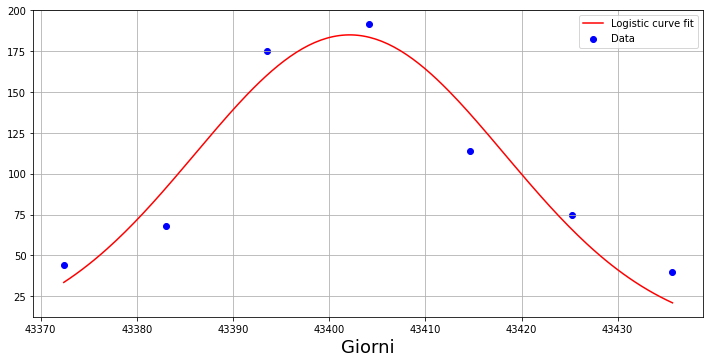

167.0037099495255 23.4936643866471 43377.83054473217
2.873517736015758


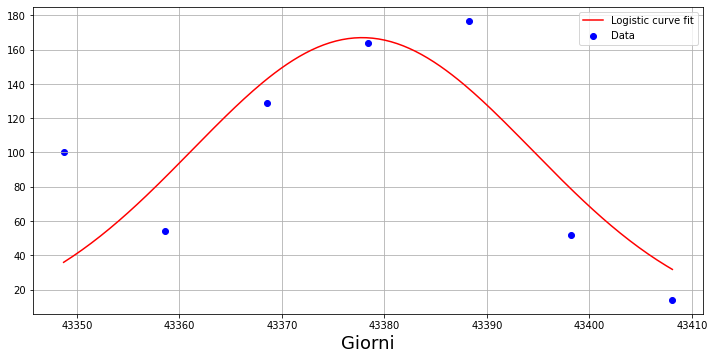

139.92009963851257 66.21552921741383 43529.33643681633
0.26808648208651475


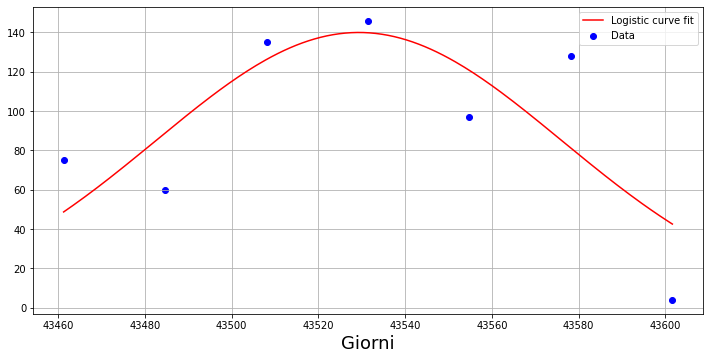

123.11784242937772 95.90044868917302 43663.10409765405
0.13722347797869822


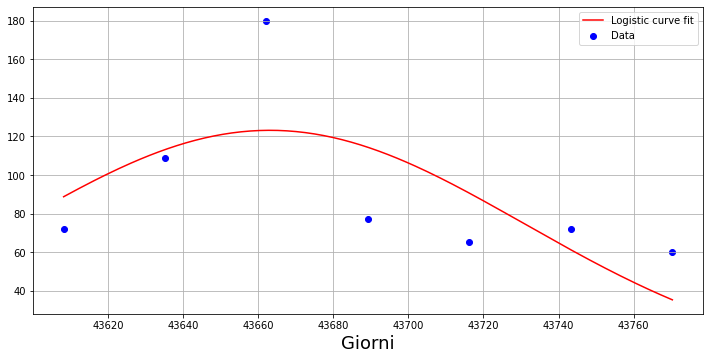

437.86458731101914 4.801115905881844 43549.39029838785
64.56894962946393


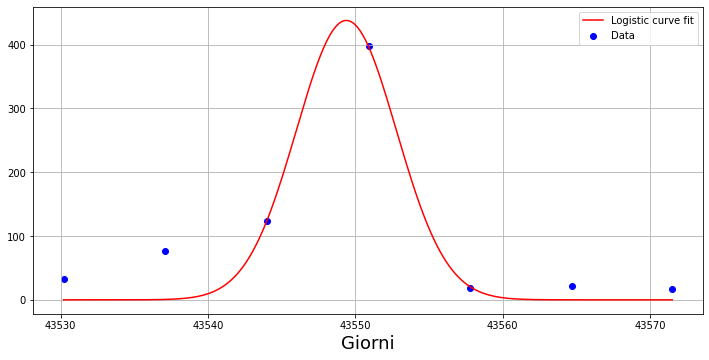

207.49357751491544 50.23121626402799 43420.30242842674
3.260601346022343


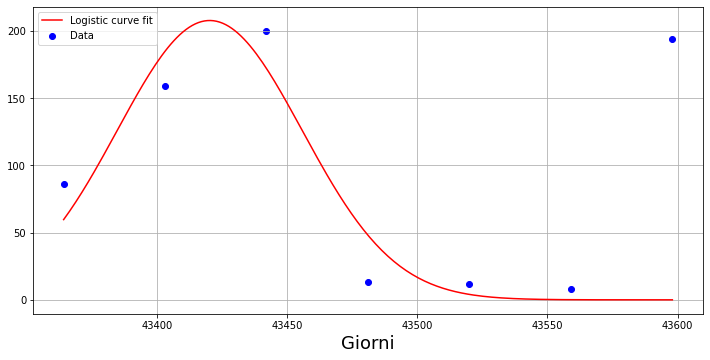

251.17786440946944 26.909173655555083 43351.46433733895
1.1992925380457806


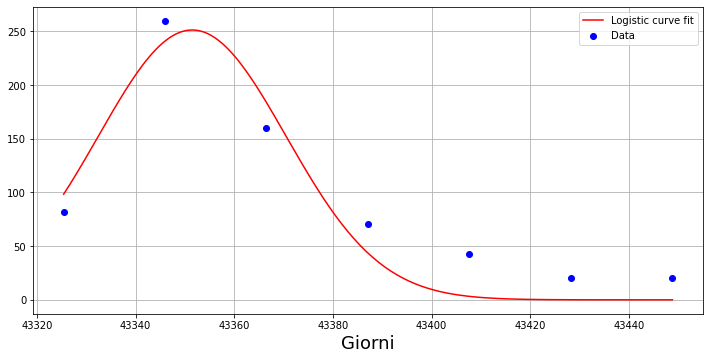

163.97316090052522 39.12772620880596 43395.425124251546
0.76225078342146


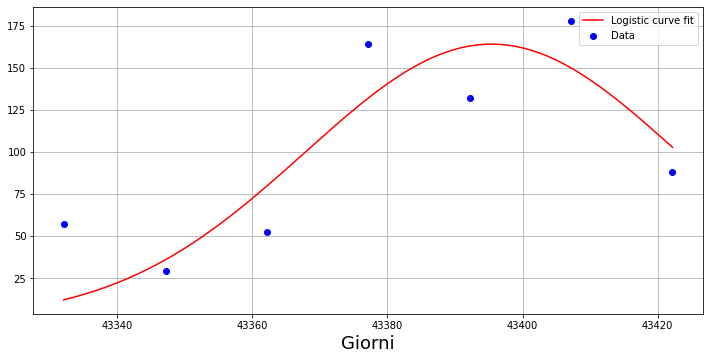

126.10053670081163 85.55499204373648 43379.27951543691
0.10655605417765217


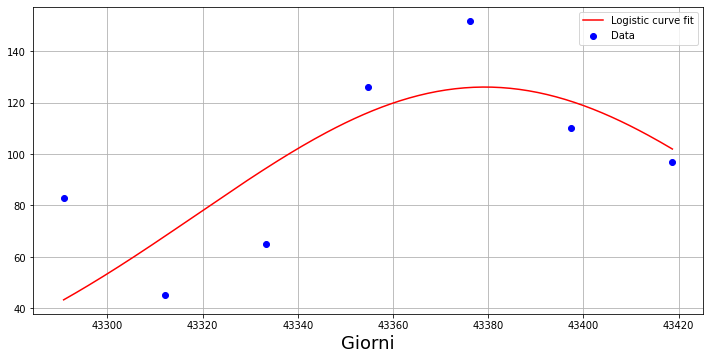

148.78211097185002 31.58455971727345 43300.442485803025
1.8299841083758026


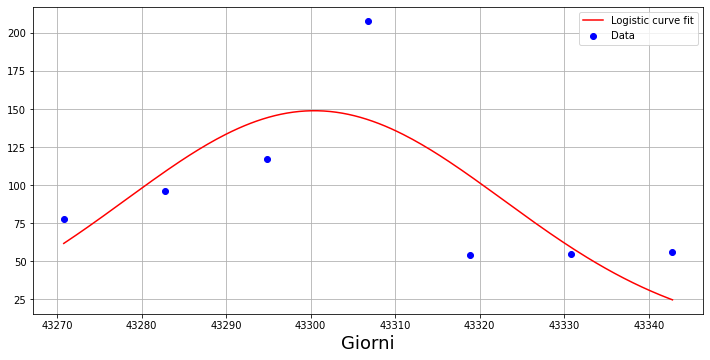

352.8199336168444 10.982419392234473 43342.99289575996
6.483215621093379


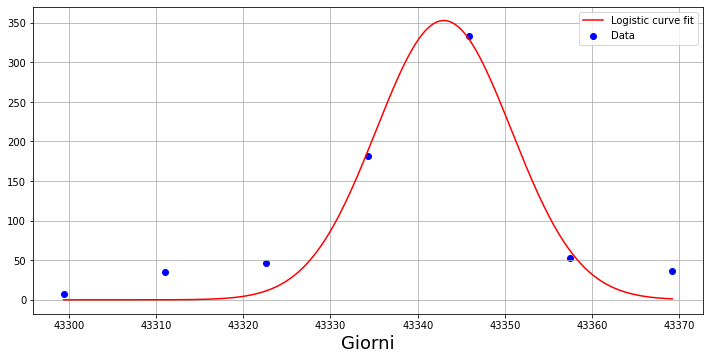

339.04235102933774 26.556587194405612 43410.97144473217
2.2849024079086213


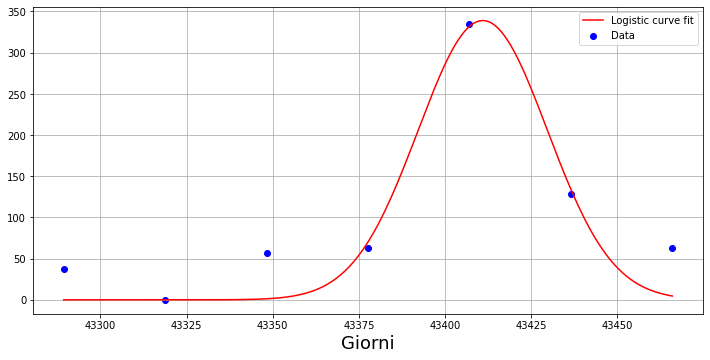

141.61906384420823 58.58489250621518 43467.8125563402
1.1313623510032071


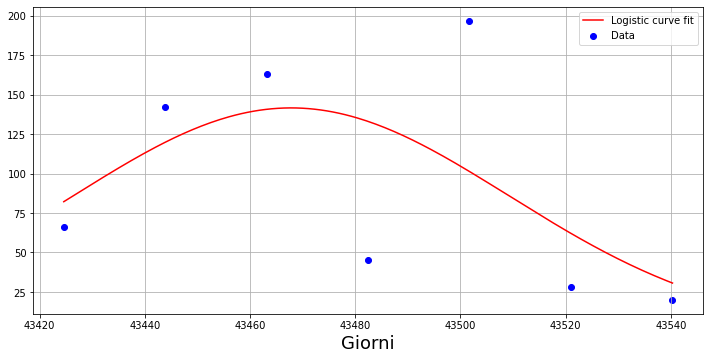

127.47325666497757 26.197454512028123 43450.85710625158
9.2130097396027


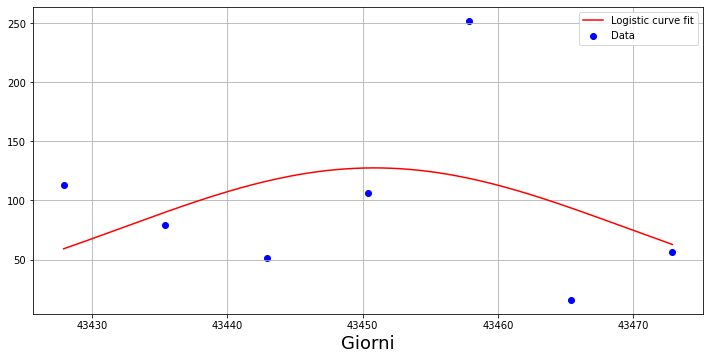

105.07567391112785 86.4086605728253 43487.929187147674
0.4859425543569477


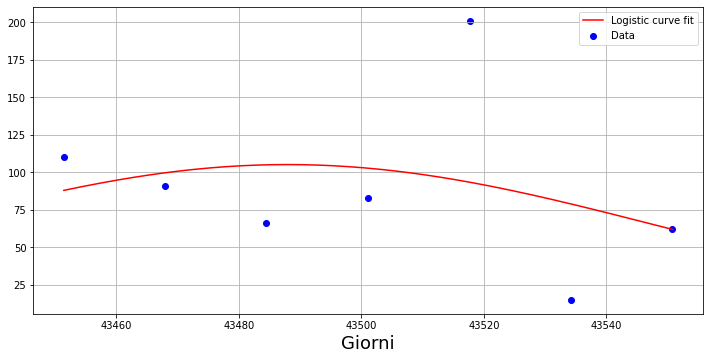

299.1498762724934 10.355955470283744 43463.2023943921
73.05076185957437


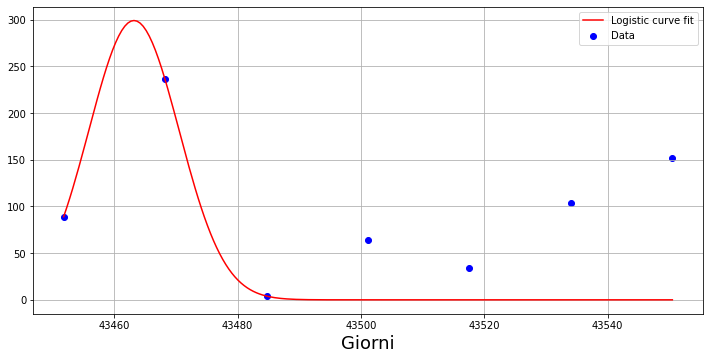

109.72466841117294 185.13020299051618 43612.689579076025
0.04448412615740266


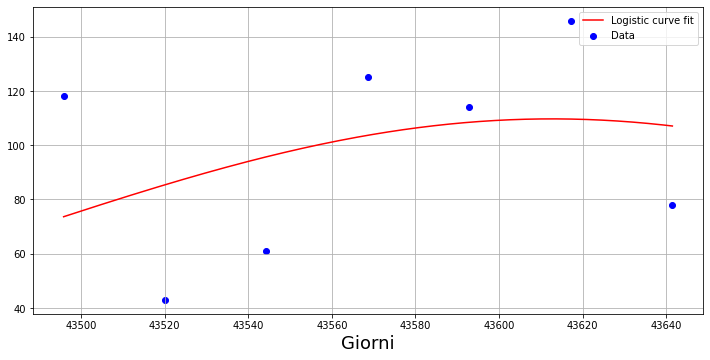

132.87982141535056 101.20335551577821 43688.84132203911
0.1362900687653752


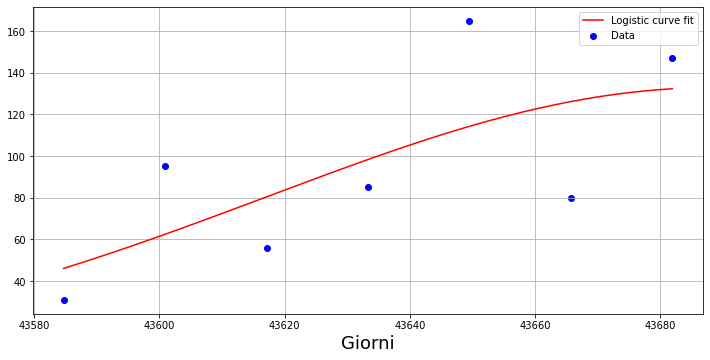

262.7701025415936 69.87709195214529 43645.08474564943
0.08000947139215632


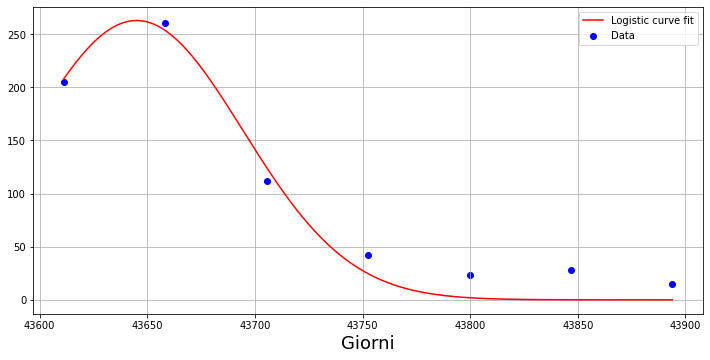

270.39277517324007 22.61633326700794 43833.64451011895
11.311808833340246


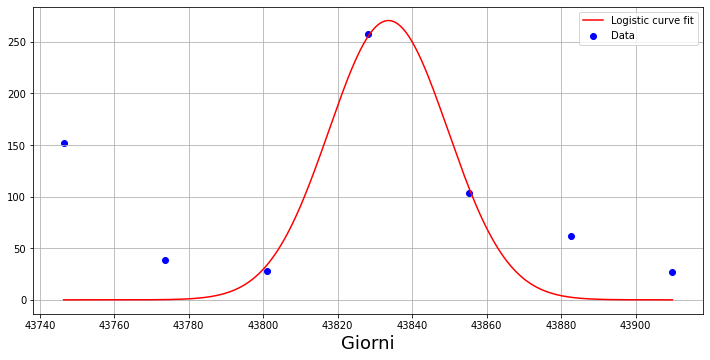

262.5520824622292 21.570834364214818 43937.10103540318
0.7482899644915091


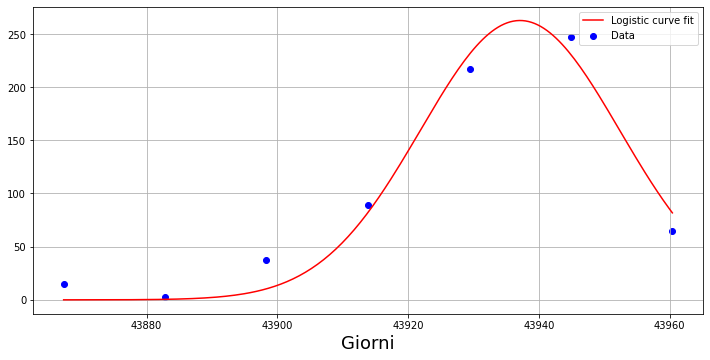

149.19022104334448 286.2752498377332 44132.58838517826
0.019821909059841488


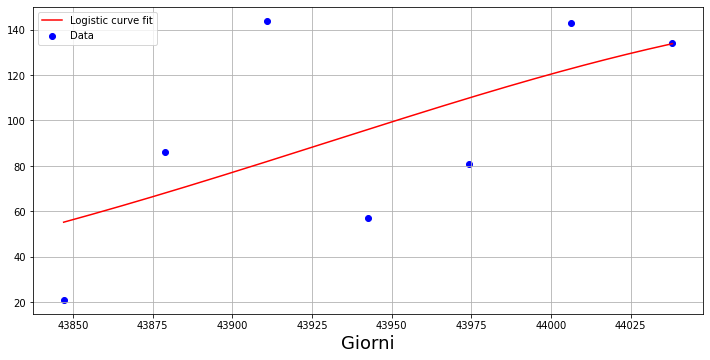

245.84536611872355 28.273701218750617 43966.65806941715
0.2895048199620279


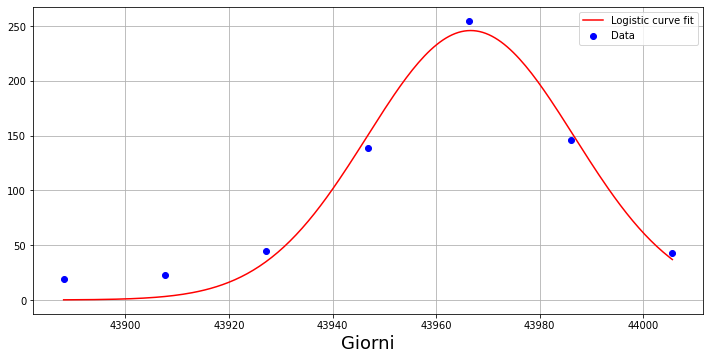

194.47306866304172 31.97388540637382 43873.80125594449
0.2805138756666847


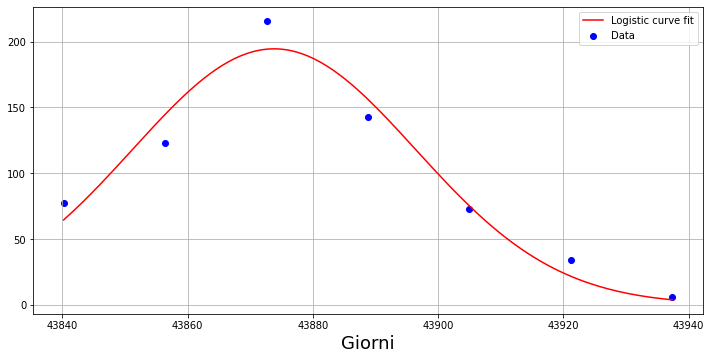

181.884338594535 162.4663933376762 44073.15496461617
0.10082098960628509


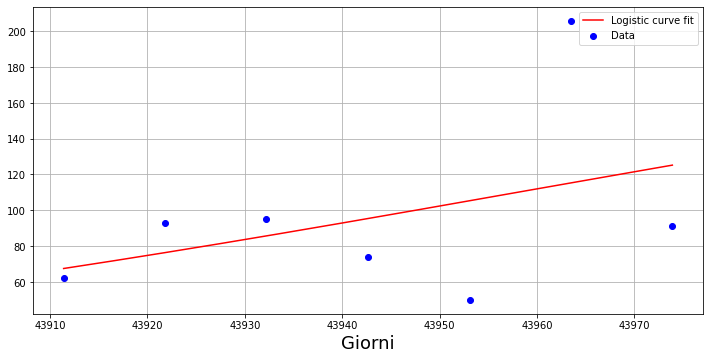

272.8619605400457 18.020653223399588 43880.606096410425
11.397392226896311


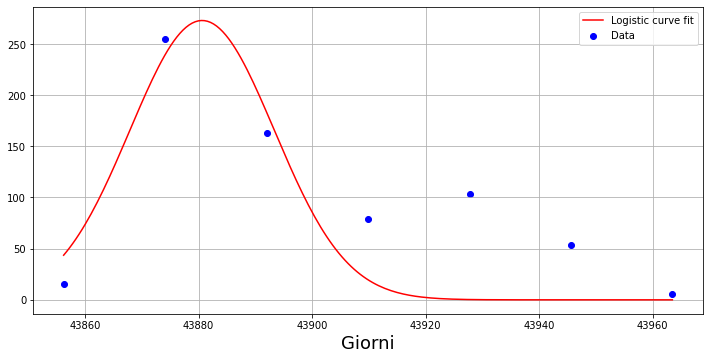

264.5609210787185 34.30396385359935 43857.63550873305
0.928743059465382


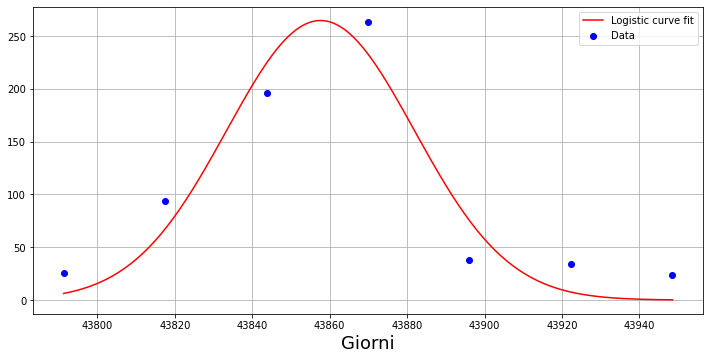

150.30966189418993 47.53166119485368 43864.24036695918
1.7375371732009817


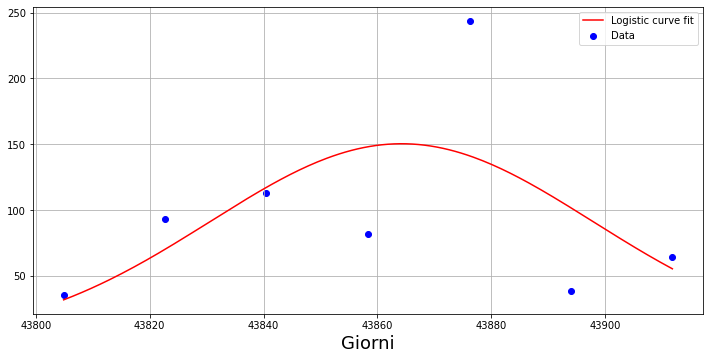

313.73720305628393 15.554937260567769 43882.17767638736
14.905232730545569


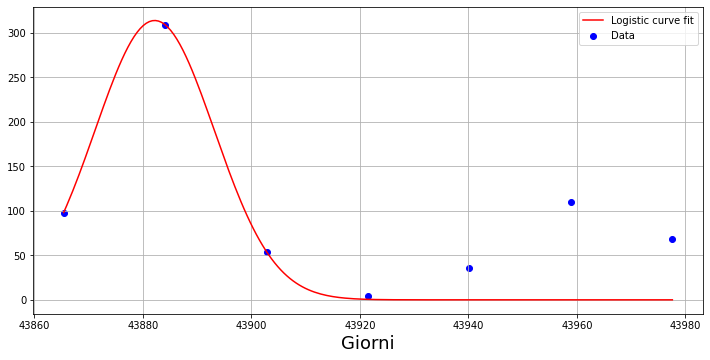

132.1961030072879 43.4074711763465 43977.800543865014
0.7846212389699885


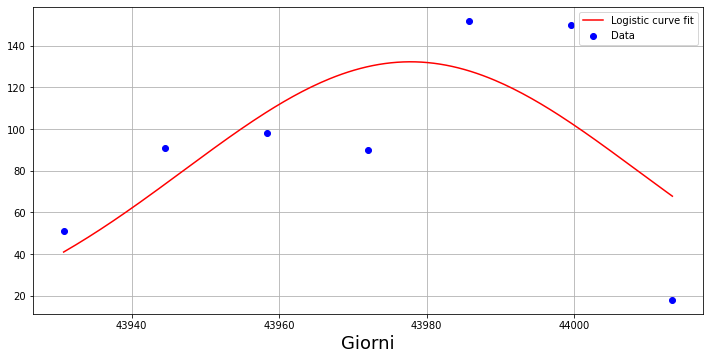

111.8924517736048 102.12501187755143 43961.51781021597
0.25109562620688675


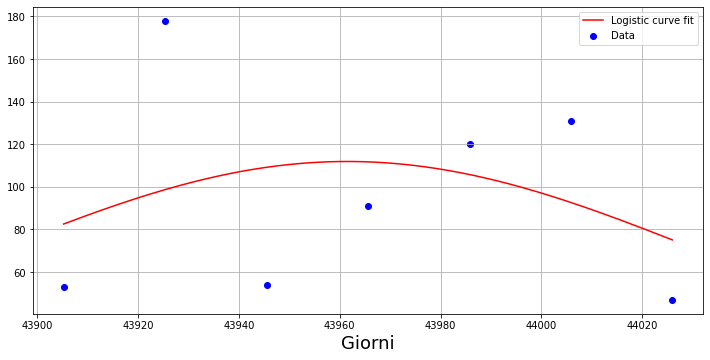

155.6461774089589 73.13753793606215 43878.61855111054
0.8166708516809308


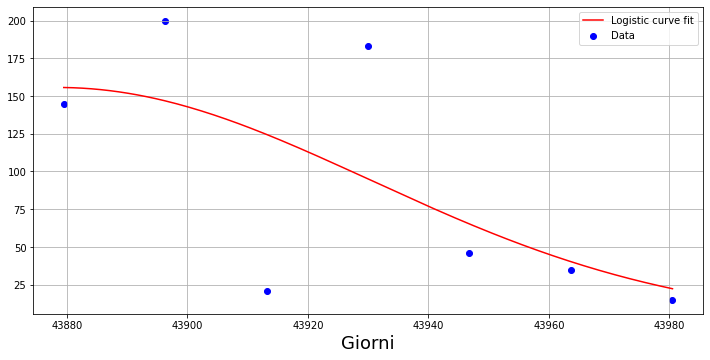

117.67727409244979 66.93914499743215 43928.39123104418
0.589263838698673


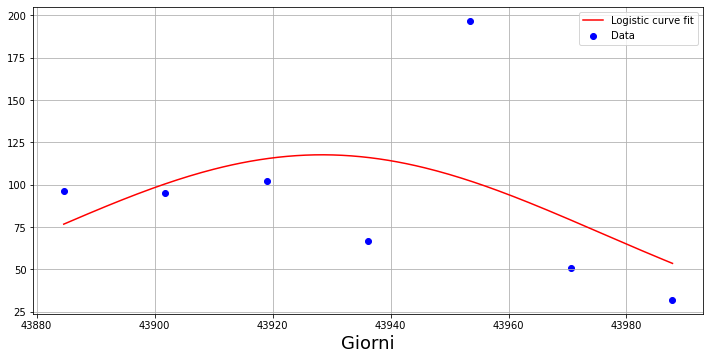

162.7772320745022 81.70660687670632 43985.54149772644
0.23785456668372013


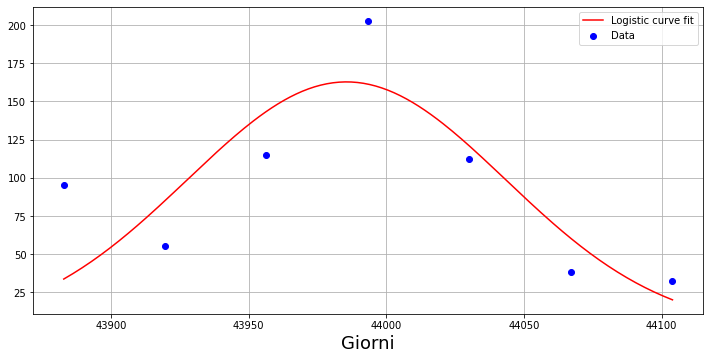

390.4193000045239 10.505648006382625 43972.34058744502
5.183059138024949


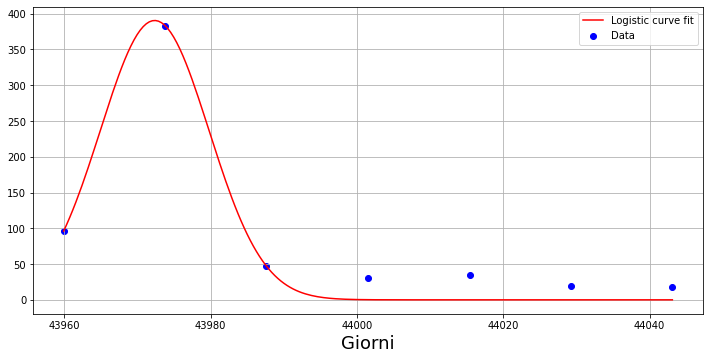

117.84410796349403 66.74102471031294 43983.627169305655
0.5226764391895011


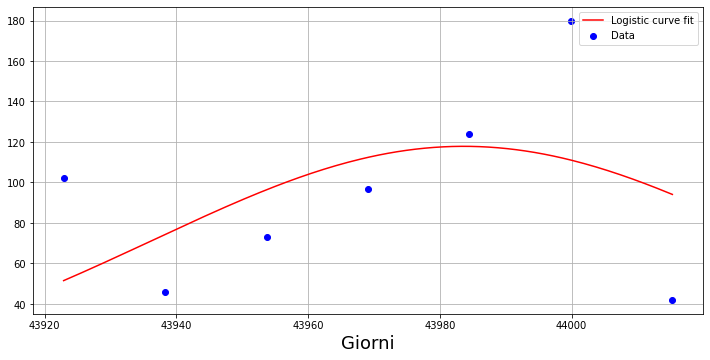

191.06358537601471 28.192588347712455 43916.938556912384
0.5345740354884063


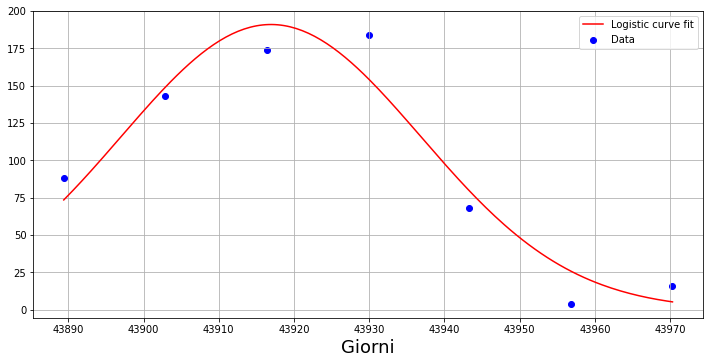

149.33458937936814 65.87386957863069 43888.87990248884
0.8201725606085606


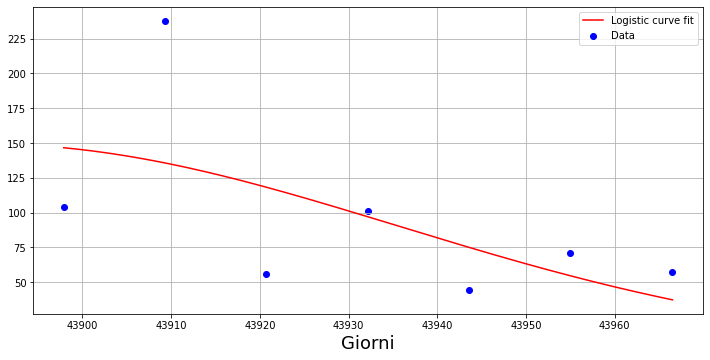

142.75953466165146 23.22380664403672 43961.04206346707
3.4023342811447415


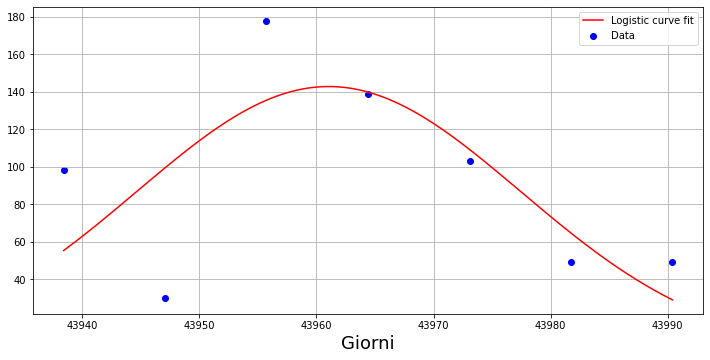

269.72972809348533 15.352146753766874 43987.84678576903
10.353532668322611


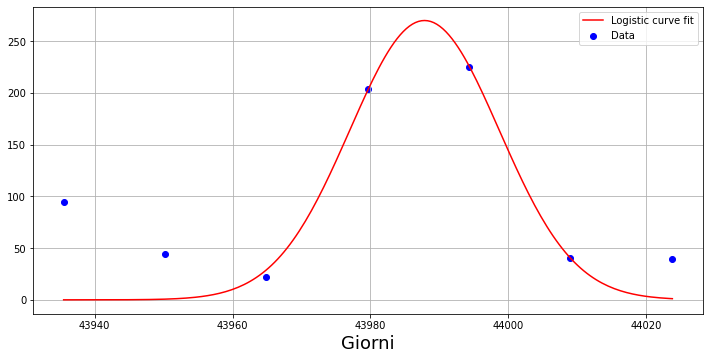

232.57789816898875 10.498834771891659 43916.55662970873
14.777807005350535


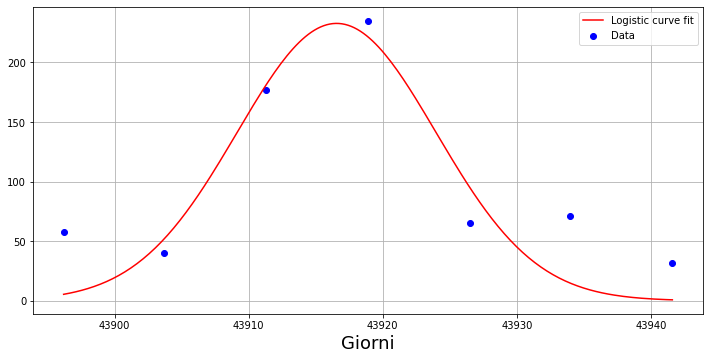

224.43218434746197 15.711385165199934 43924.703670085626
0.8533024644545939


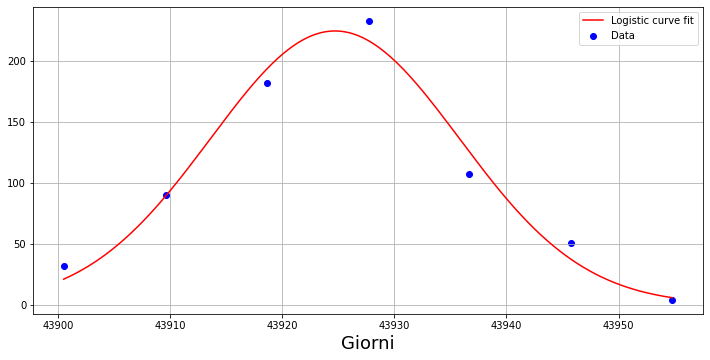

267.01161035234963 13.44737107792975 43916.35969461032
6.939921563277309


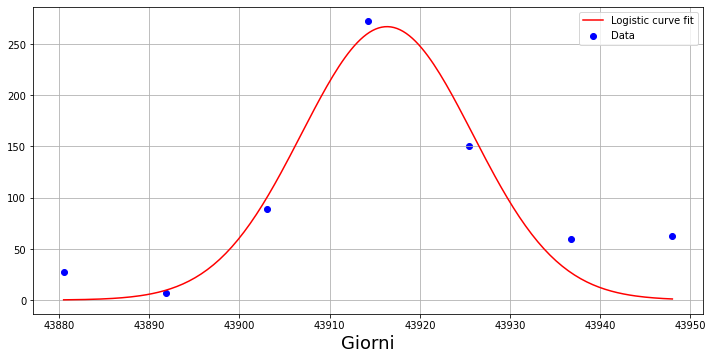

361.2322135261648 10.175970262521 43947.4739512334
24.015906281864503


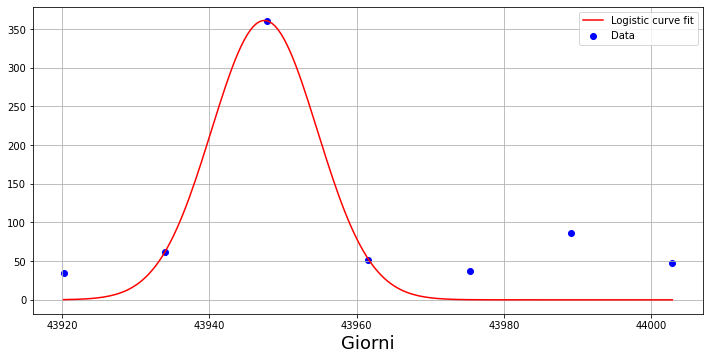

127.32829481024497 34.280561225531244 43980.5526938191
5.526212970144294


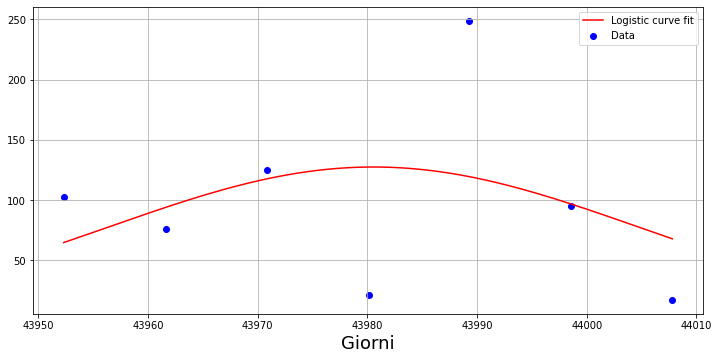

337.94021131534316 12.916577254533012 43991.199536226995
19.737955637006408


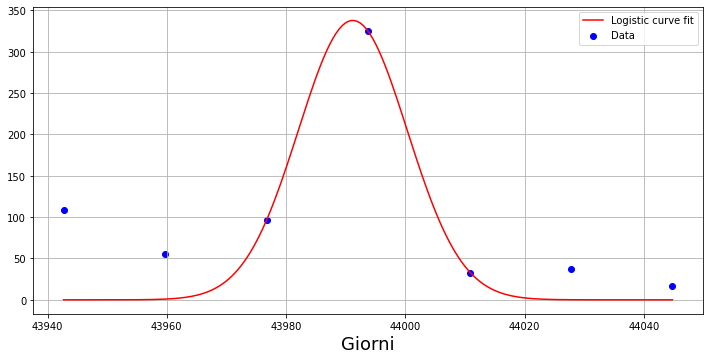

139.12941444772358 67.81262278572514 43911.94723646824
0.7248084077892765


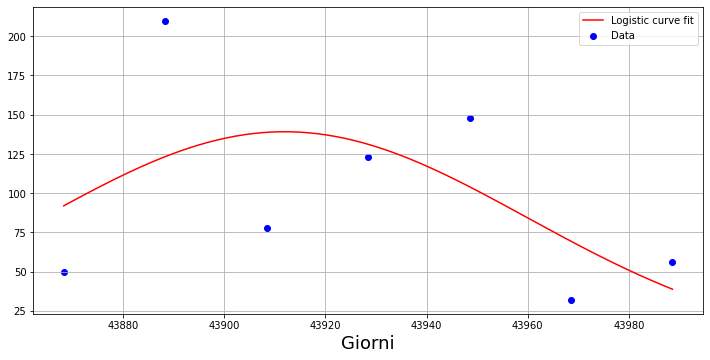

357.0387592300567 7.004949968923184 43955.53651377012
102.73918895422605


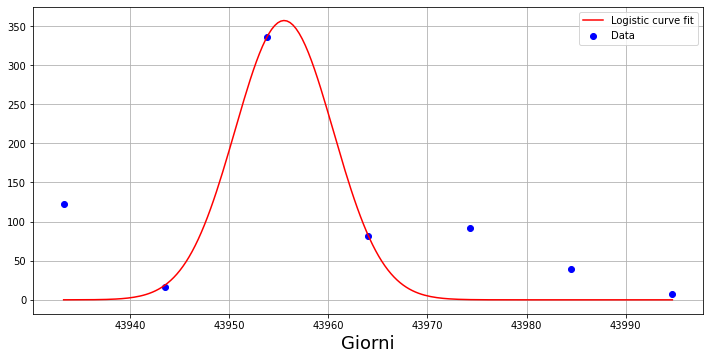

193.56940409817548 22.14133018536778 43969.57625464744
11.49133472530308


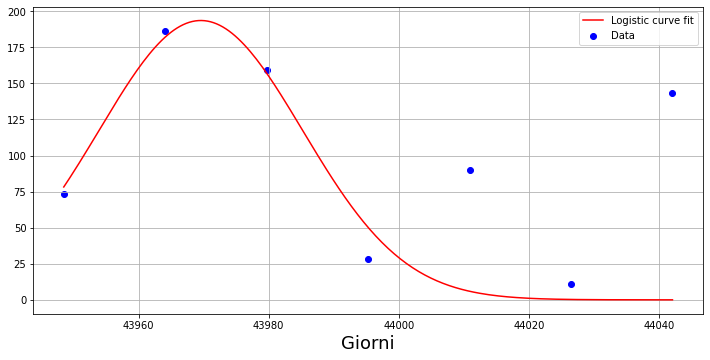

202.53472420069 28.465480740129493 43832.04455558729
11.235420637113302


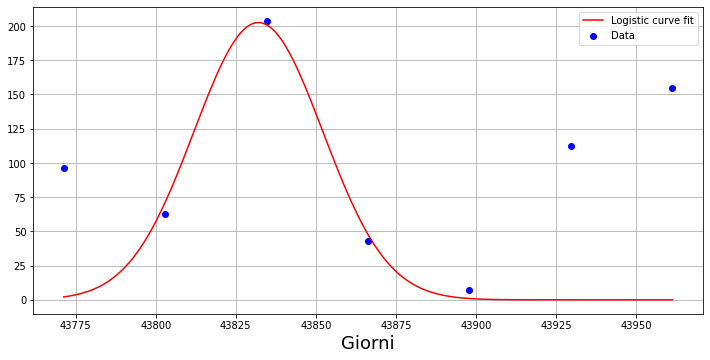

197.18765636290428 87.80351738559534 43862.8639189354
0.13063395068316597


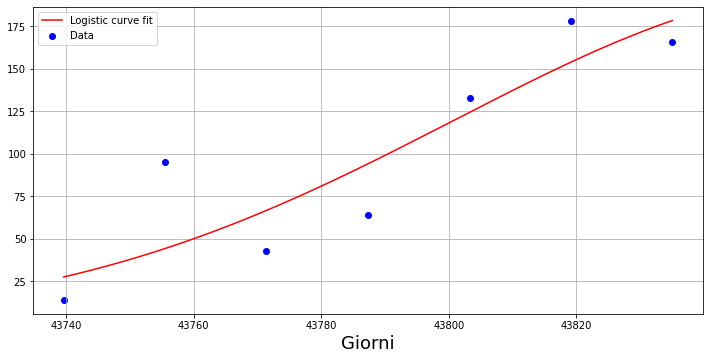

173.87817443979725 55.01576401032149 43700.1115670751
0.5979736720657487


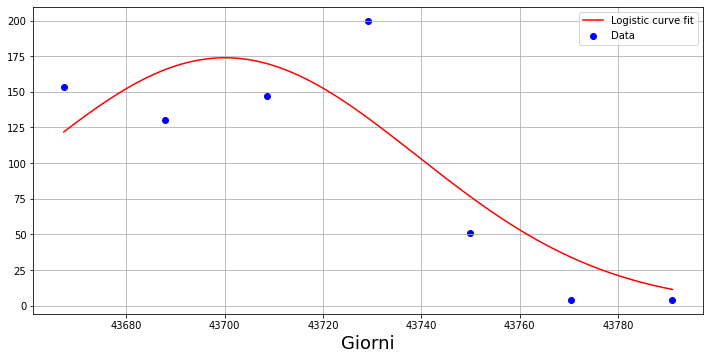

165.21198524061927 61.845761392321585 43655.145854729686
0.1380244040566094


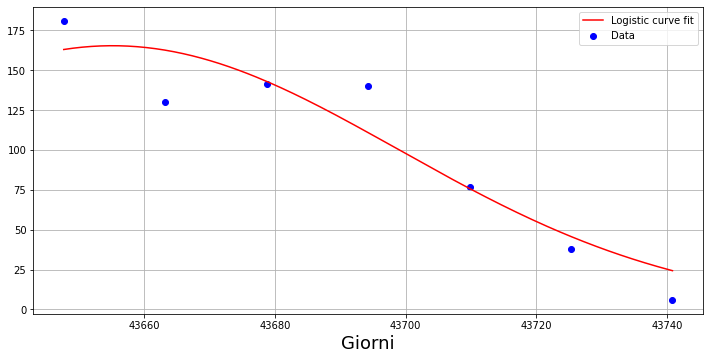

158.29387974006372 25.689390151441295 43658.32926426118
0.6555554032945538


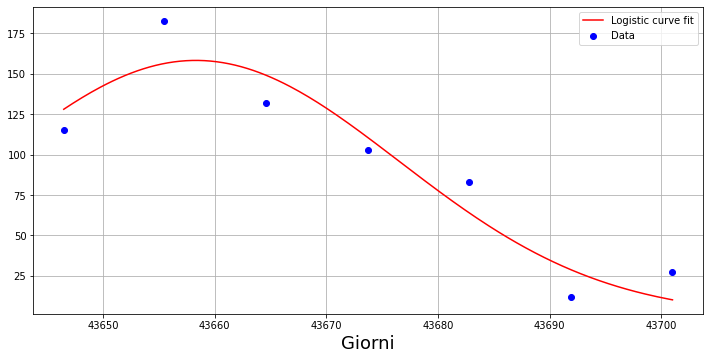

187.82721014972557 32.43497062529749 43709.60145939665
0.6464551170327011


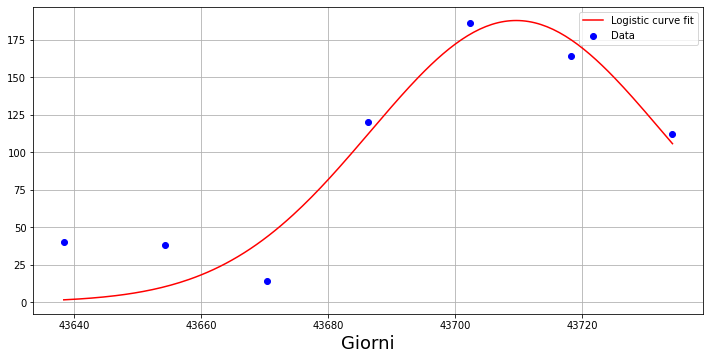

151.23159443365836 18.60082295746979 43740.21162783096
3.635936128797732


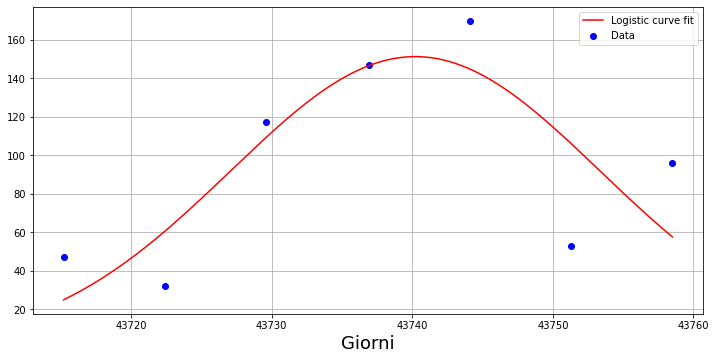

149.6378154603039 86.89960628567775 43643.263209127865
0.05577834345587335


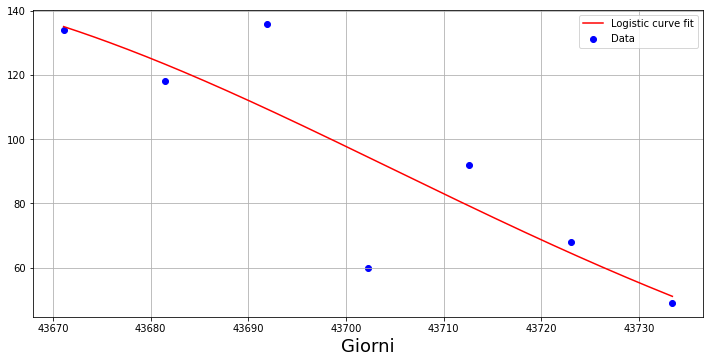

147.1257202658687 26.425333447763638 43696.43132907615
2.032995071015455


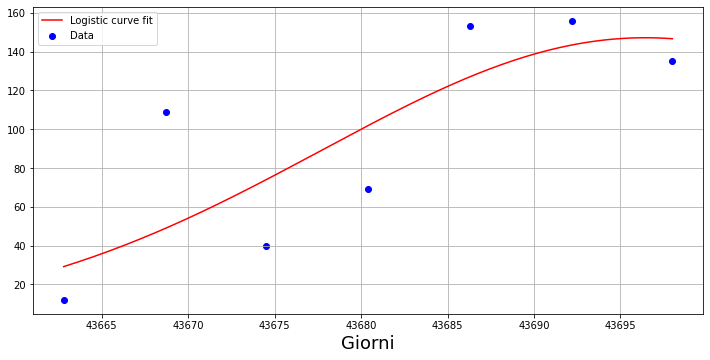

115.02563679921472 57.65363780269291 43699.78379410346
0.628319779188309


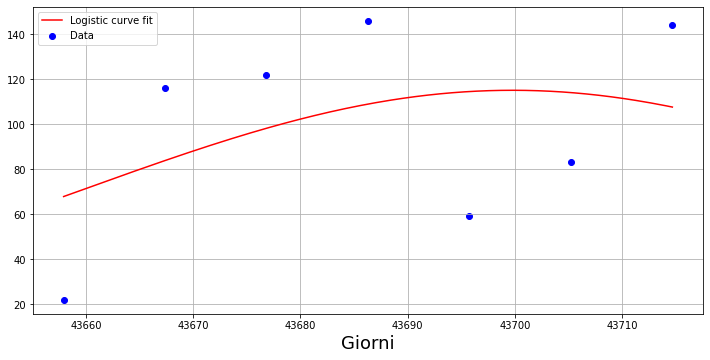

174.1515377096909 119.16434423242778 43702.24874698805
0.14125488100733288


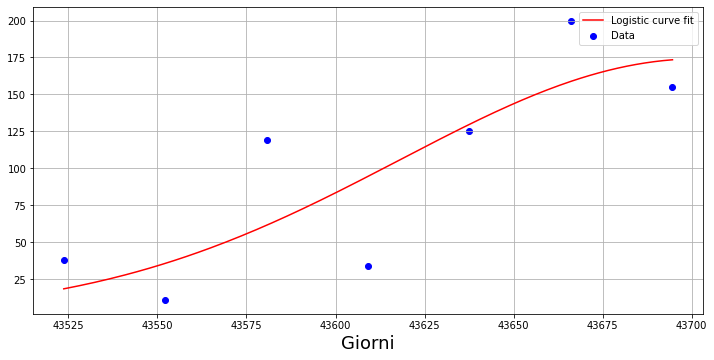

498.498196021213 12.340775296962079 43682.50453656569
13.409523707790456


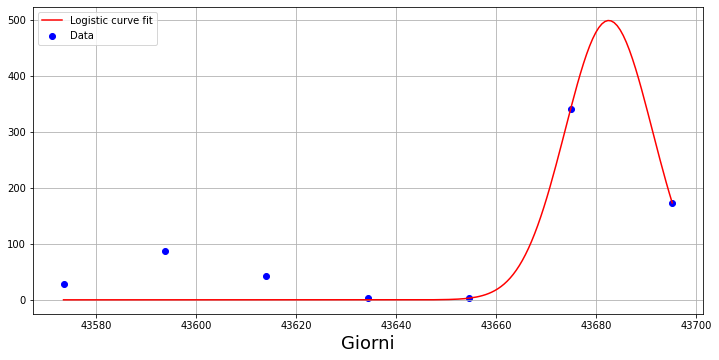

149.02229668150468 47.459418605170924 43644.516682216396
0.7338940723848439


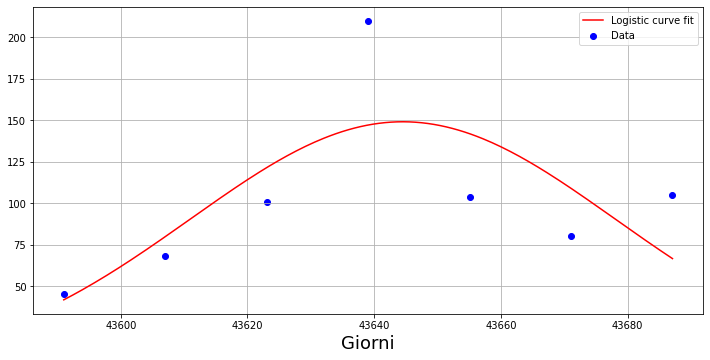

199.3300622999172 14.616003501856948 43654.69002258305
6.719820492811084


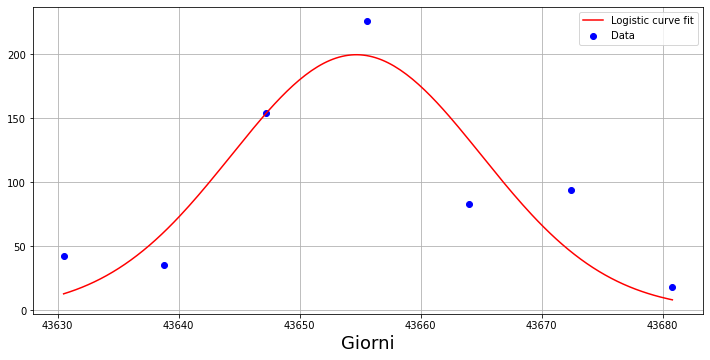

336.63457609420357 8.765785139394316 43676.11373718141
64.31987535596208


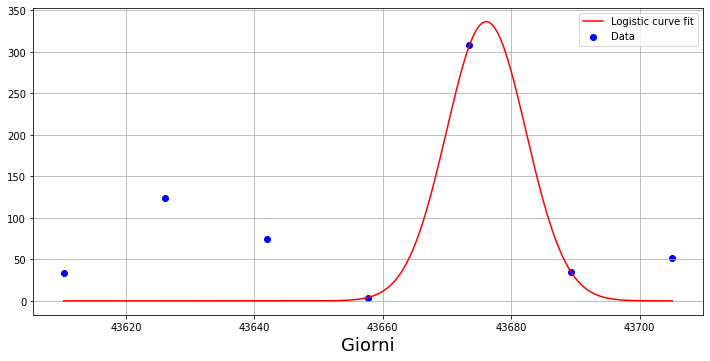

257.0815722057427 35.642003661573156 43532.22216453714
0.5964342919387616


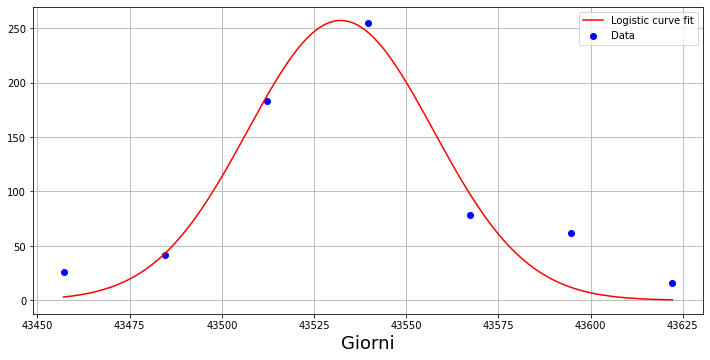

118.24198079140808 89.02816734122521 43561.33923520815
0.08185352241773838


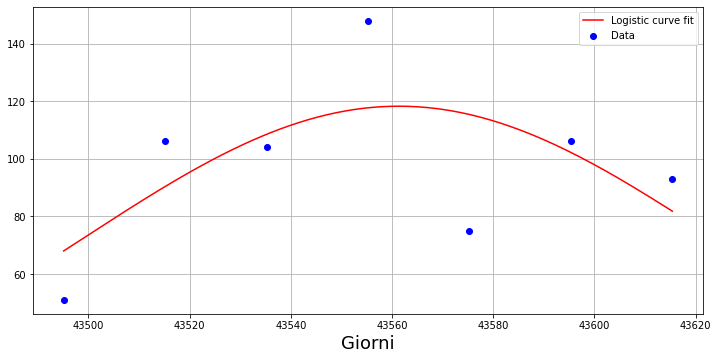

188.1432240404164 21.271526325689628 43605.28006549418
3.6789850353677496


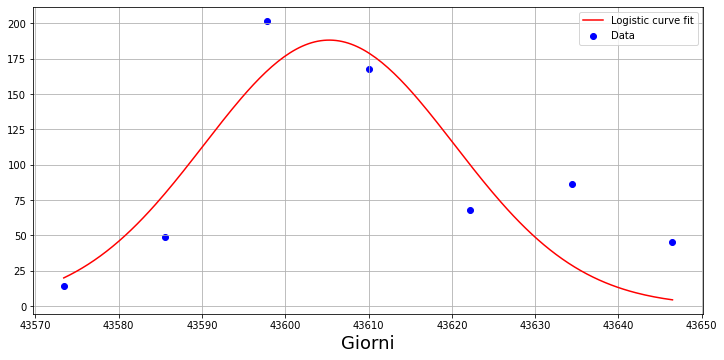

122.99498002275419 48.59900462720349 43605.27454088688
1.0238950213359859


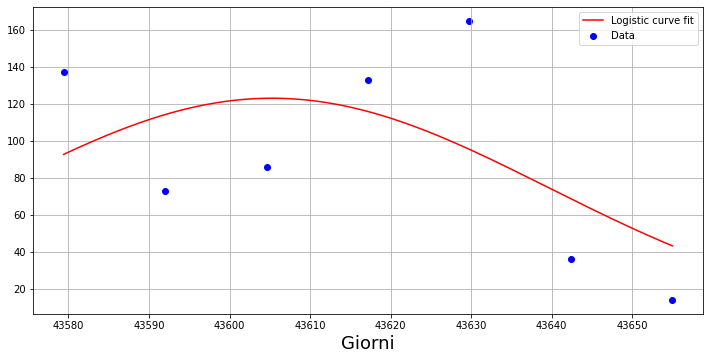

115.18400871376699 44.49427563017117 43545.640760203554
1.1353230489078183


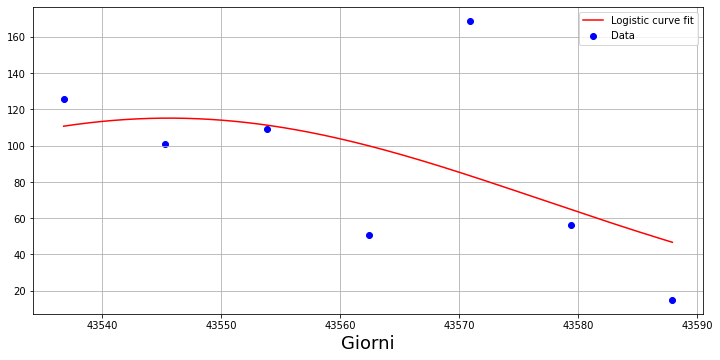

106.45616144337392 74.89066408817877 43595.566555492886
1.7094227437229694


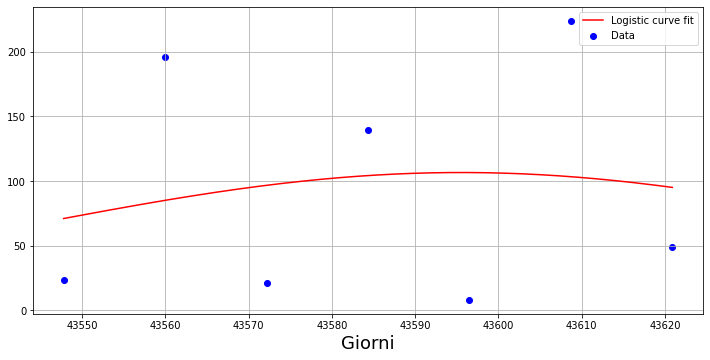

323.9849430007972 18.909934892027366 43636.84945831091
9.398886005707734


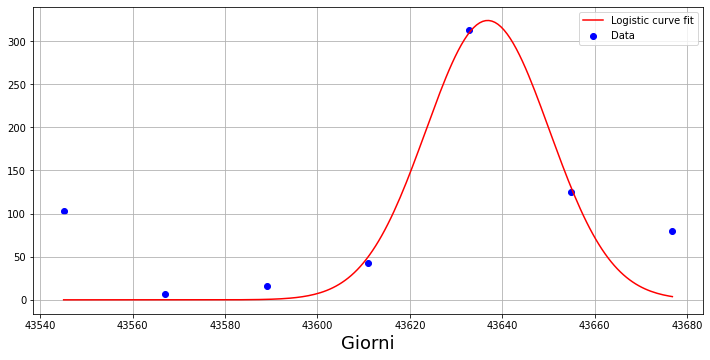

322.97343613030847 14.104296435143064 43656.55373953511
19.670157981441854


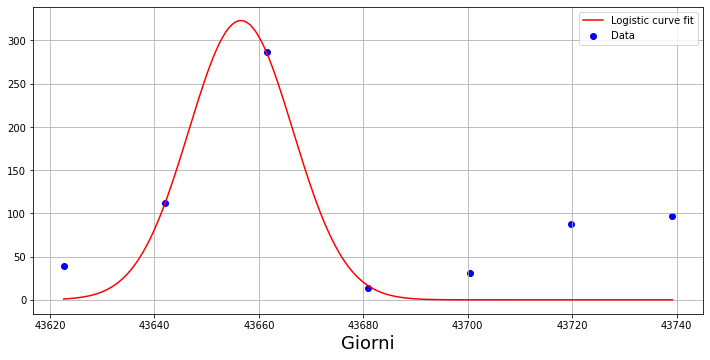

222.6568411529182 13.261557110275499 43640.561670152536
20.545770955872037


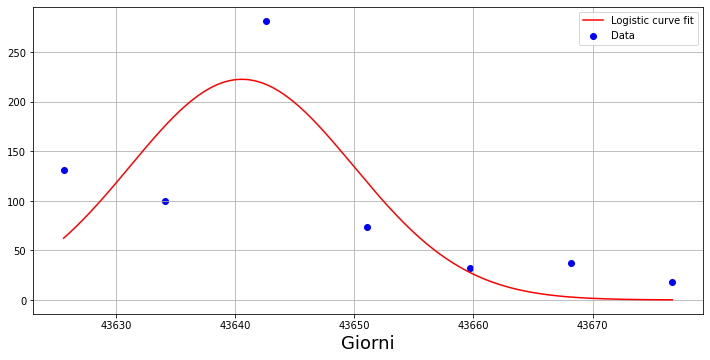

316.4831385207061 7.116646735442279 43597.8314344457
63.16302405187813


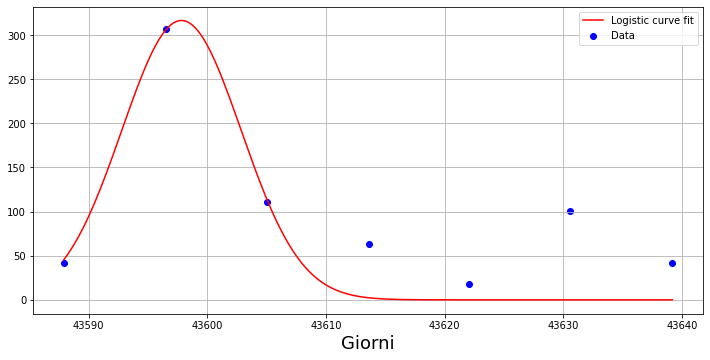

123.53236430532407 28.022967392891502 43621.88060168481
3.2451466700228933


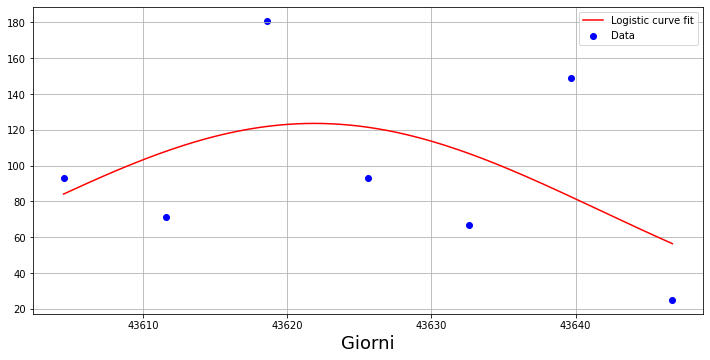

158.80829138420975 20.55921526752934 43645.899211948476
19.636056812064375


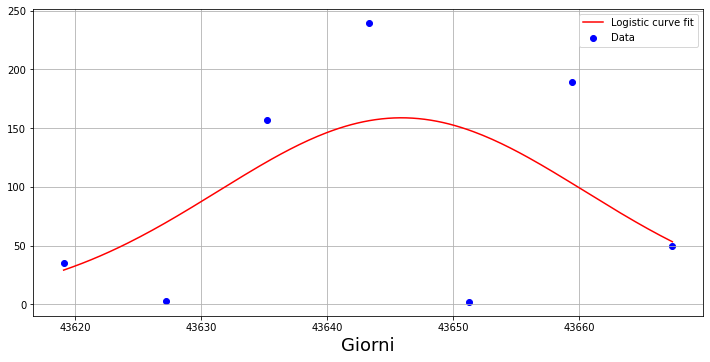

287.773369681744 51.77744659071367 43869.91059407335
0.6881893261719465


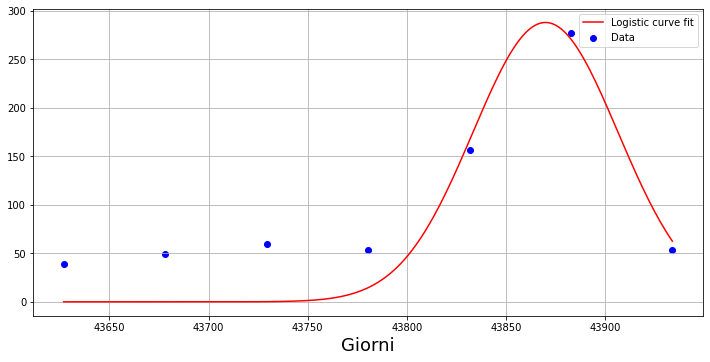

290.08047614168674 14.038116826017783 43906.79898960923
15.50876085378178


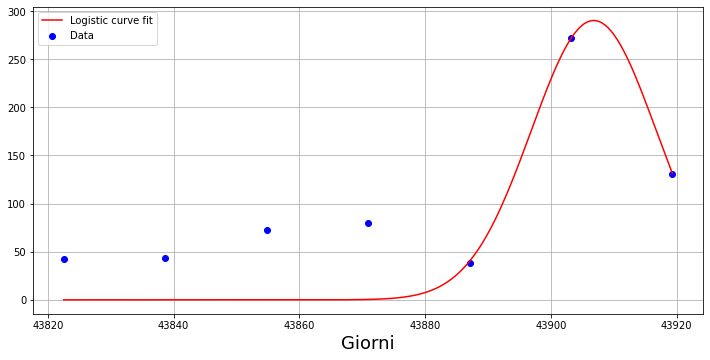

163.893426595291 86.20269762707838 44061.692429773226
0.18248785934610298


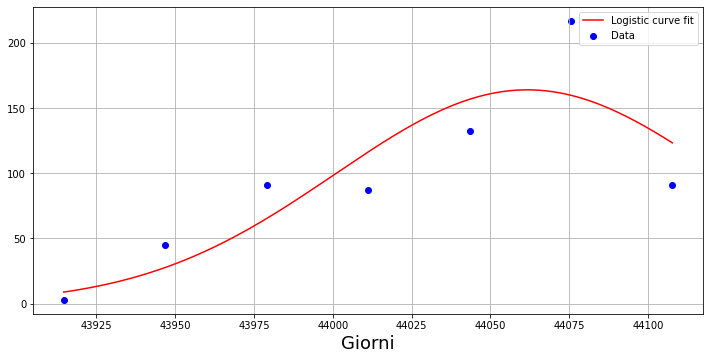

232.72780240246226 22.279079322610155 44053.36413307042
9.496567353636516


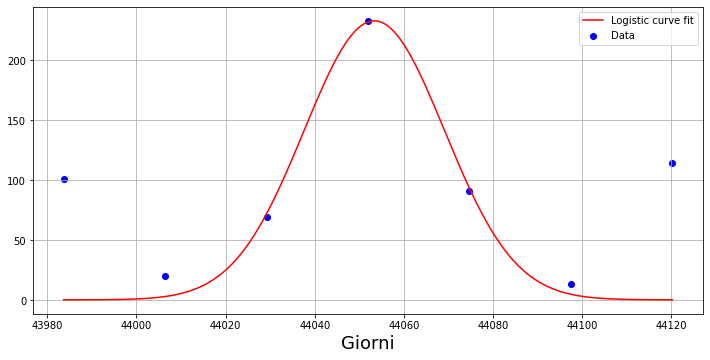

125.51003577075466 107.97520401368745 44145.31612597871
0.05013120569568369


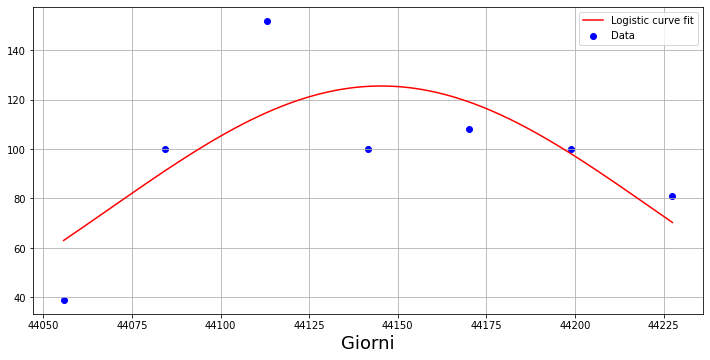

143.77377943489864 119.13340384958161 44337.83901692802
0.1736943917869798


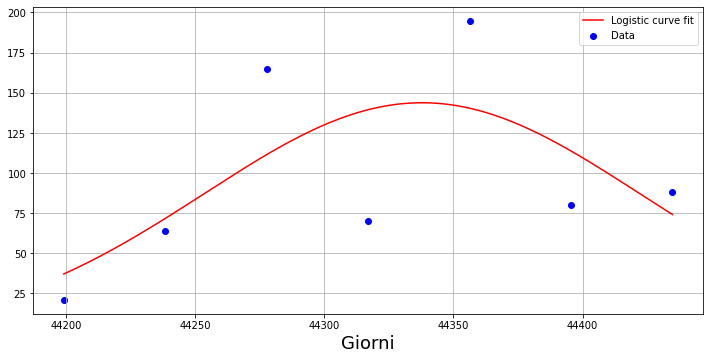

155.6379915798474 29.96252594003112 44348.42604863803
2.3503817777661493


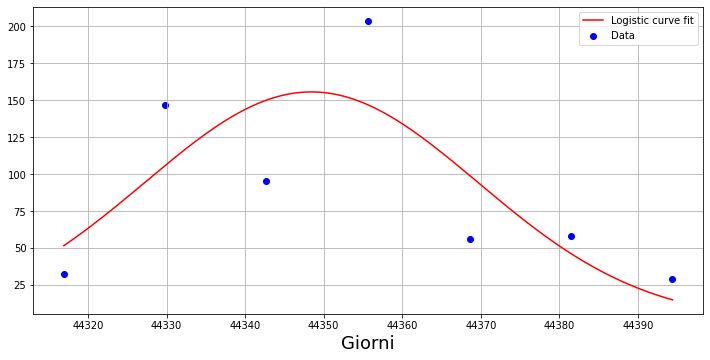

190.04978053756545 47.52807859620553 44518.30438646174
0.4701550344677724


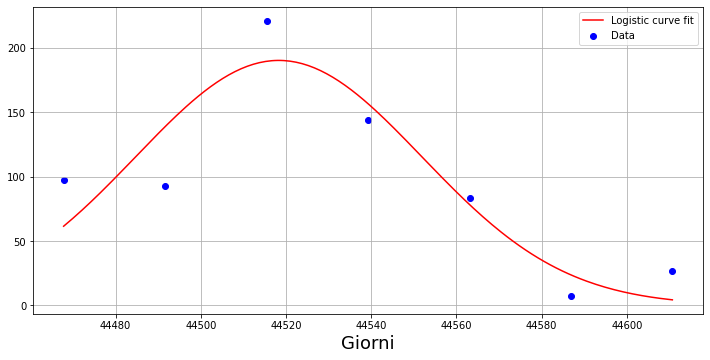

204.854757207449 65.29858259857397 44609.65766108633
0.1828090080002224


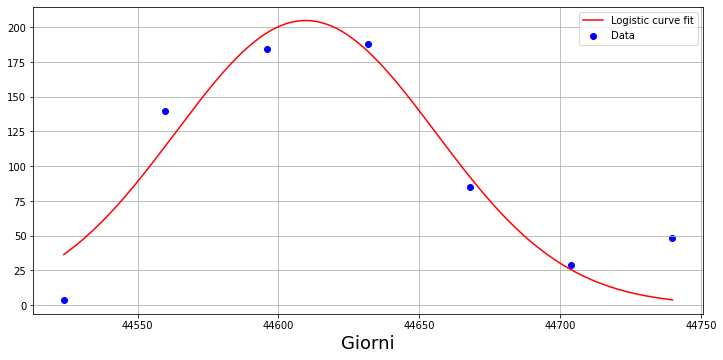

163.6758227542781 55.6384774696751 44546.07843852016
0.14563075492453104


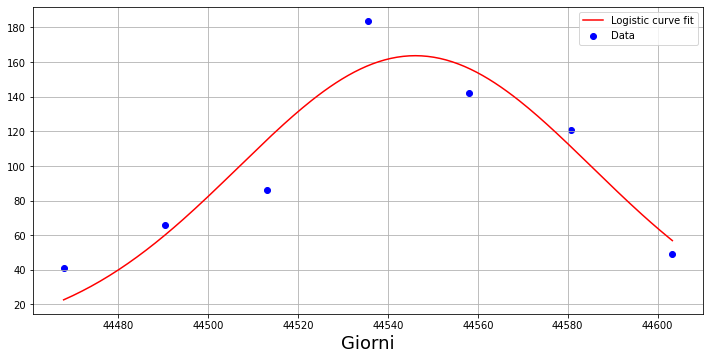

122.9221010570295 114.08824446855942 44550.73888482579
0.07739580519106785


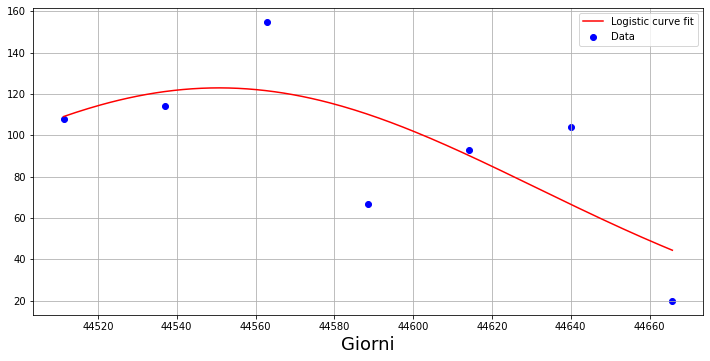

212.34669174889638 31.017506985096233 44559.4020816643
1.011301837605784


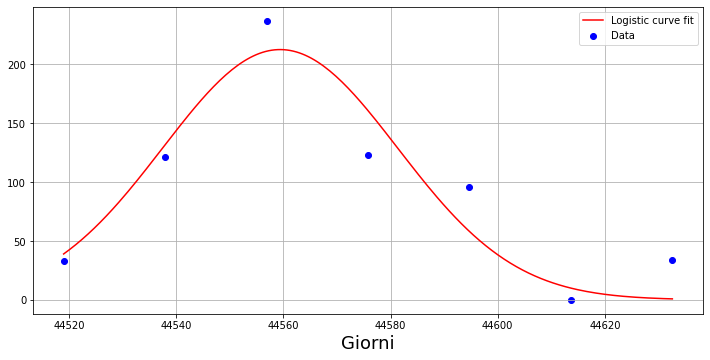

261.24766303977776 43.23831156647232 44661.21819114412
0.5579095789528711


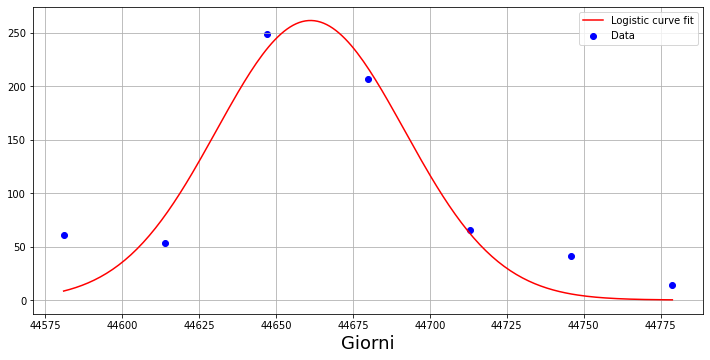

136.52409644136583 60.2378174575825 44659.83316659931
0.3608053600984983


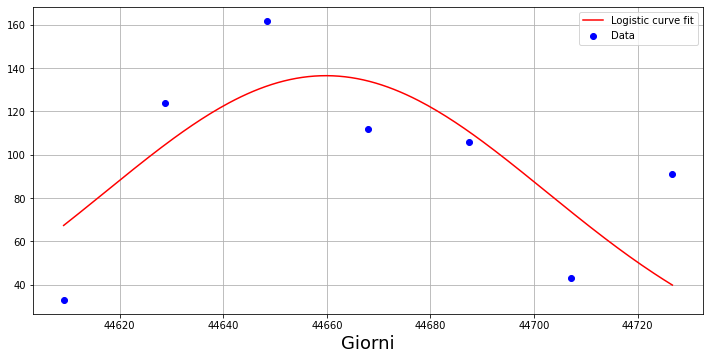

146.80334674952053 42.02900659668278 44662.641367236254
0.5179592636908854


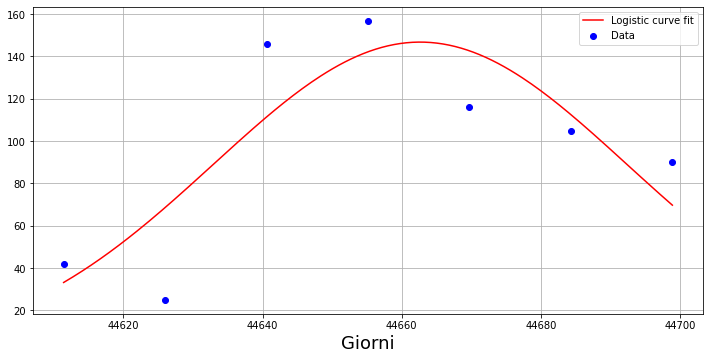

309.41359910314094 13.959652758276832 44687.19850631181
19.517770322878775


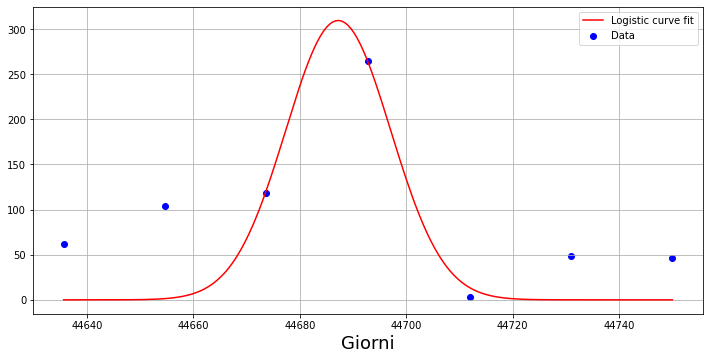

209.22003183684242 45.28464307753337 44712.53350694653
0.4630498668368457


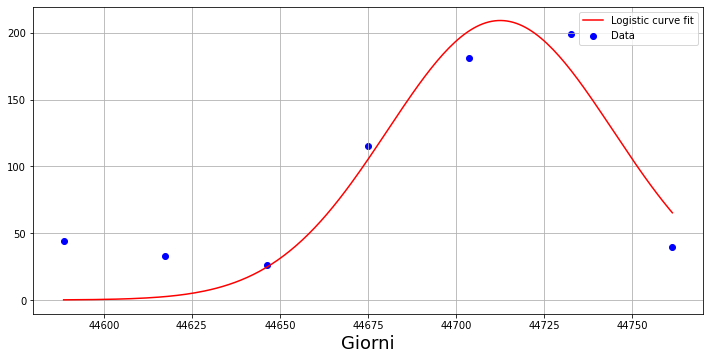

251.6262085570632 16.58792886576345 44675.380887293744
19.914174649035708


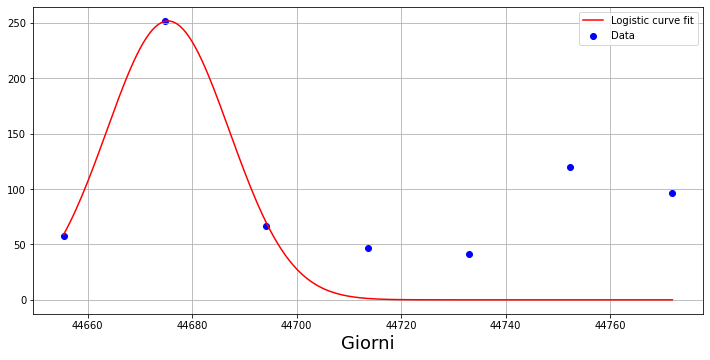

248.0307270823054 28.039603070436215 44669.875017366816
4.655730883920688


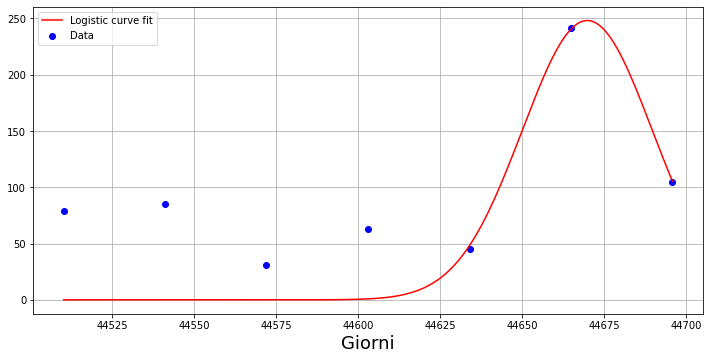

221.23241756445267 28.716468193493757 44558.04905517914
0.4657679236254018


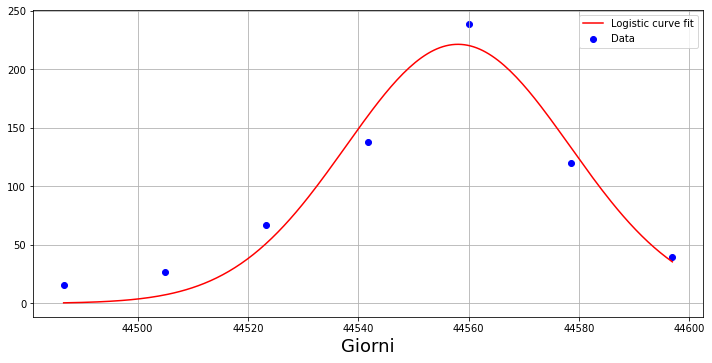

111.99051683728004 83.73244096441597 44504.38237281906
0.2393757870516374


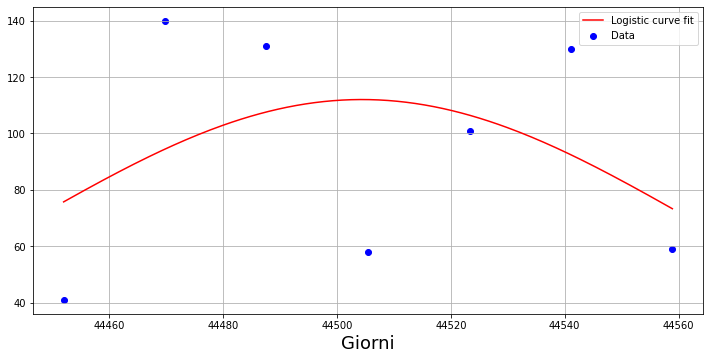

207.6235817410905 44.803675488896396 44399.99024241666
1.4062777009231933


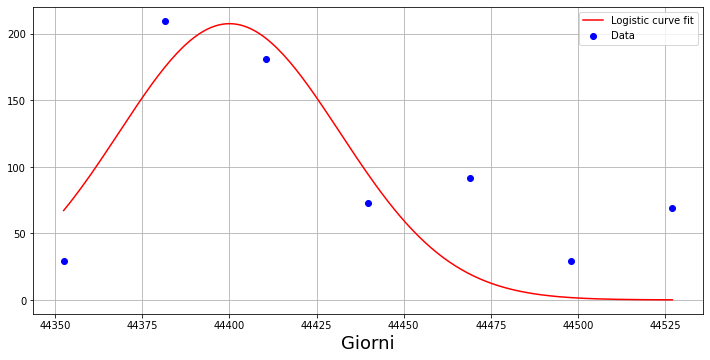

222.73428914132947 48.18846108789325 44359.060874569965
0.18889796939174425


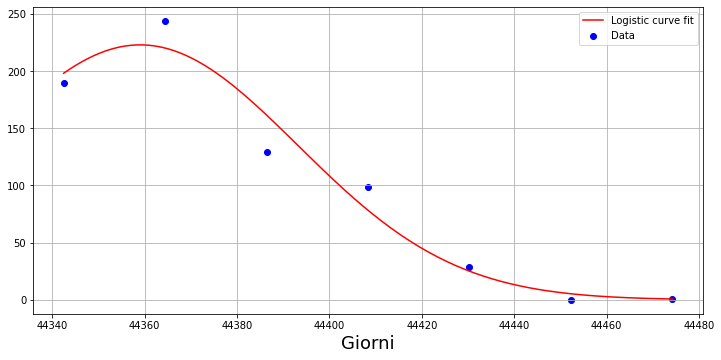

262.13136592691114 17.664181564219863 44371.5471436279
1.6510380928720032


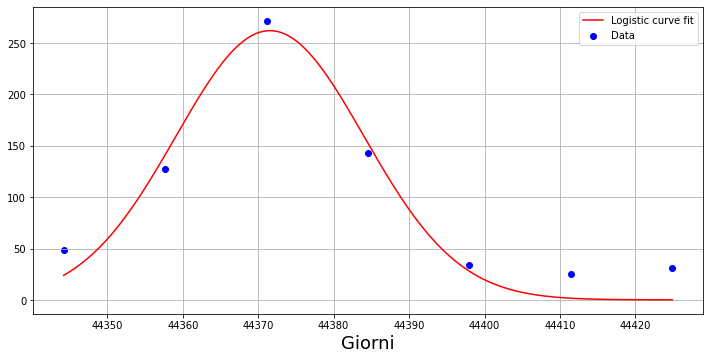

168.057645514167 28.61083295520051 44655.67472204336
2.626482740058009


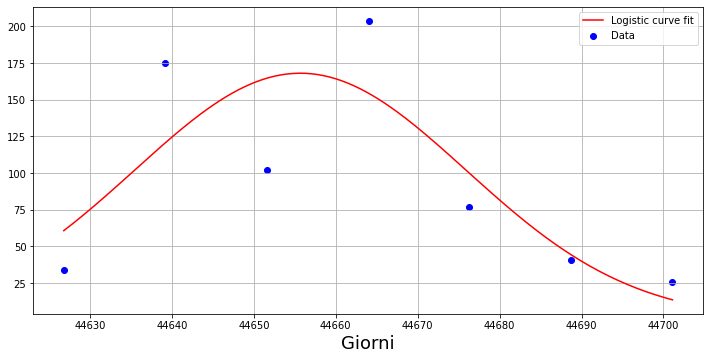

143.21006738595975 40.033707425625025 44670.78141861935
0.9573708222787


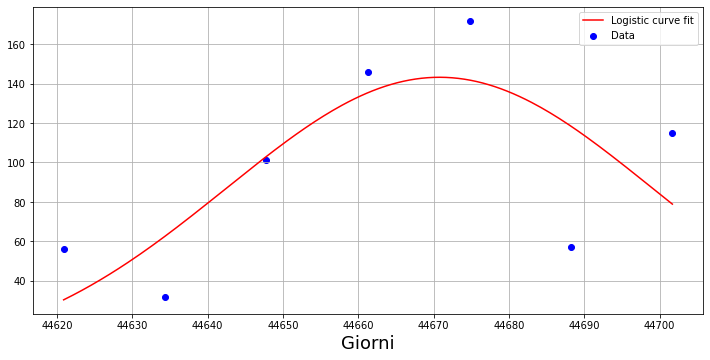

194.9825286401365 46.9985651748811 44478.24580031903
1.783744435540314


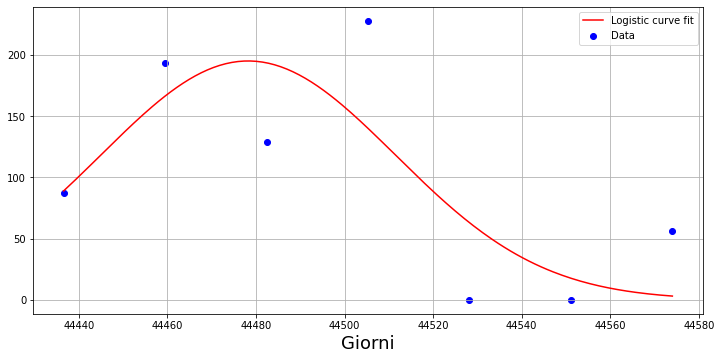

285.8450605832283 15.772116798938956 44501.5888657336
5.530291618400744


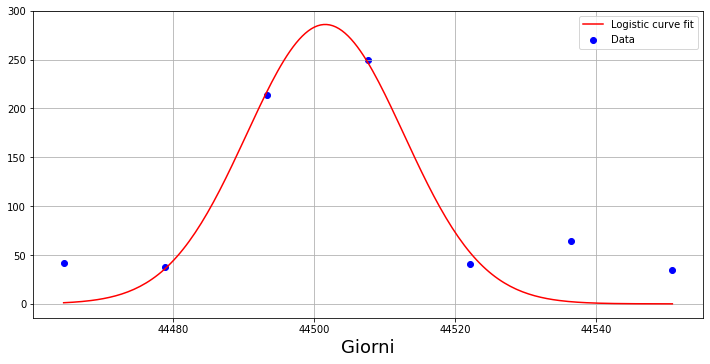

153.9512508946751 43.153632147946375 44504.93023282735
2.177660425109183


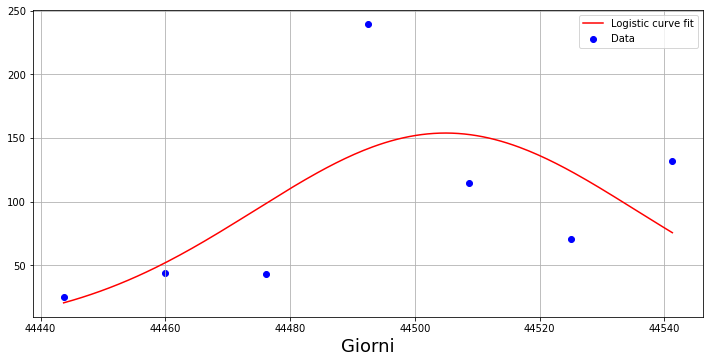

224.30319508862493 17.28179960119991 44560.84043108689
14.280290026626824


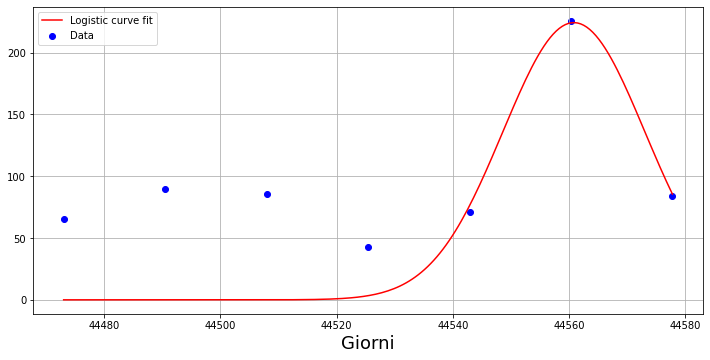

281.8094122557302 10.664072705996135 44530.60784103875
38.40041713202133


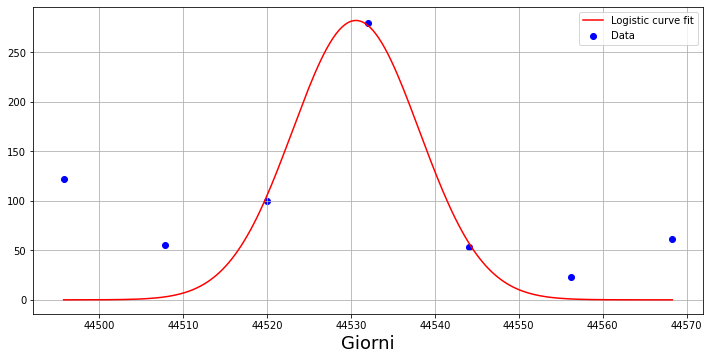

175.79246758558997 -10.235272909675293 44540.72315944268
8.880370264632592


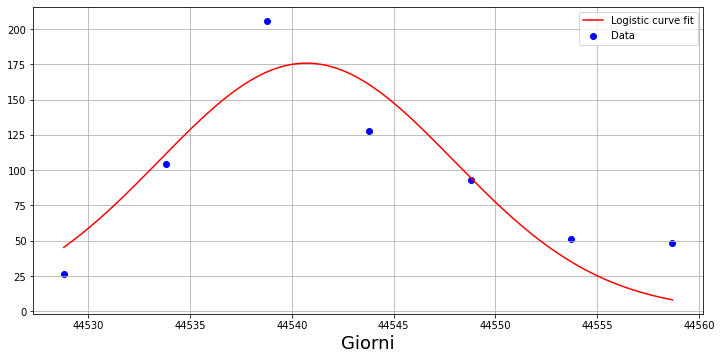

343.8086296243468 13.728650237713312 44569.75736104379
1.5454527660513997


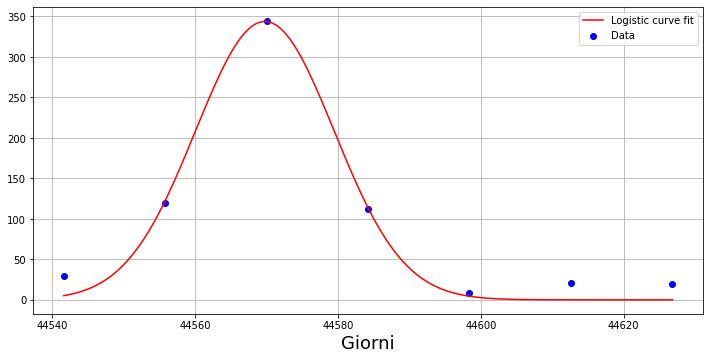

183.9590268295911 31.90834440990814 44636.870147853595
1.3416189341610671


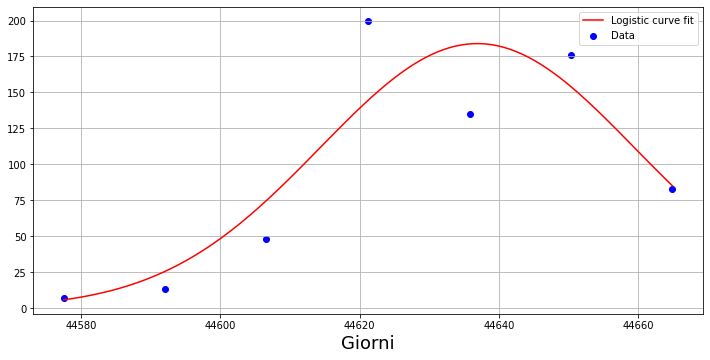

135.1140561078719 51.81502459944904 44580.47336651094
1.0099230849558234


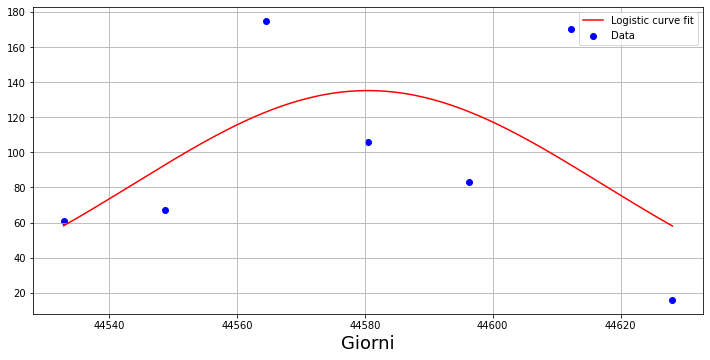

134.02795300107593 42.57865210568547 44602.24502109871
0.8025674408584882


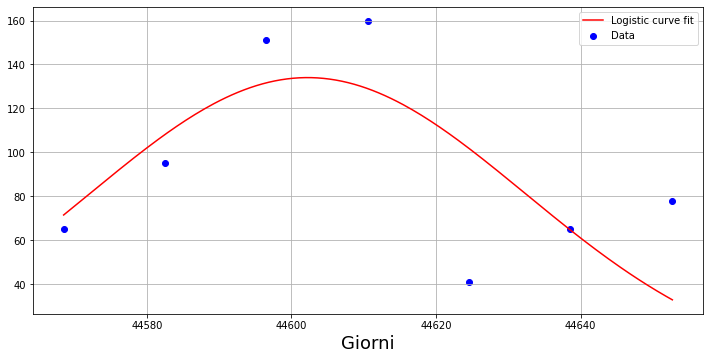

171.65483697976265 21.849747045905737 44640.53613686918
2.3802898063964264


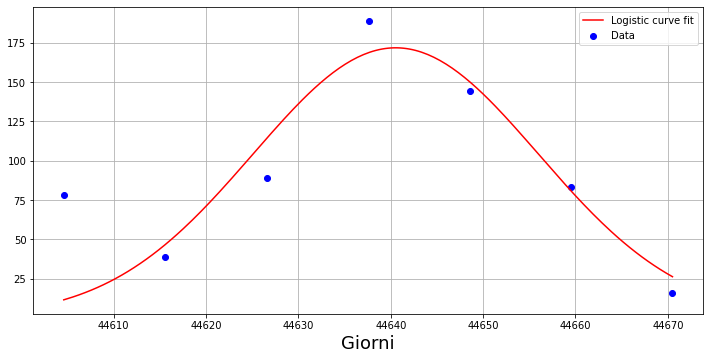

377.3464278155743 8.598790962652032 44619.391400608685
44.843027268086345


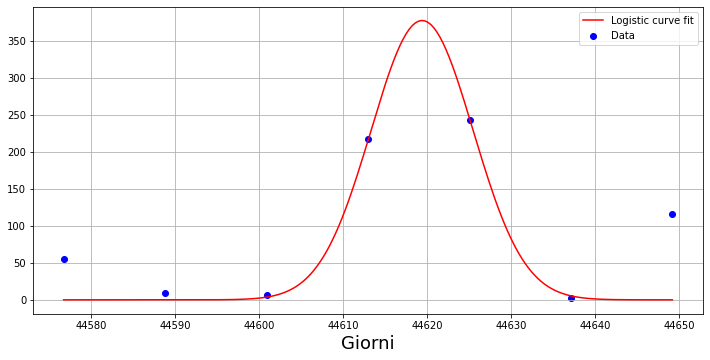

157.72843498249352 38.643152042585406 44631.05117516551
2.250849559219777


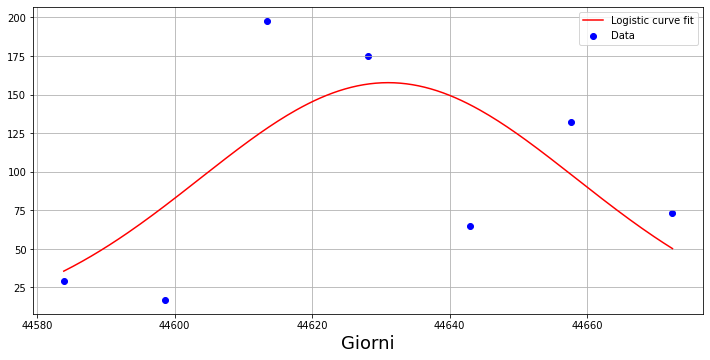

232.24534473697457 29.35133984325538 44585.45817477859
6.112935712130492


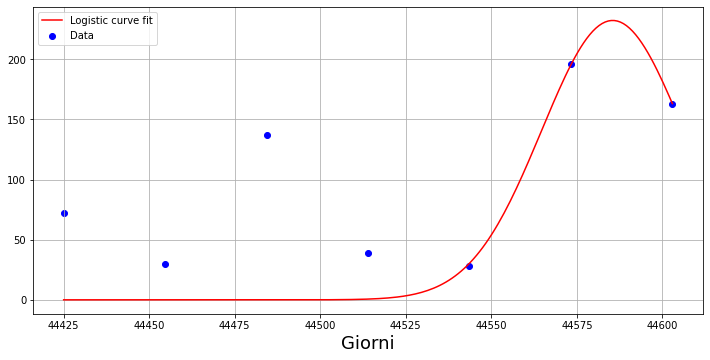

238.3560854103735 18.918165543160224 44449.17691821181
9.168117501933242


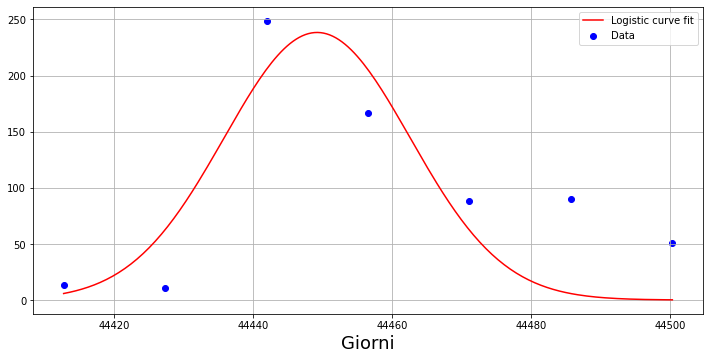

288.9830023961835 12.705920350493589 44597.996214865605
33.39738900437866


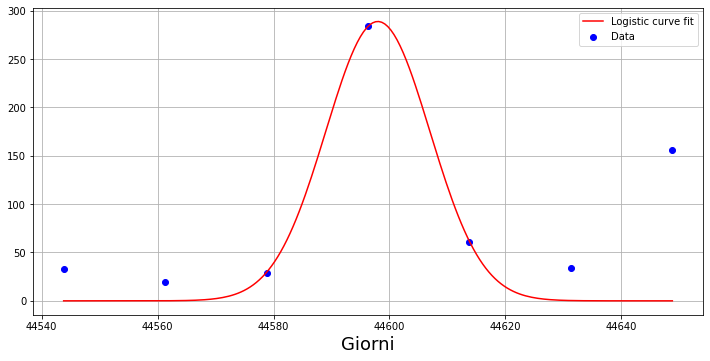

234.27907199672325 23.506337652766064 44654.55762722014
3.5804429531442574


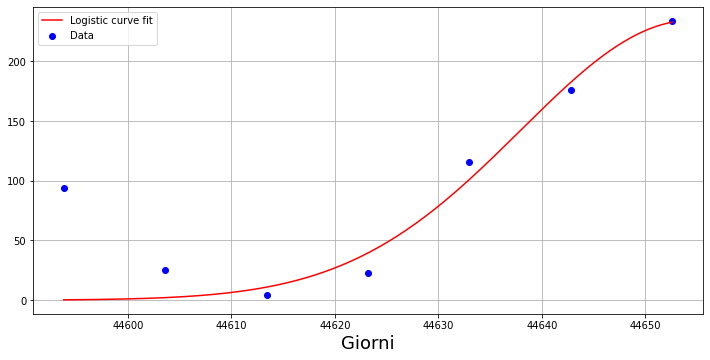

266.4835824875097 9.467590346602078 44605.94181158318
40.89723058493718


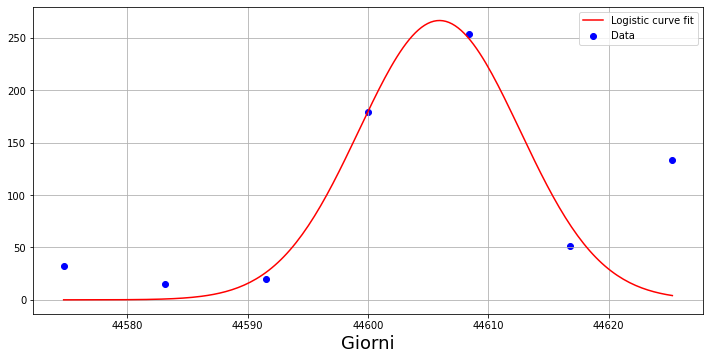

352.57884806577295 7.949505981778076 44584.31803050743
7.756931116797565


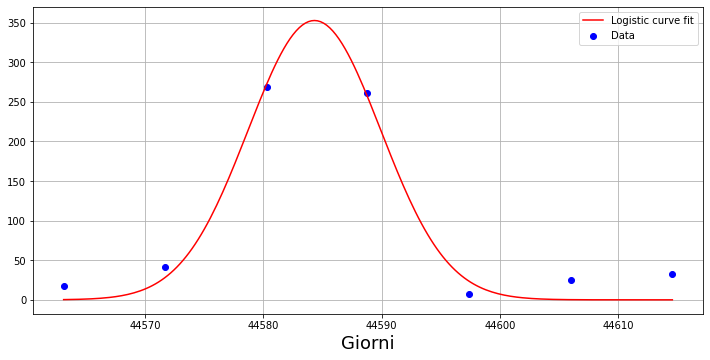

139.11455461038096 60.965878017320364 44628.639496992226
0.5519333157538753


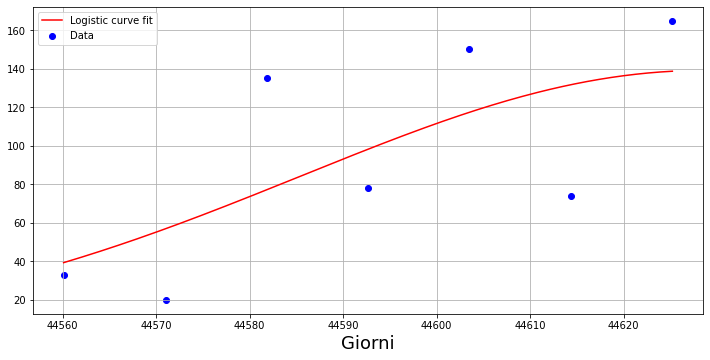

291.1714961530326 11.508926946871158 44540.01206693236
2.2507375230758946


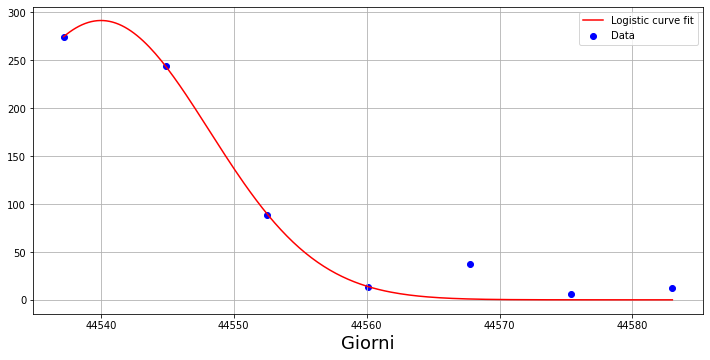

104.04440868224162 75.24301055941915 44579.69322532108
0.2764904240274746


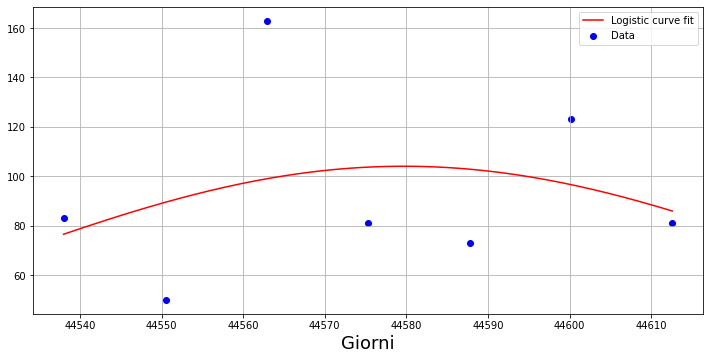

97.73872950383536 354.09150137993953 44541.44281154936
0.006433711696033009


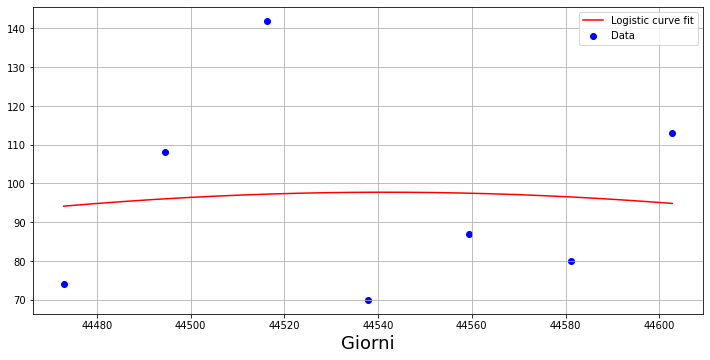

174.62413215388543 22.50102697001283 44578.71691026539
1.29385359956115


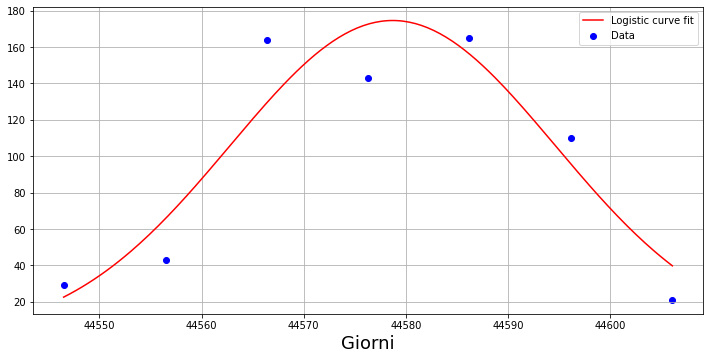

113.90689487677203 79.23980617593534 44524.47199732331
0.1814296797211202


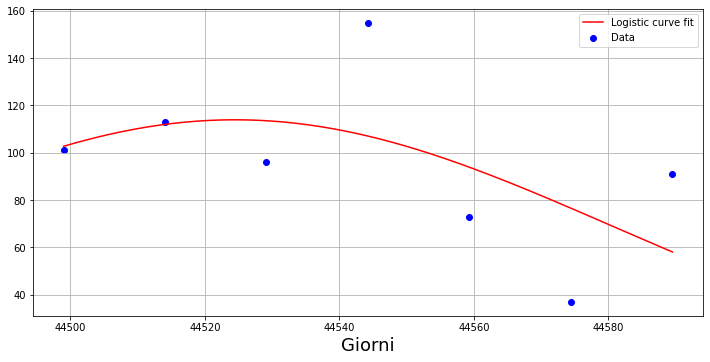

172.14578703902257 14.318780107921283 44514.436711162925
1.0040353580062895


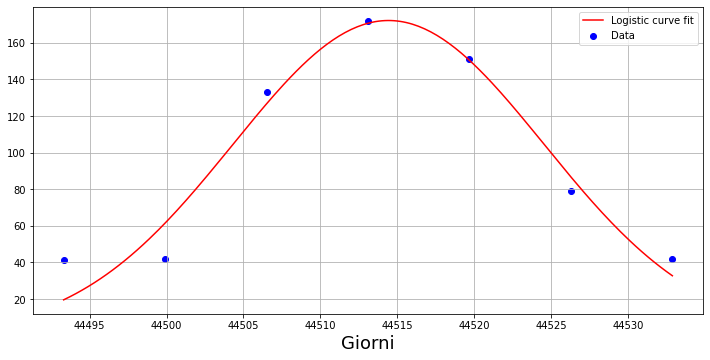

131.38278780465143 102.94395533168372 44362.63005869822
0.23163636414586214


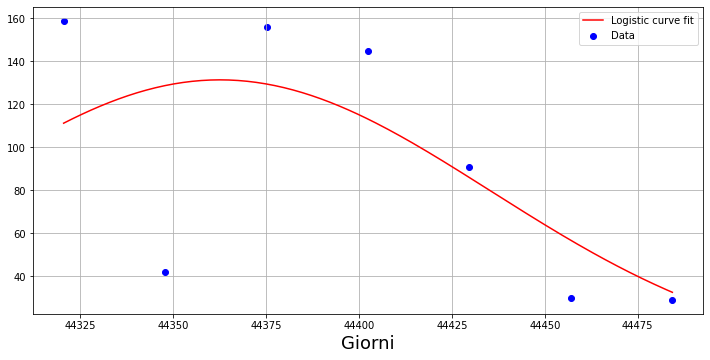

175.84854524499147 19.280335389838655 44384.99620011088
1.8732595221519688


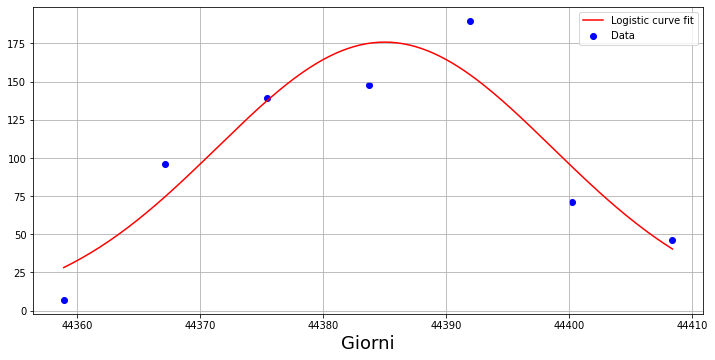

184.2495077775811 25.389701433989224 44450.94783865124
0.8491057411999667


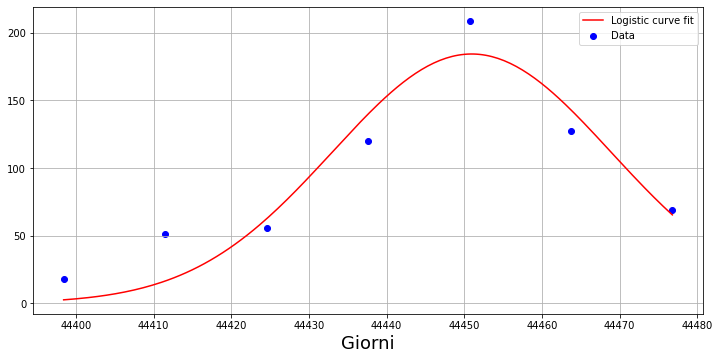

125.06119601067087 67.25598674589297 44459.505724590206
0.090914742176196


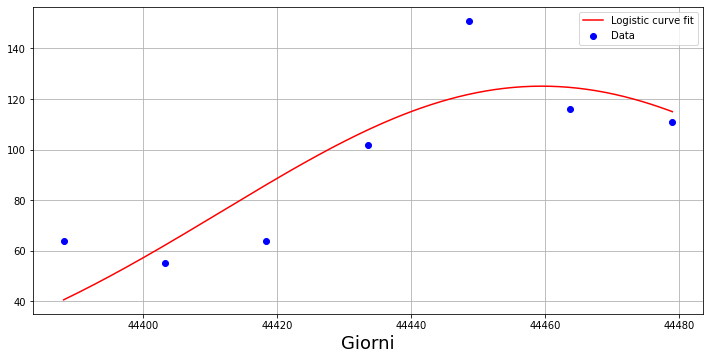

212.8485466102084 16.754671289886506 44440.96190783892
12.838330333275547


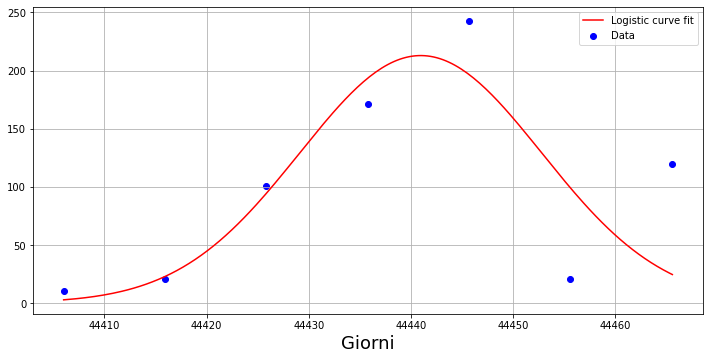

134.50055688048403 31.794460038744248 44511.531623543
2.31721568686985


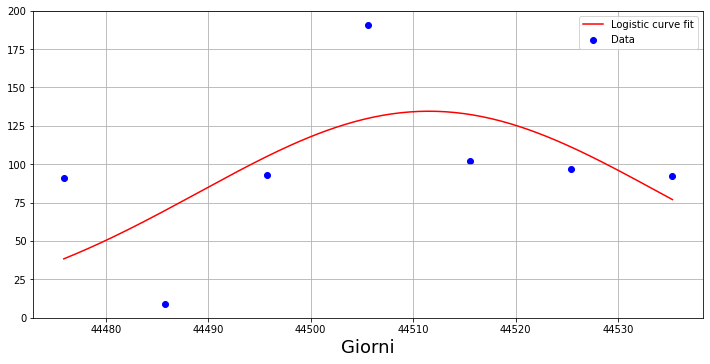

166.4453352943211 82.99348195541434 44505.287567008985
0.5587992457590537


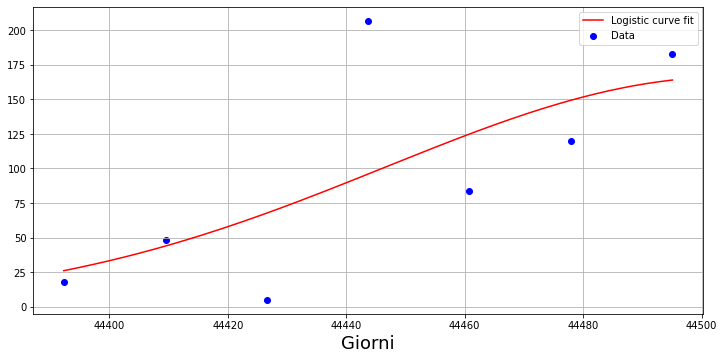

229.7836021556696 17.84706460594632 44490.9727771221
33.303054057789055


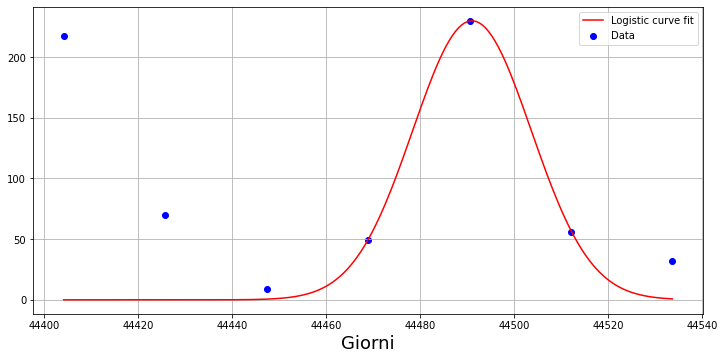

181.68309146330242 26.94178717483082 44530.09214214359
3.0019161069590043


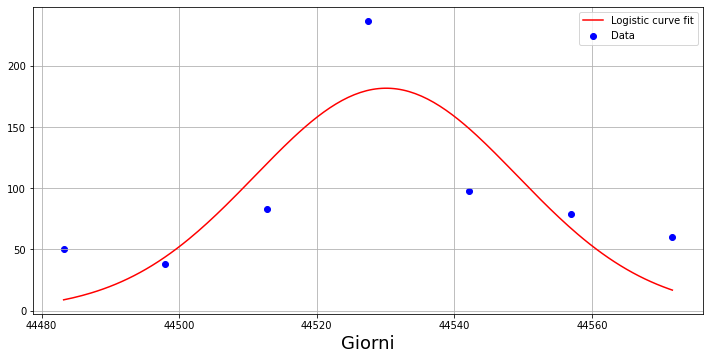

114.13920799932828 56.02823542256501 44535.59499102054
1.341564653005828


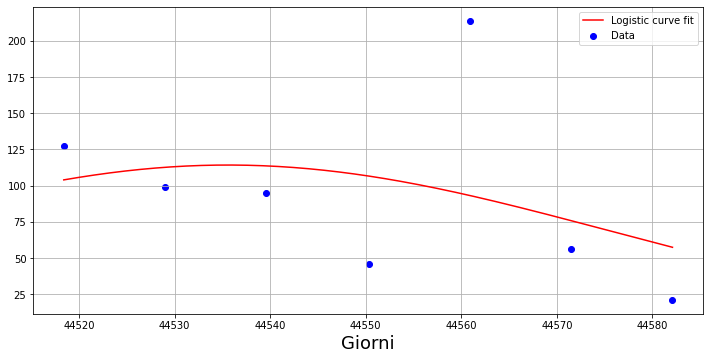

153.04382638958026 41.32350242703876 44537.6931398144
3.091716627779053


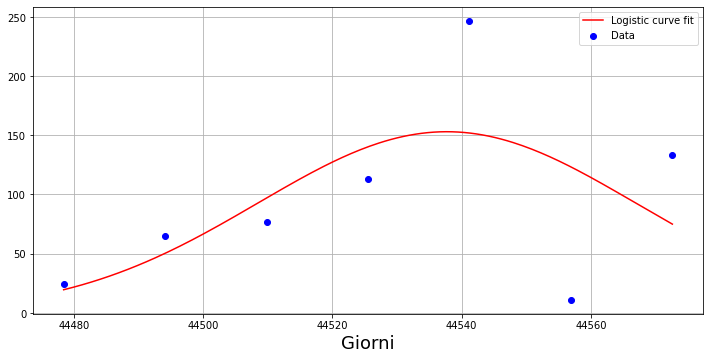

268.41115924888857 27.807121456322744 44576.12997748268
12.226008792183881


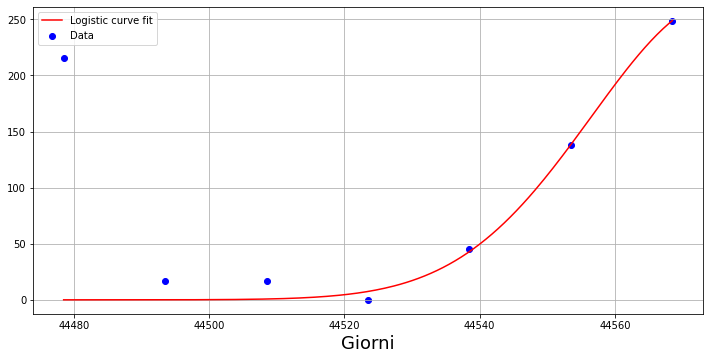

311.25490841594626 9.547890460617227 44565.28379515684
9.463107196893858


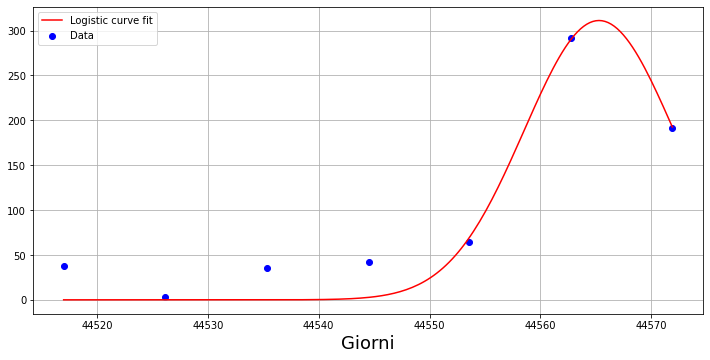

285.11521508303315 7.548903929916926 44553.91021803426
26.19961884483909


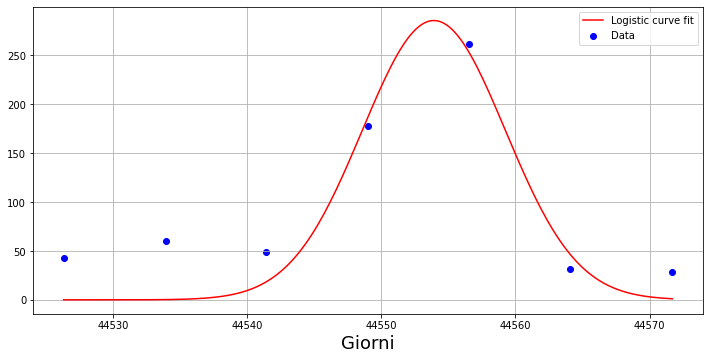

139.44143214472123 18.15367150102758 44532.7719062202
3.19613927540076


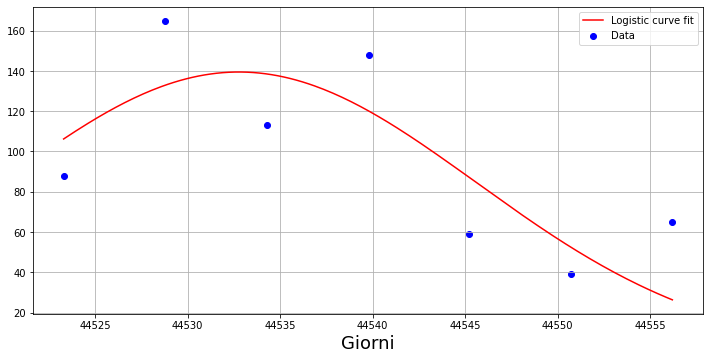

165.1717216031951 29.580673861971107 44497.397116586
2.5234864380469175


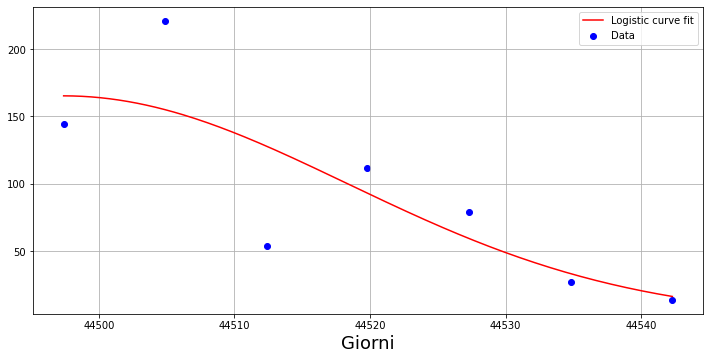

244.62400992079506 -4.207986633789047 44526.40205733624
57.09414935721772


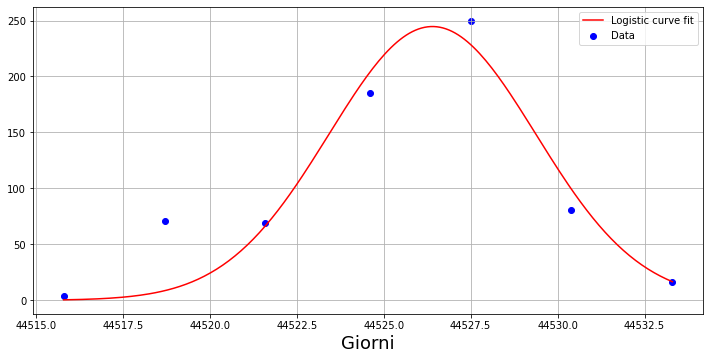

208.12998495334554 18.80439598452172 44516.22025952857
3.1144326572581966


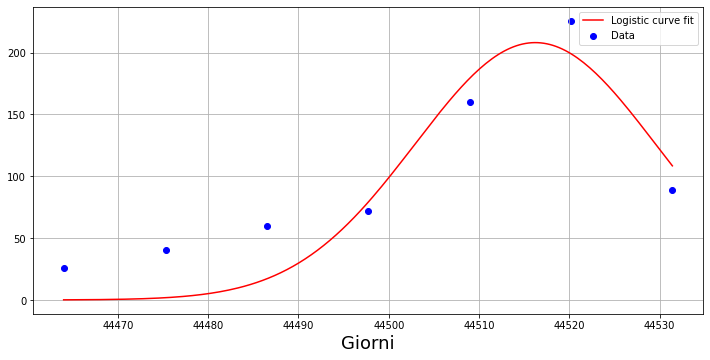

196.11385805263026 13.081548305579819 44495.68753735216
32.49937434011249


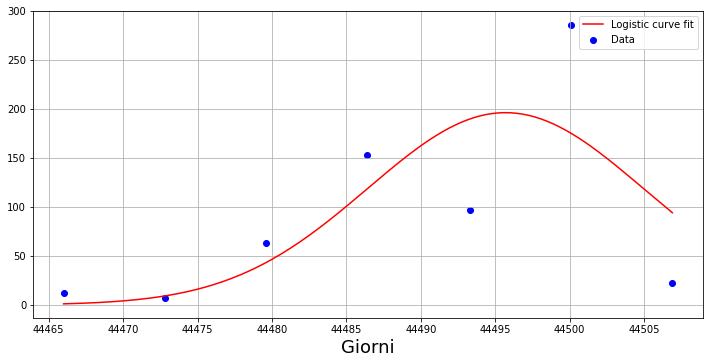

605.0338197440857 -1.1808045428518827 44451.3034165084
161.91230390011904


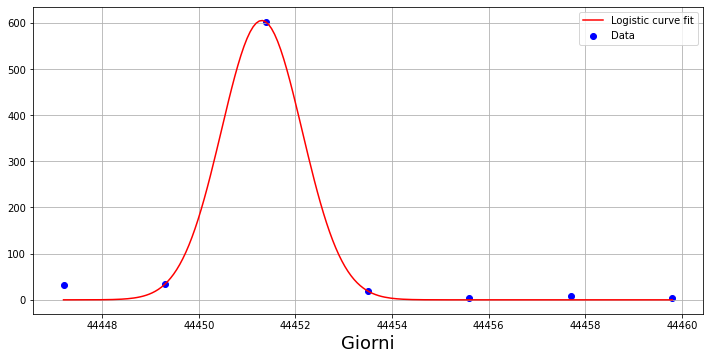

126.67892543785653 9.701795091591794 44514.770210096525
4.264190577395177


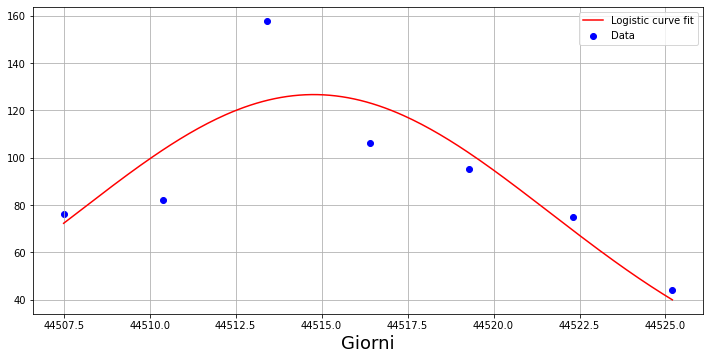

177.89480073320388 33.43714271340491 44585.92017507383
0.9355458082765743


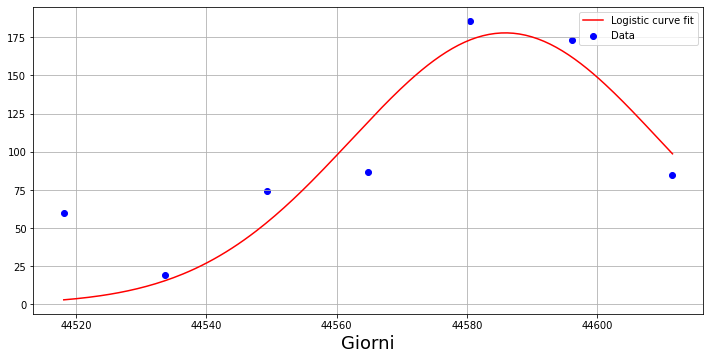

290.95923471632636 13.36400193263156 44569.15489284071
1.4825801898499782


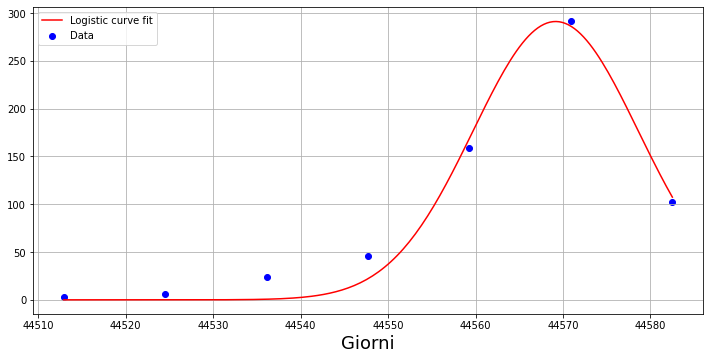

217.07547805035958 34.05223758536983 44651.9256291025
1.8153115554214936


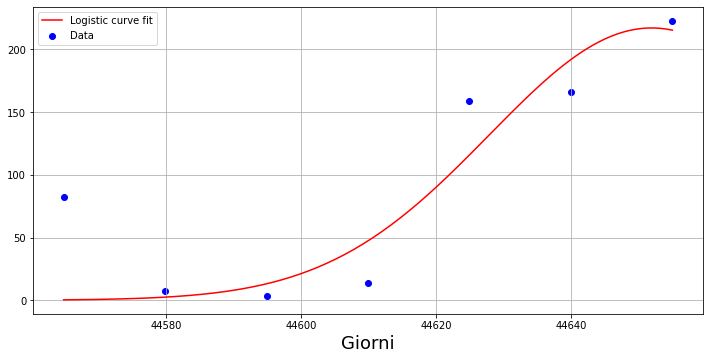

377.9358501911785 203.15099472497658 44395.43784979233
0.09716158654040763


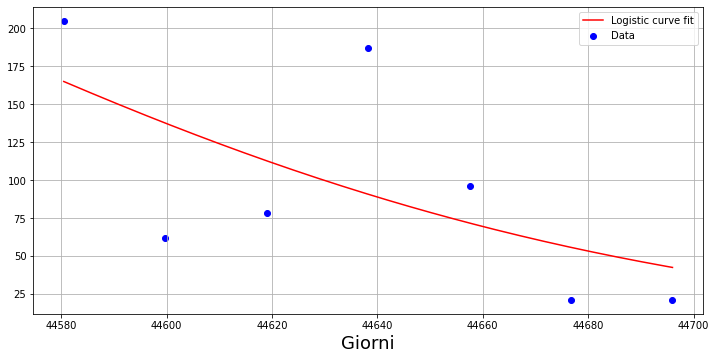

129.99718590875787 124.15412666336677 44559.10137342814
0.14484425949358862


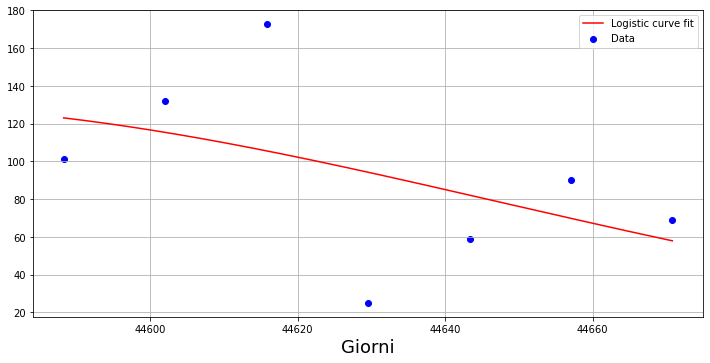

141.61835604423865 24.480723162965656 44612.27129092891
2.406798587903768


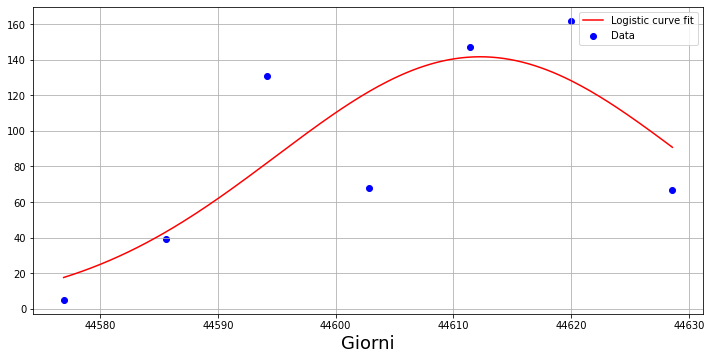

220.71421292999793 27.53592499342386 44497.6610003437
9.353296237357545


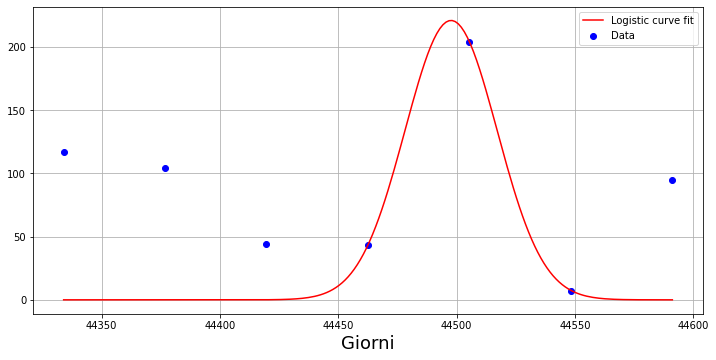

124.33212165075288 94.88274696474657 44331.34356856126
0.09508029393535715


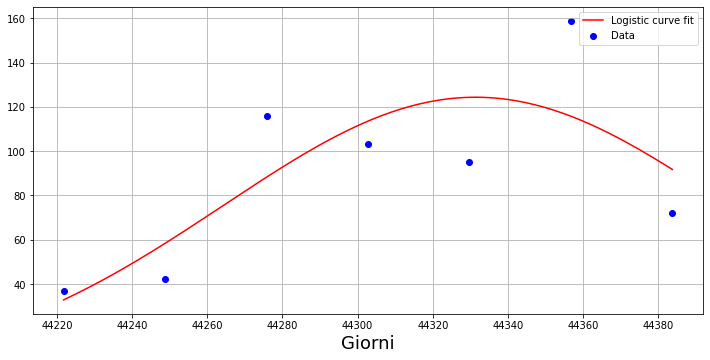

151.54346042639747 79.96442892583208 44393.360187962826
0.21905924189301723


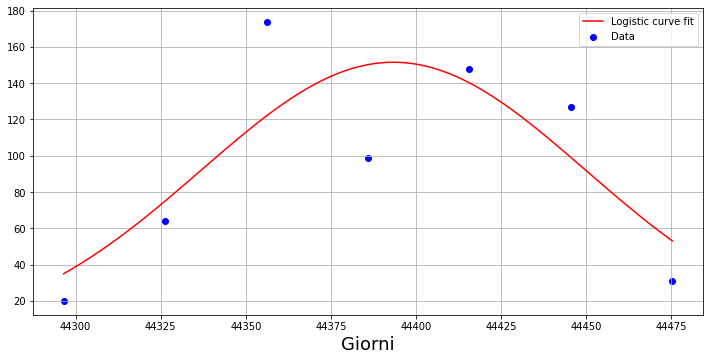

189.8091239829303 16.3727835362484 44395.70185446734
37.32651965531805


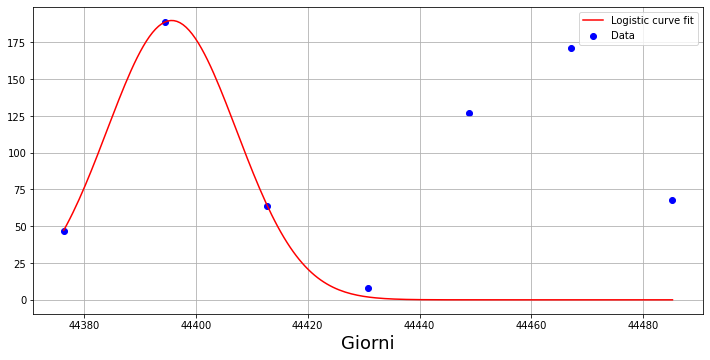

151.2248389198669 37.29081470869313 44400.46204708953
1.8831166366059524


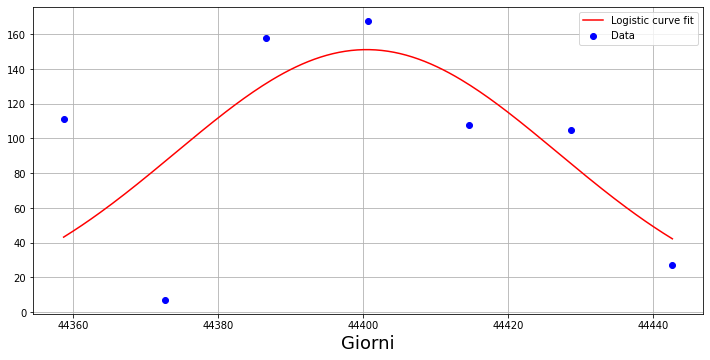

145.66705242278576 57.83867249876949 44501.52265532313
0.41807808860097023


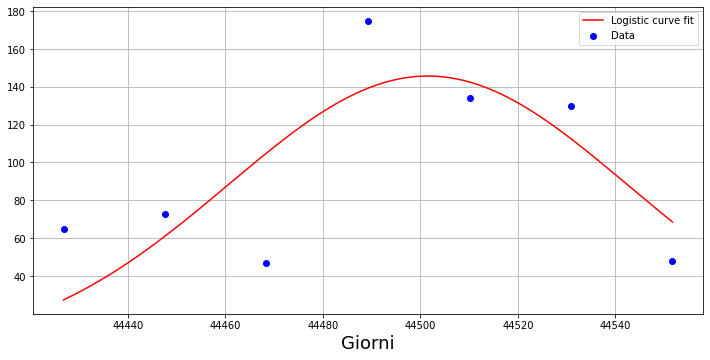

175.5448782858348 30.642265927517663 44547.89760861353
1.142116082211267


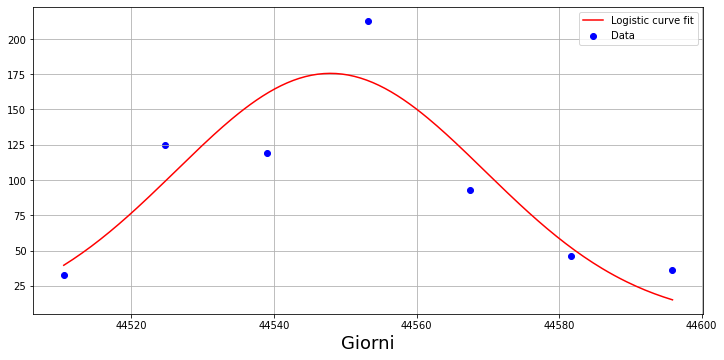

201.4408464978233 21.25963654385584 44580.31731553247
4.186548719058478


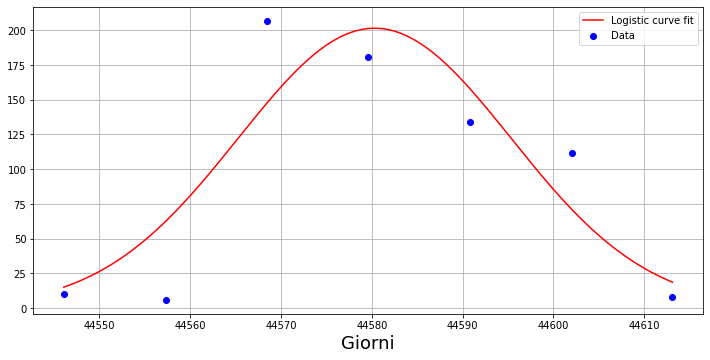

113.23721457999963 47.065818811568164 44558.868937847656
4.967403790625157


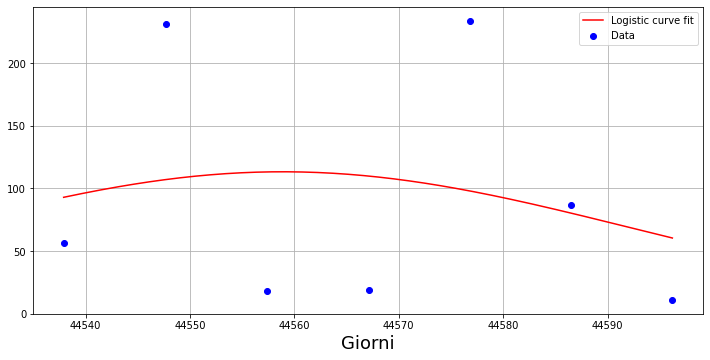

305.21632959302724 9.756011798878495 44613.82116676814
116.07395394304805


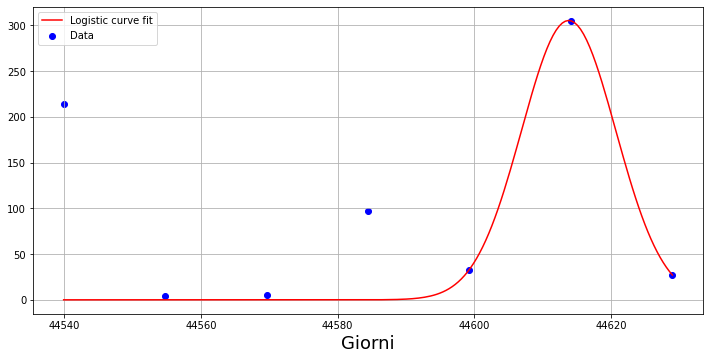

141.67432823114947 61.80432159335173 44746.87250139677
0.2644077836336204


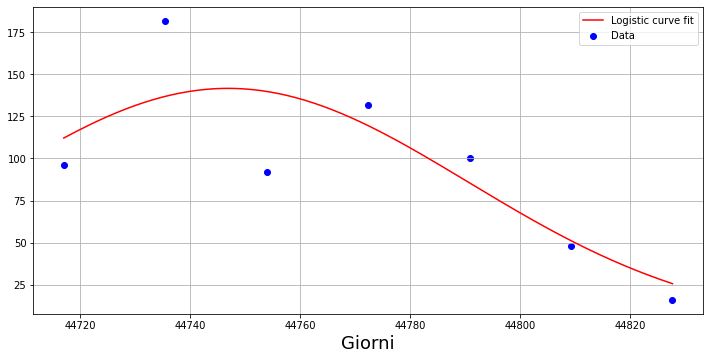

106.5606018927235 110.24454784298023 44690.99063275775
0.07720435819619047


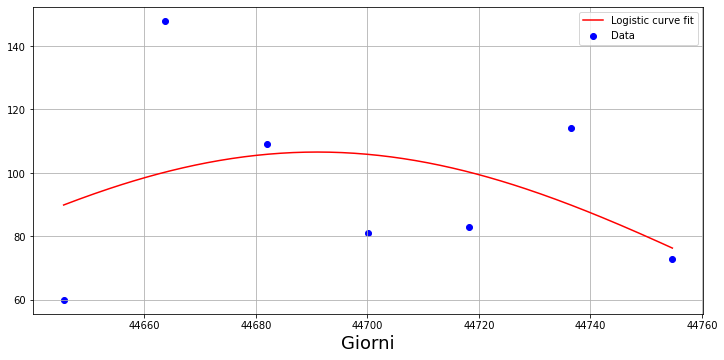

217.7454856982922 18.415237400561832 44493.283716459795
4.914952192692053


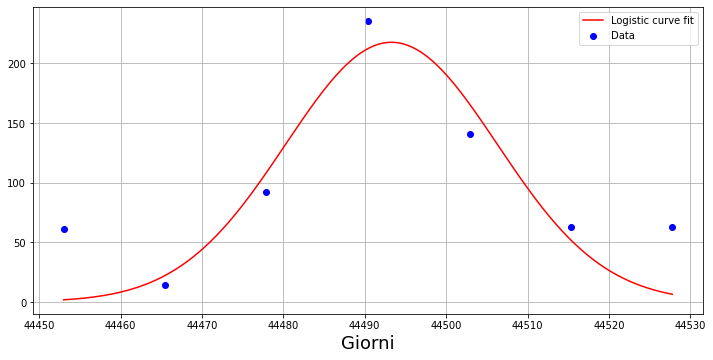

274.2547958179112 30.771997898084788 44556.33059985321
2.083177403990376


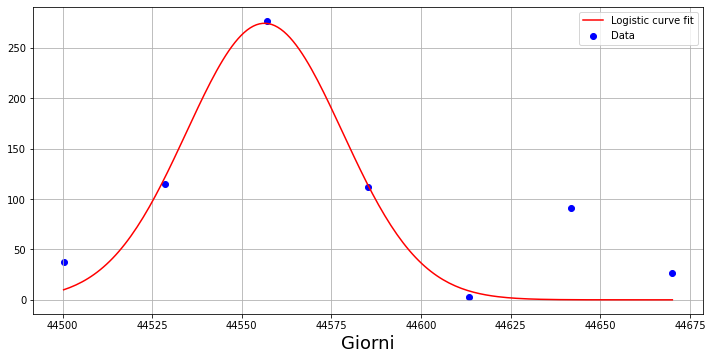

158.730707858353 47.629282774972246 44518.65005013927
0.4741923120097414


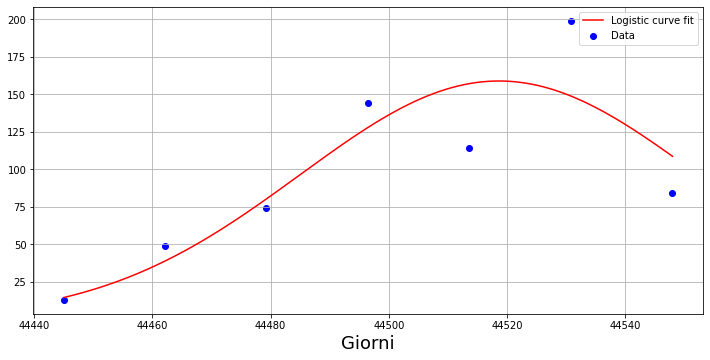

178.60913677801724 49.7741382664517 44569.90493054
2.71406898763589


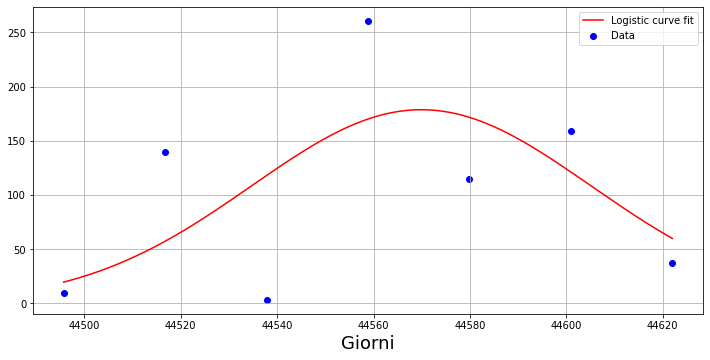

588.4071461328512 86.89820053801911 44521.81507779597
0.25345922972031637


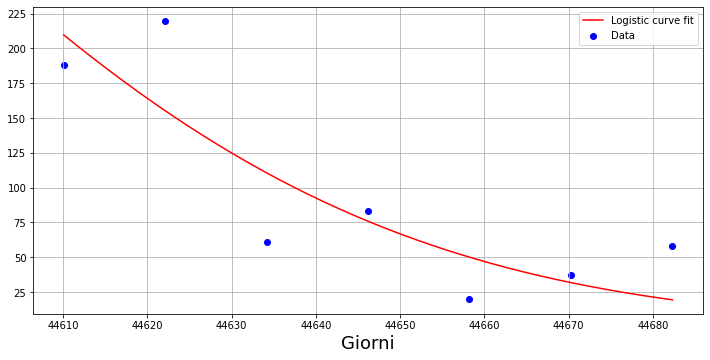

131.8576044122007 39.89645008851542 44626.34708626542
0.8281429978977635


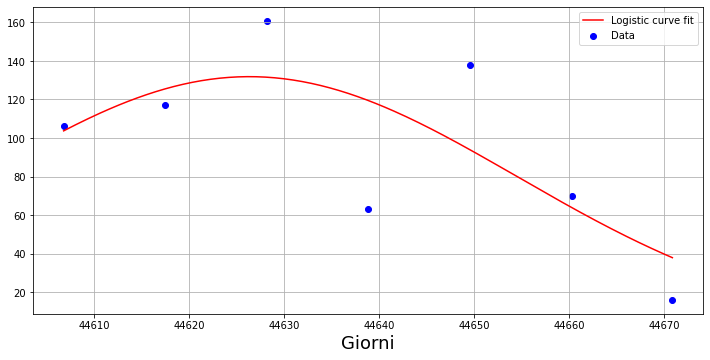

157.36218307994912 34.461656106563964 44682.61608187116
0.633789173815295


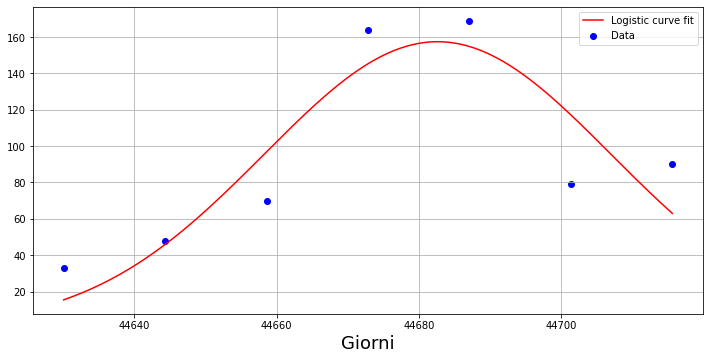

160.28085546109563 28.040731957419435 44713.694693583864
3.2870335931248476


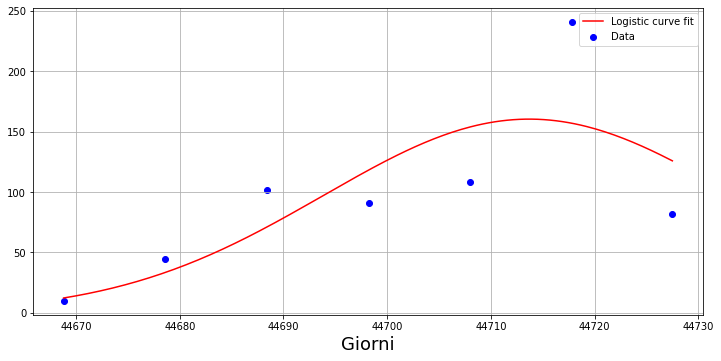

114.63639932048548 66.60944083309238 44696.89175649674
0.6433594216349127


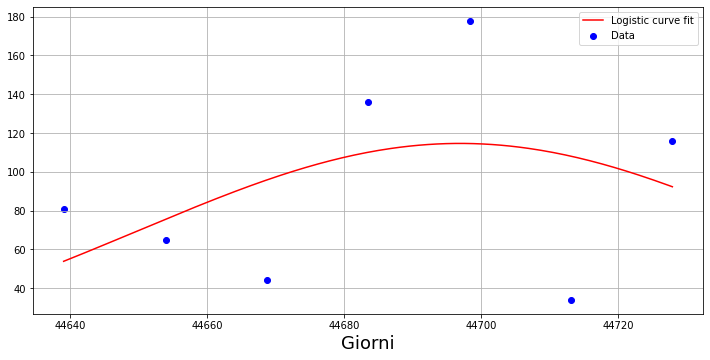

129.30065122858747 20.853061447141503 44705.43516044016
2.97719377728345


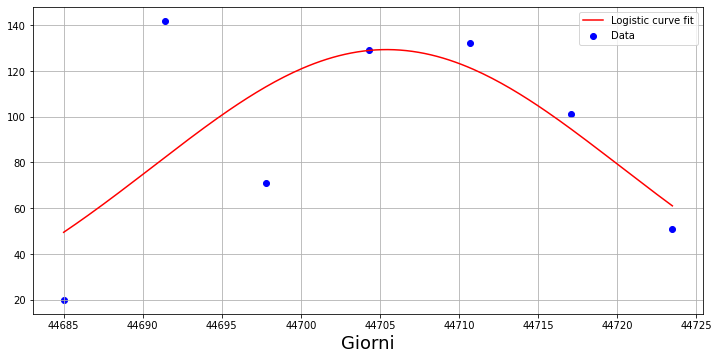

181.9180321676649 11.317971631452082 44705.83187427377
16.973552771113418


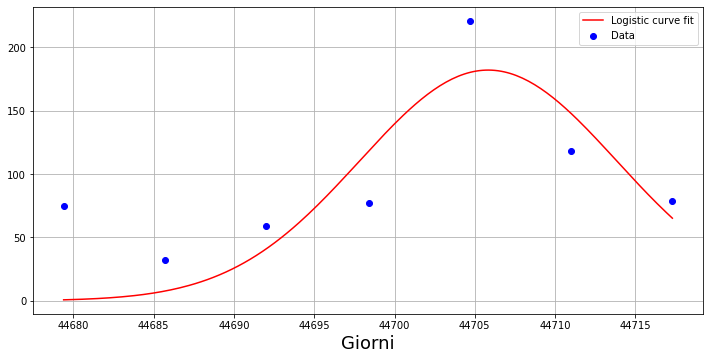

134.25937232302383 26.12274821893694 44694.31357382693
2.7613455837902694


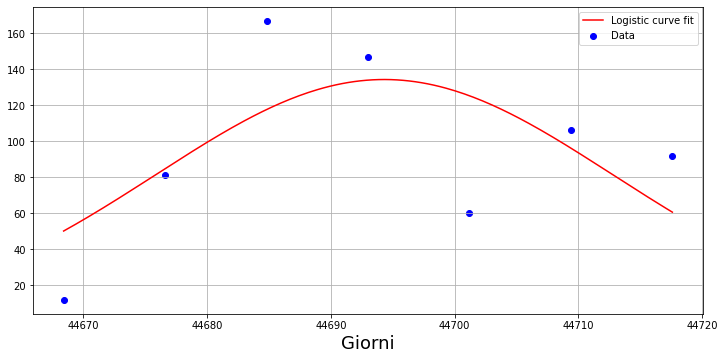

270.7654299986197 8.02991877334201 44712.19784409248
16.278975154172247


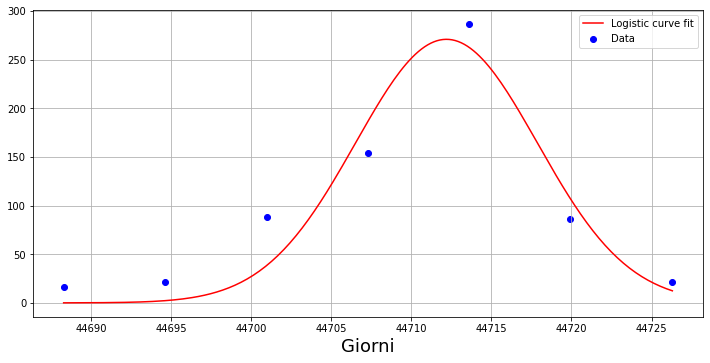

247.12294811601436 11.819978095009638 44710.329069067
17.80760007525621


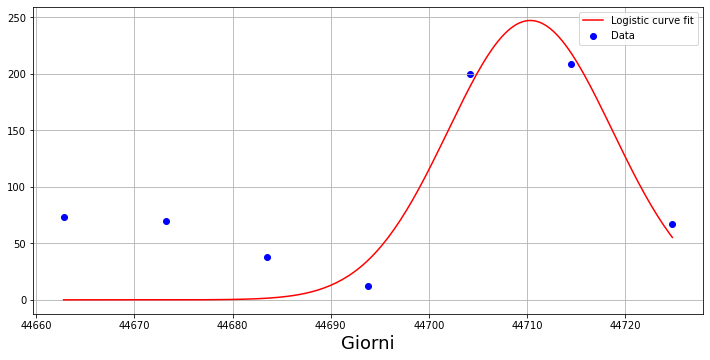

153.85247931785926 35.54876317931395 44652.067793114606
2.47874199360344


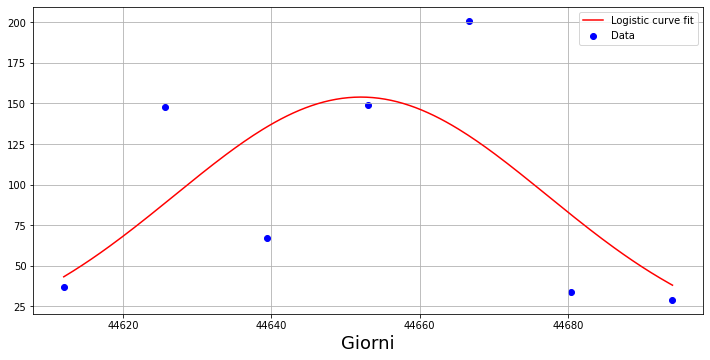

284.0281592837731 9.667928941820623 44692.969030220454
2.4383674783961196


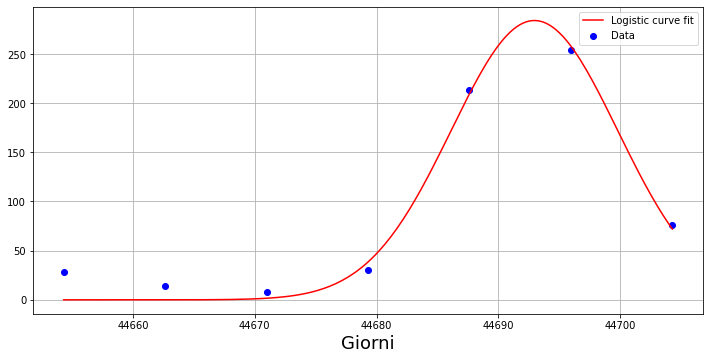

147.24675086374705 17.145598322317777 44706.31947013148
4.236017064325549


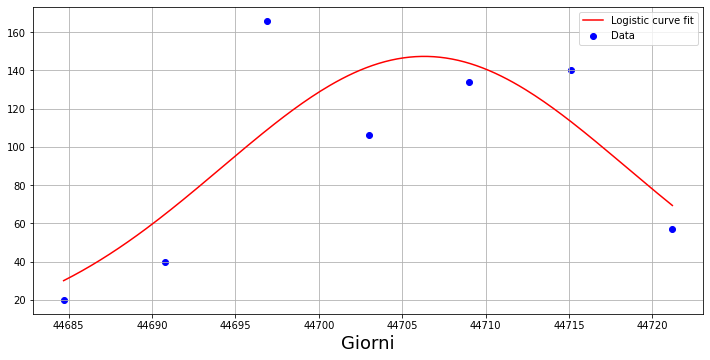

188.08729252860113 -8.436662081746196 44713.82921257904
37.477202155356885


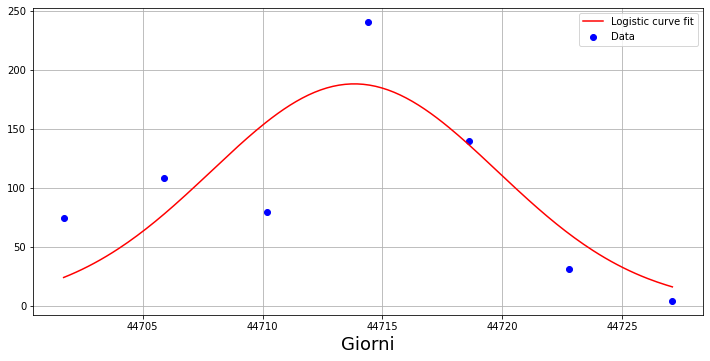

282.00681230326325 22.33938304222968 44709.01753516403
2.6016320486332383


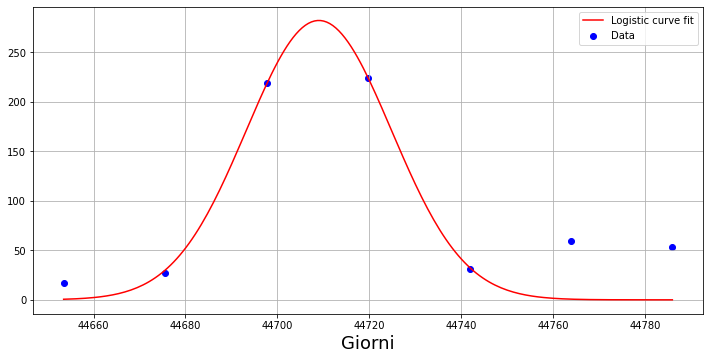

257.70640269486904 21.916682235041456 44655.29473013166
16.58721574180894


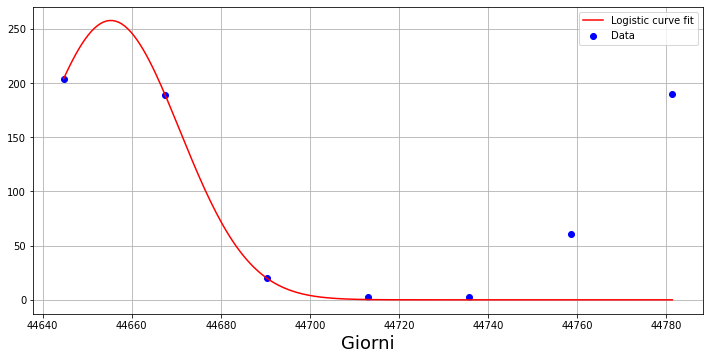

108.47833725327014 72.32233081318473 44784.16253019465
0.5936491102888517


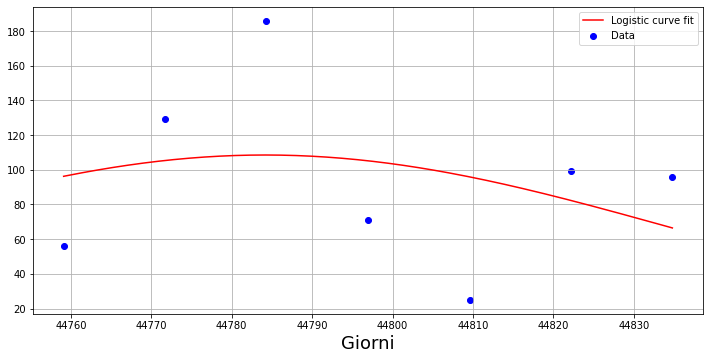

213.30073316926524 197.38567573114113 44488.93803216298
0.00855586063487691


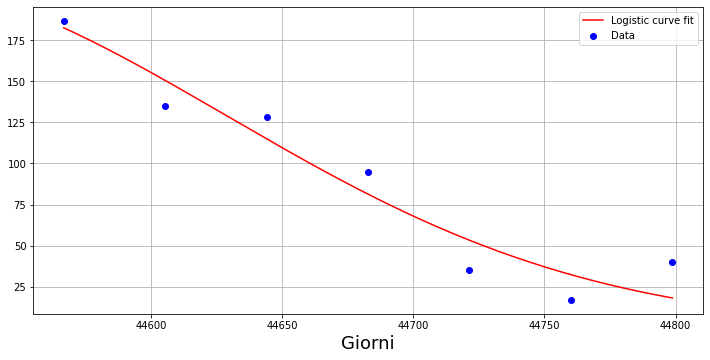

225.70508087872685 30.066166556703234 44755.46638338463
0.7875350039476323


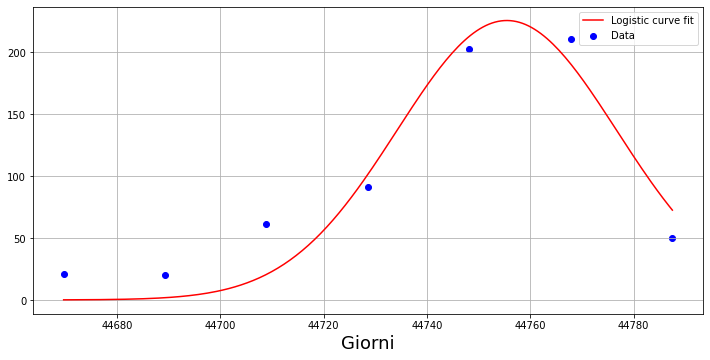

170.7546034954334 45.872556620061964 44708.96728189989
0.24615932078699737


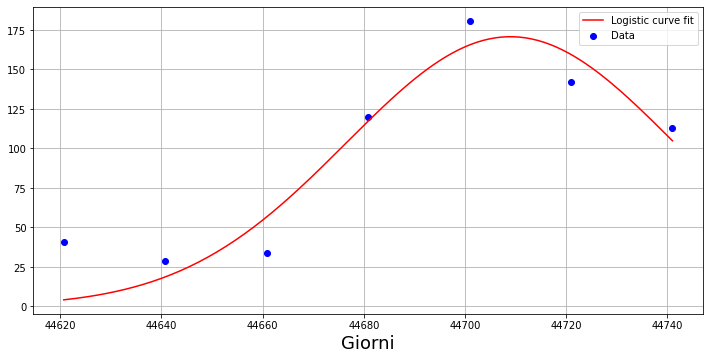

300.2336702111144 10.394360770805658 44641.19143136647
47.9013424440252


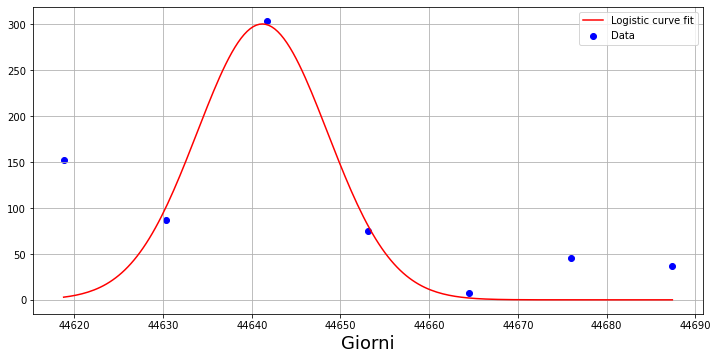

129.9341459543182 30.185620661563334 44630.63870504749
3.8927863002666996


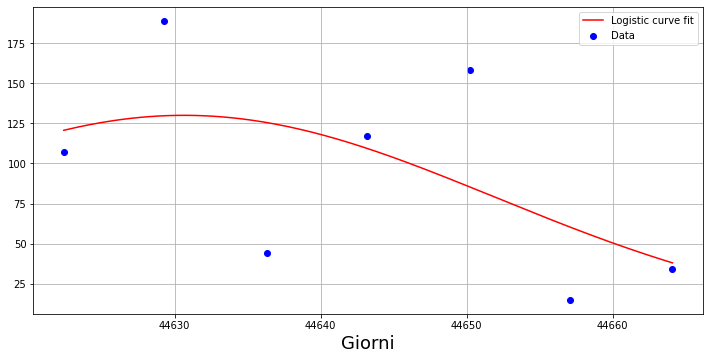

242.93529144225323 27.73878962972961 44691.863861712525
1.3058415010485405


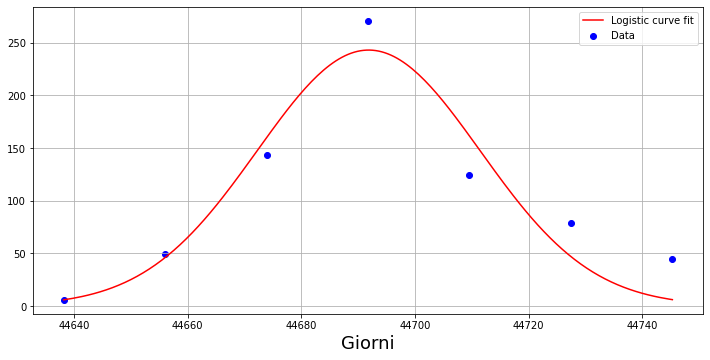

203.8223917320728 21.803203084065196 44618.17958843899
19.481136401308255


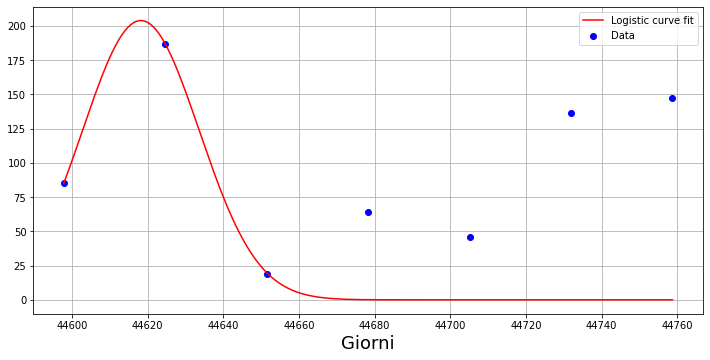

In [257]:
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import matplotlib
import time

def fit_function(x, a, b, c):
    return a*np.exp(-((x-c)/b)**2)

array_di_medie=[]
array_di_varianze=[]
array_di_chi=[]

y=binnes

for k in range(len(y)):
    xx=prezzi[k]
    try:
        initial_values=(np.max(y[k]), 30, xx[np.argmax(y[k])])
        dy=np.full(len(xx), initial_values[1])
        #print(len(dy),len(y[k]))
        pars, covm = curve_fit(fit_function, xx, y[k], initial_values,dy)

        print(pars[0],pars[1],pars[2])
        
        if pars[2]>35000:
            array_di_medie.append(pars[2])
            array_di_varianze.append(pars[1])

        x1=np.linspace(np.min(xx),np.max(xx),200)
        y1=pars[0]*np.exp(-((x1-pars[2])/pars[1])**2)

        chisq = (((y[k] - fit_function(xx, pars[0], pars[1], pars[2]))**2)/pars[1]**2).sum()
        ndof = len(xx)-2
        chisq_norm=chisq/ndof

        array_di_chi.append(chisq_norm)

        print(chisq_norm)

        plt.figure(figsize=[12,26])
        plt.subplot(411)
        plt.plot(x1,y1,marker="",color="red",label='Logistic curve fit')
        plt.scatter(xx,y[k],marker="o",color="blue",label='Data')
        plt.xlabel("Giorni",fontsize=18)
        plt.grid()
        plt.legend()
        plt.show()
        
    except:
        pass
    

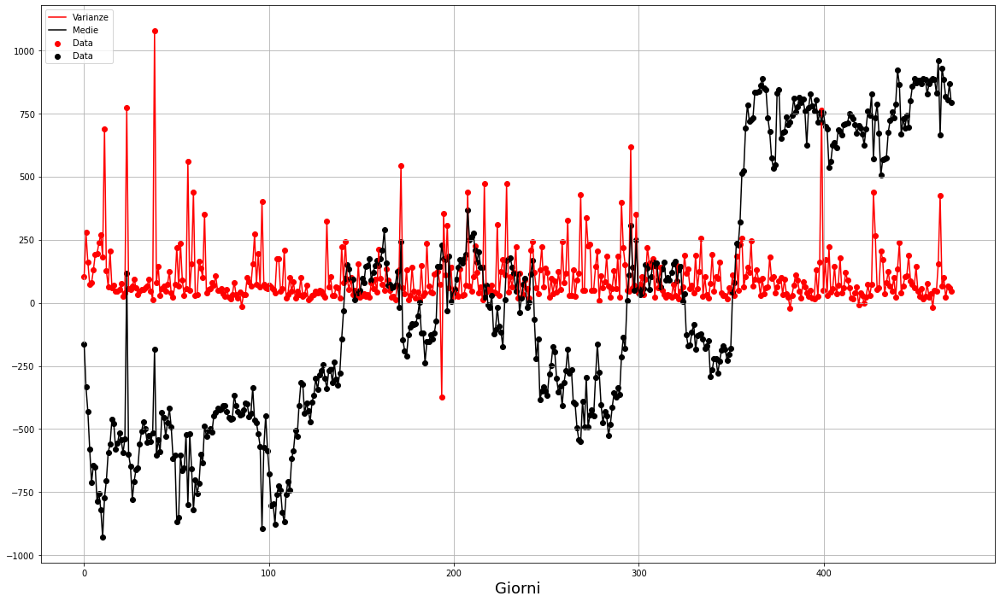

In [262]:
x1=np.linspace(0,len(array_di_varianze),len(array_di_varianze))
#print(array_di_medie)
plt.figure(figsize=[20,12])
#plt.subplot(411)
#print(array_di_varianze)
vari=array_di_varianze
medi=array_di_medie
array_di_varianze2=[]
array_di_medie2=[]
for n in range(len(vari)):
    #print(vari[n])
    if vari[n]<100*np.mean(vari):
        #print('ok')
        if np.abs(medi[n])<100*np.mean(np.abs(medi)):
            array_di_varianze2.append(vari[n])
            array_di_medie2.append(medi[n])
            
x1=np.linspace(0,len(array_di_varianze2),len(array_di_varianze2))       

plt.plot(x1,(array_di_varianze2/np.mean(array_di_varianze2))/0.01,marker="",color="red",label='Varianze')
plt.plot(x1,array_di_medie2-np.mean(array_di_medie2),marker="",color="black",label='Medie')
plt.scatter(x1,(array_di_varianze2/np.mean(array_di_varianze2))/0.01,marker="o",color="red",label='Data')
plt.scatter(x1,array_di_medie2-np.mean(array_di_medie2),marker="o",color="black",label='Data')
#plt.scatter(x1,array_di_chi/np.mean(array_di_chi),marker="o",color="blue",label='Data')
plt.xlabel("Giorni",fontsize=18)
plt.grid()
plt.legend()
plt.show()

In [41]:
#Let's iterate the process in order to make a fit for every 15 minutes data, and the the parameters distributions
# frames between transitions
import imageio
n_frames = 10
x = [1, 2, 3, 4, 5,6,7,8,9,10,11,12,13,14,15]
coordinates_lists = temp
print('Creating charts\n')
filenames = []
for index in np.arange(0, len(coordinates_lists)-1):
    # get current and next y coordinates
    y = coordinates_lists[index]
    y1 = coordinates_lists[index+1]
    
    # calculate the distance to the next position
    y_path = np.array(y1) - np.array(y)    
    for i in np.arange(0, n_frames + 1):
        # divide the distance by the number of frames 
        # and multiply it by the current frame number
        y_temp = (y + (y_path / n_frames) * i)        # plot
        plt.bar(x, y_temp)
        plt.ylim(0,800)       # build file name and append to list of file names
        filename = f'frame_{index}_{i}.png'
        filenames.append(filename)        # last frame of each viz stays longer
        if (i == n_frames):
            for i in range(5):
                filenames.append(filename)        # save img
        plt.savefig(os.path.join(code_dir,filename))
        plt.close()
        print('Charts saved\n')# Build GIF
print('Creating gif\n')
with imageio.get_writer('mybars.gif', mode='I') as writer:
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
print('Gif saved\n')
print('Removing Images\n')
# Remove files
for filename in set(filenames):
    os.remove(filename)
print('DONE')

Creating charts

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Charts saved

Creating gif

Gif saved

Removing Images

DONE
